## Итоговый алгоритм

In [1]:
def rotation_matrix_from_vectors(vec1, vec2):
    """ Find the rotation matrix that aligns vec1 to vec2
    :param vec1: A 3d "source" vector
    :param vec2: A 3d "destination" vector
    :return mat: A transform matrix (3x3) which when applied to vec1, aligns it with vec2.
    """
    a, b = (vec1 / numpy.linalg.norm(vec1)).reshape(3), (vec2 / numpy.linalg.norm(vec2)).reshape(3)
    v = numpy.cross(a, b)
    if any(v): #if not all zeros then 
        c = numpy.dot(a, b)
        s = numpy.linalg.norm(v)
        kmat = numpy.array([[0, -v[2], v[1]], [v[2], 0, -v[0]], [-v[1], v[0], 0]])
        return numpy.eye(3) + kmat + kmat.dot(kmat) * ((1 - c) / (s ** 2))

    else:
        return numpy.eye(3) #cross of all zeros only occurs on identical directions

In [456]:
def get_prediction_56_percent(ampl, var, ampl_z, pick_x, pick_y, move_x, move_y, move_z, num):
    if num in advanced:
        if ampl < 0.35:
            return 6
        if ampl < 1.9 and var < 0.007:
            return 5
        if var < 0.01:
            return 8
        return 7
    if ampl < 0.4 and var < 0.35 and pick_y < 0.02:
        return 0 #стояние
    if ampl > 3 and var > 0.45 and pick_y > 0.1:
        return 2
    if (0.08 < var < 0.5 or (1 < pick_x < 2)) and 1.4 < ampl < 7:
        return 4
    elif 1.4 < ampl < 7 and (1 < pick_x < 2):
        return 1
    if ampl > 2 and (var < 0.1):
        return 3
    '''
    if (0.8 < pick_x < 2) or (pick_y > 0.04) or (var > 0.1):
        if (var < 0.13):
            return 4
        return 1
    ''' 
    return 1

In [205]:
classes = {'тояни' : 0, 'месте' : 0, 'тою' : 0, 'yat' : 0, 'окой' : 0, 'шаг' : 1, 'одьб' : 1, 'аг' : 1, 'go' : 1, 'ег' : 2, 'run' : 2, 'елоси' : 3, 'естн' : 4, 'одъ' : 4, 
           'втомо' : 5, 'ашин' : 5, 'авто' : 5, 'метро' : 6, 'лектро' : 7, 'амок' : 8, 'tair' : 4}

answers = {'стояние' : 0, 'ходьба' : 1, 'бег' : 2, 'велосипед' : 3, 'лестница' : 4, 
           'автомобиль' : 5, 'метро' : 6, 'электросамокат' : 7, 'самокат' : 8}
def get_action(name):
    for act in classes:
        if name.lower().find(act) != -1:
            return classes[act]
    return -1

In [2]:
def rotate(X, Y, Z, Mat):
    new_x = []
    new_y = []
    new_z = []
    
    for elem in zip(X,Y,Z):
        res = Mat.dot(elem)
        new_x.append(res[0])
        new_y.append(res[1])
        new_z.append(res[2])
        
    return new_x, new_y, new_z

In [3]:
def integrate(lst):
    res = []
    s = 0
    for elem in lst:
        s += elem
        res.append(s)
    return res

In [276]:
import os
import pandas as pd
path = r'/Users/ksushazinoveva/Downloads/kaggle_data'
data = {}

Data = []
Target = []

i=0
for dir_entry in os.listdir(path):
    dir_entry_path = os.path.join(path, dir_entry)
    if os.path.isfile(dir_entry_path):
        i+=1
        with open(dir_entry_path, 'r') as my_file:
            df = pd.read_csv(my_file, delimiter=';')
            if df.shape[1] != 5:
                print(dir_entry_path.split("\\")[-1], df.shape)
            else:
                Data.append(df)
                Target.append(dir_entry_path.split("\\")[-1])

for dir_entry in os.listdir(path):
    dir_entry_path = os.path.join(path, dir_entry)
    if os.path.isfile(dir_entry_path):
        i+=1
        with open(dir_entry_path, 'r') as my_file:
            df = pd.read_csv(my_file, delimiter=',')
            if df.shape[1] == 5:
                print(dir_entry_path.split("\\")[-1])
                Data.append(df)
                Target.append(dir_entry_path.split("\\")[-1])

/Users/ksushazinoveva/Downloads/kaggle_data/track_1.csv (31819, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_52.csv (1713, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_46.csv (6049, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_91.csv (2147, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_85.csv (16151, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_84.csv (2524, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_90.csv (4496, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_47.csv (2524, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_53.csv (12393, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_0.csv (3504, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_2.csv (31400, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_79.csv (23181, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_45.csv (2596, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_51.csv (15074, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_86.csv (2

/Users/ksushazinoveva/Downloads/kaggle_data/track_9.csv (39238, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_58.csv (2904, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_64.csv (10723, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_70.csv (10980, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_141.csv (2599, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_140.csv (16739, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_71.csv (21362, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_65.csv (5096, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_59.csv (2566, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_61.csv (5096, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_75.csv (14186, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_49.csv (13192, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_144.csv (7102, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_145.csv (19494, 1)
/Users/ksushazinoveva/Downloads/kaggle_data/track_4

/Users/ksushazinoveva/Downloads/kaggle_data/track_64.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_70.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_141.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_140.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_71.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_65.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_59.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_61.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_75.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_49.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_144.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_145.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_48.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_74.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_60.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_76.csv
/Users/ksushazinoveva/Downloads/kaggle_data/track_62.csv
/Users/ksushazinoveva/Downl

Нарисуем 9 графиков:

первый ряд:

1) исходные данные

2) норма ускорения

3) FFT от нормы ускорения


второй ряд:

4) FFT от ax (старая ось, но можно и от новой)

5) FFT от ay (старая ось, но можно и от новой)

6) FFT от az (старая ось, но можно и от новой)


третий ряд:

7) перемещение вдоль оси x

8) перемещение вдоль оси y

9) перемещение вдоль оси z

Populating the interactive namespace from numpy and matplotlib


/Users/ksushazinoveva/opt/anaconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['plt']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


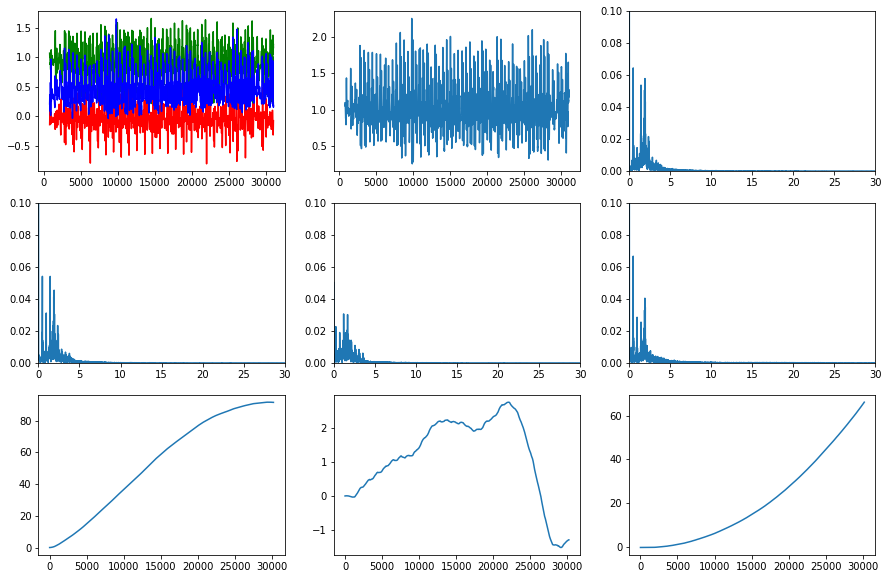

/Users/ksushazinoveva/Downloads/kaggle_data/track_1.csv
0.4798305701710844
0.0645067017539682


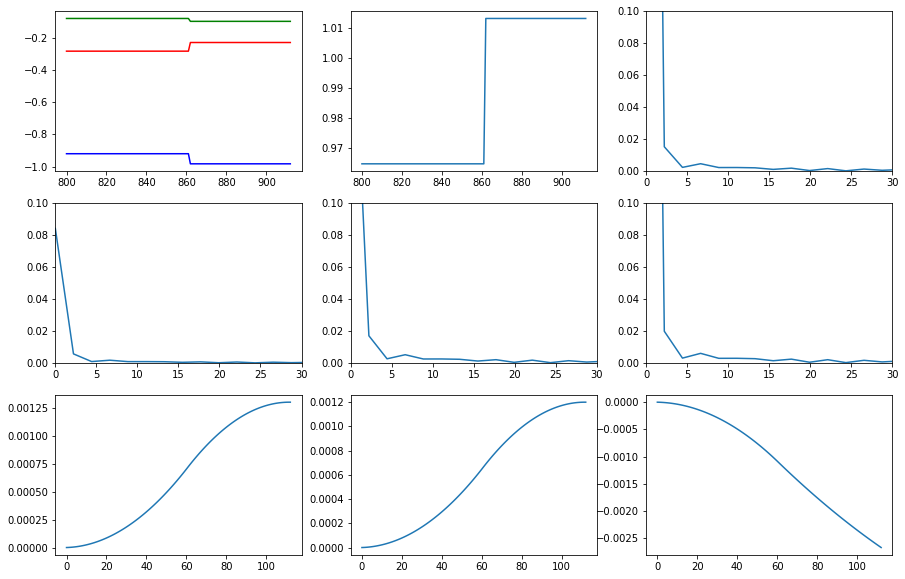

/Users/ksushazinoveva/Downloads/kaggle_data/track_52.csv
2.2123893805309733
0.015213338553121755


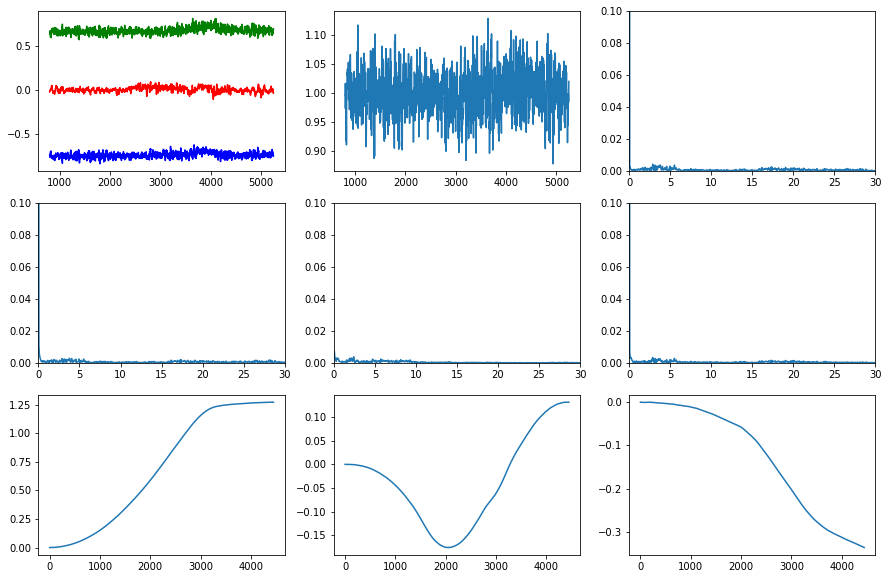

/Users/ksushazinoveva/Downloads/kaggle_data/track_46.csv
2.8658125421443024
0.004262812093909741


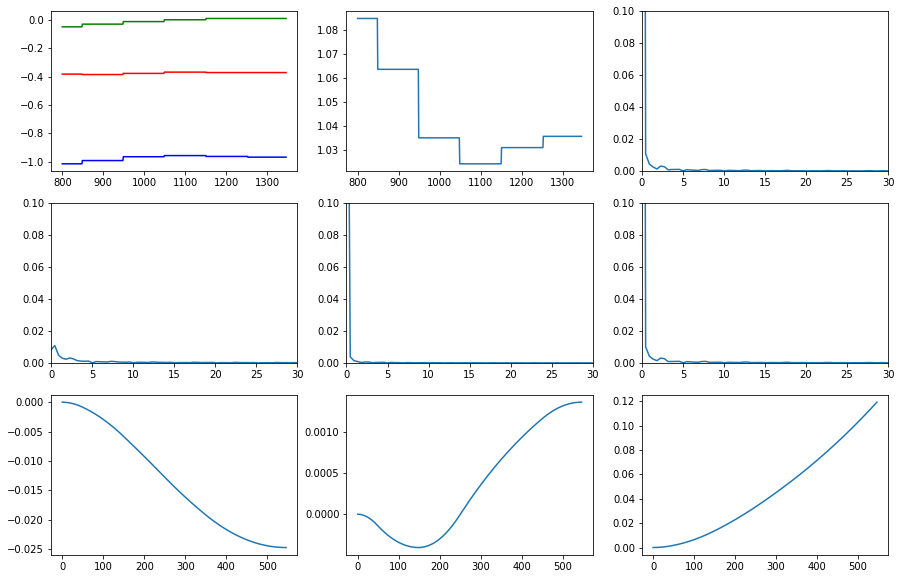

/Users/ksushazinoveva/Downloads/kaggle_data/track_91.csv
0.45703839122486284
0.010743782406388777


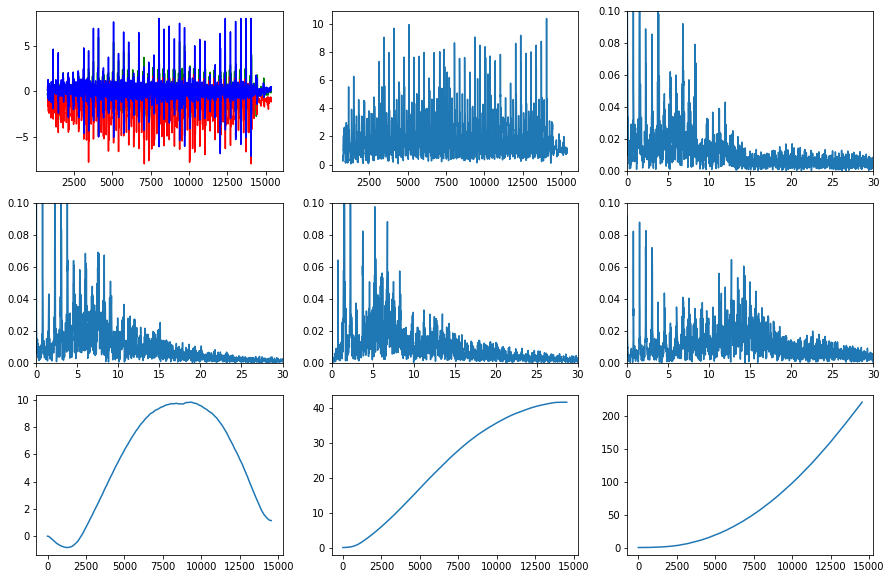

/Users/ksushazinoveva/Downloads/kaggle_data/track_85.csv
1.5119235791354546
0.34766917528199087


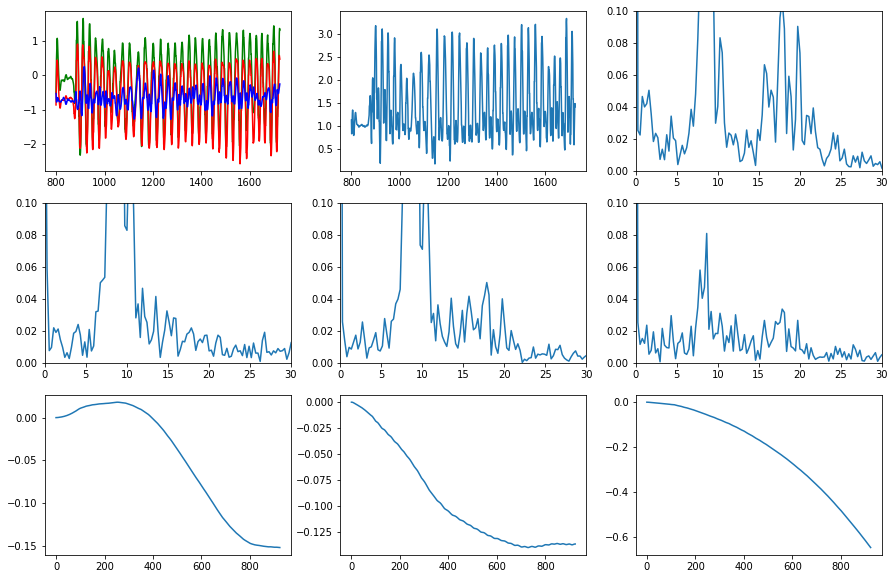

/Users/ksushazinoveva/Downloads/kaggle_data/track_84.csv
8.658008658008658
0.1843748088501288


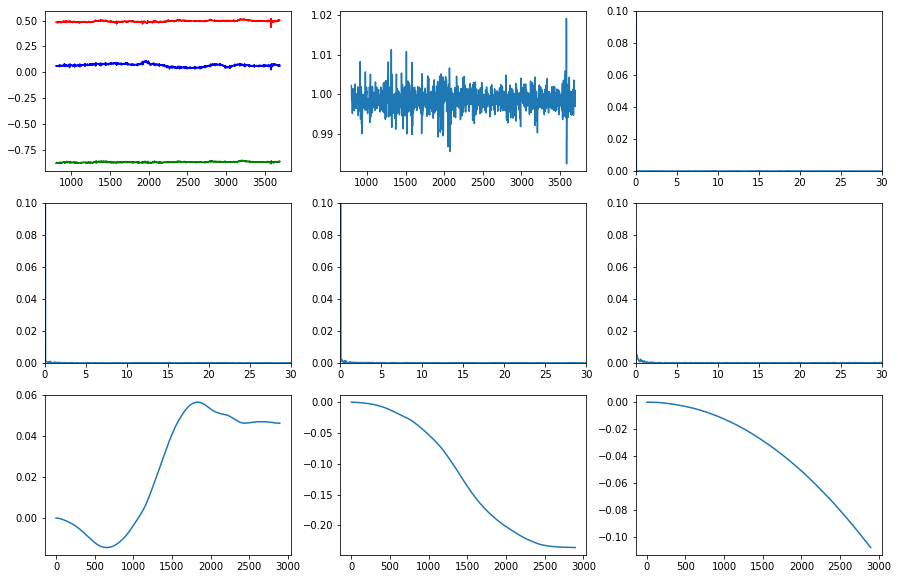

/Users/ksushazinoveva/Downloads/kaggle_data/track_90.csv
15.107044198895029
0.00030815679852981304


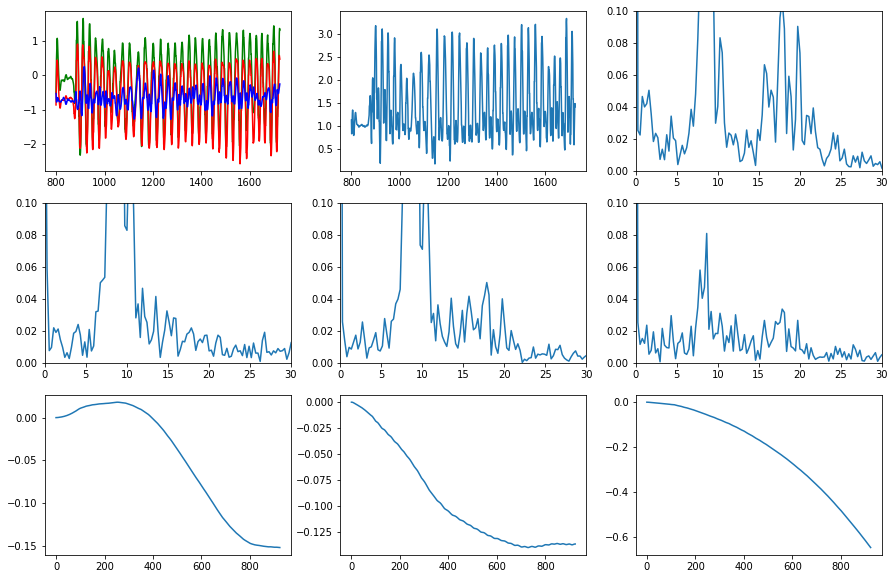

/Users/ksushazinoveva/Downloads/kaggle_data/track_47.csv
8.658008658008658
0.1843748088501288


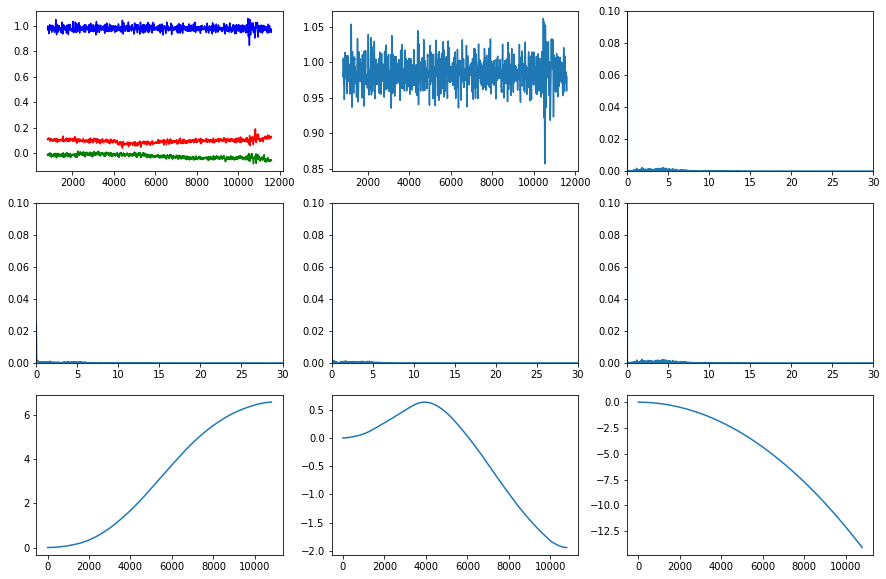

/Users/ksushazinoveva/Downloads/kaggle_data/track_53.csv
1.8067265820439176
0.0021731499961946303


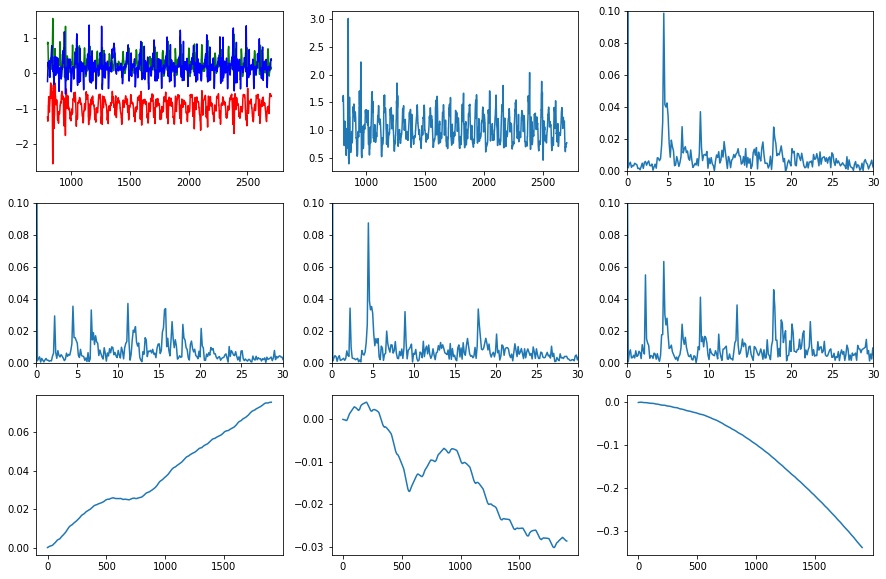

/Users/ksushazinoveva/Downloads/kaggle_data/track_0.csv
4.464285714285714
0.09876217467606192


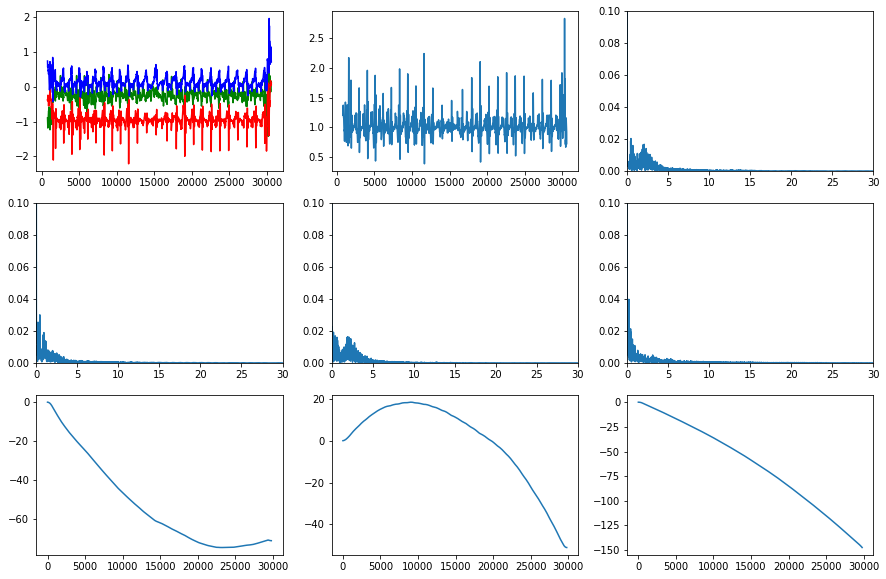

/Users/ksushazinoveva/Downloads/kaggle_data/track_2.csv
0.46140939597315433
0.020351012406946718


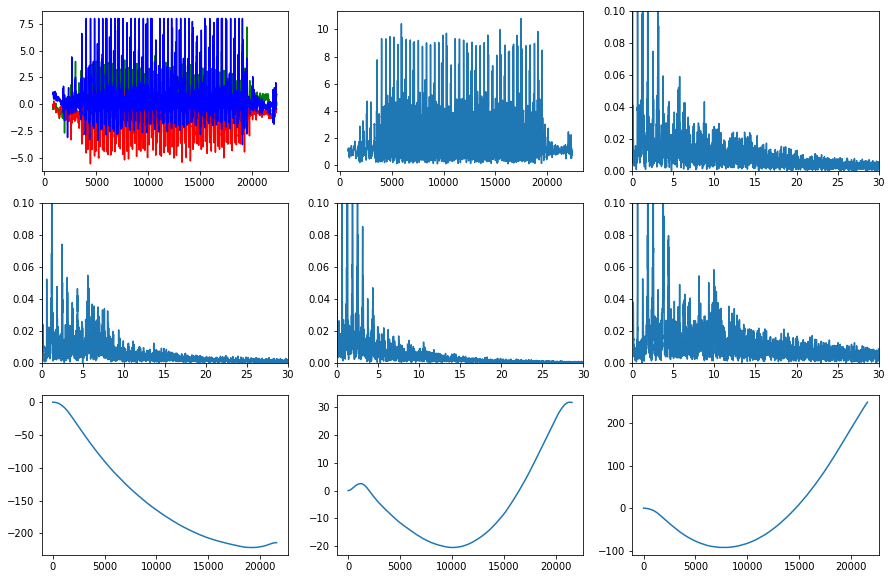

/Users/ksushazinoveva/Downloads/kaggle_data/track_79.csv
1.2511005050739077
0.2814020647596391


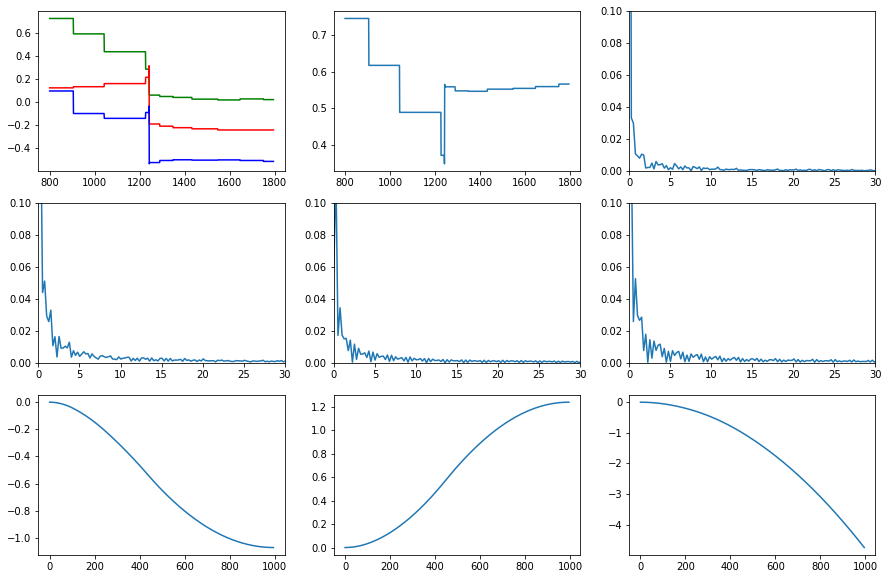

/Users/ksushazinoveva/Downloads/kaggle_data/track_45.csv
0.25100401606425704
0.03328693038722799


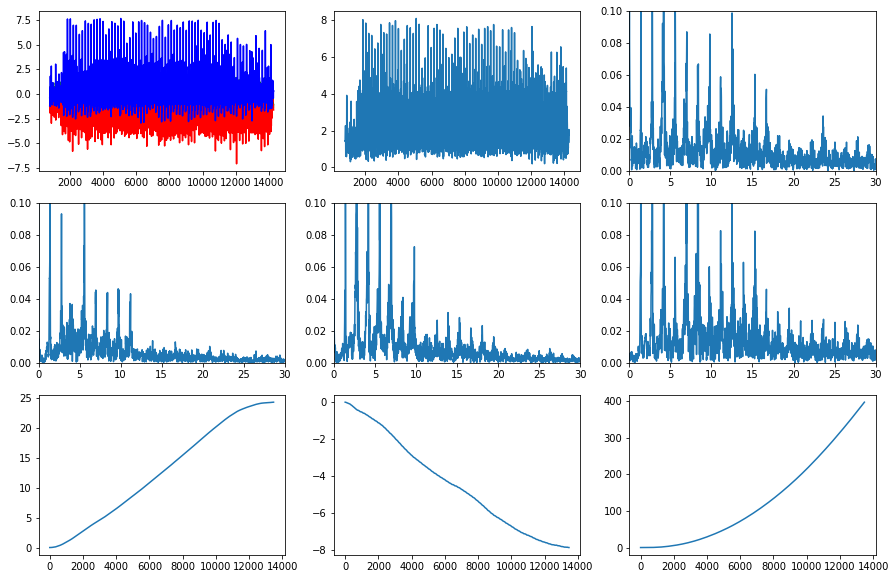

/Users/ksushazinoveva/Downloads/kaggle_data/track_51.csv
4.193261095443075
0.2947713457378027


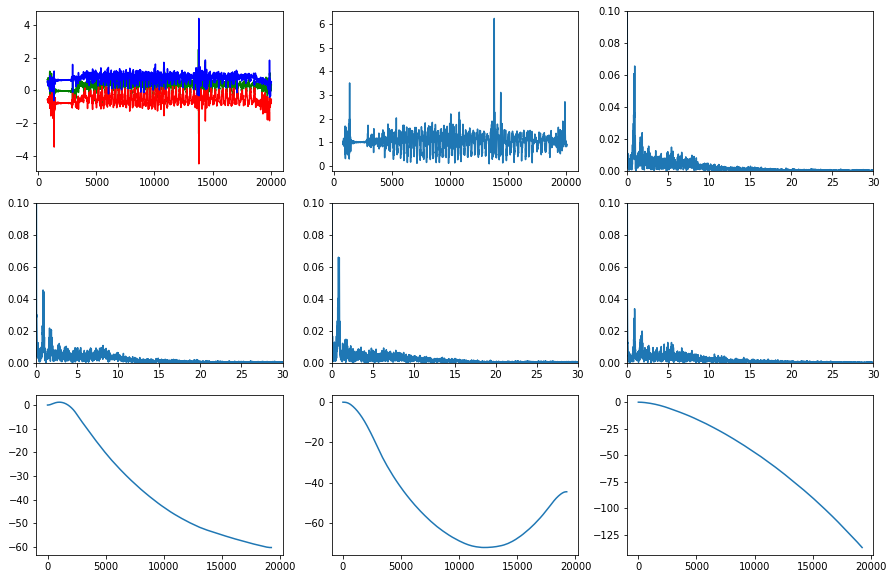

/Users/ksushazinoveva/Downloads/kaggle_data/track_86.csv
0.9221258247181673
0.06571181477047401


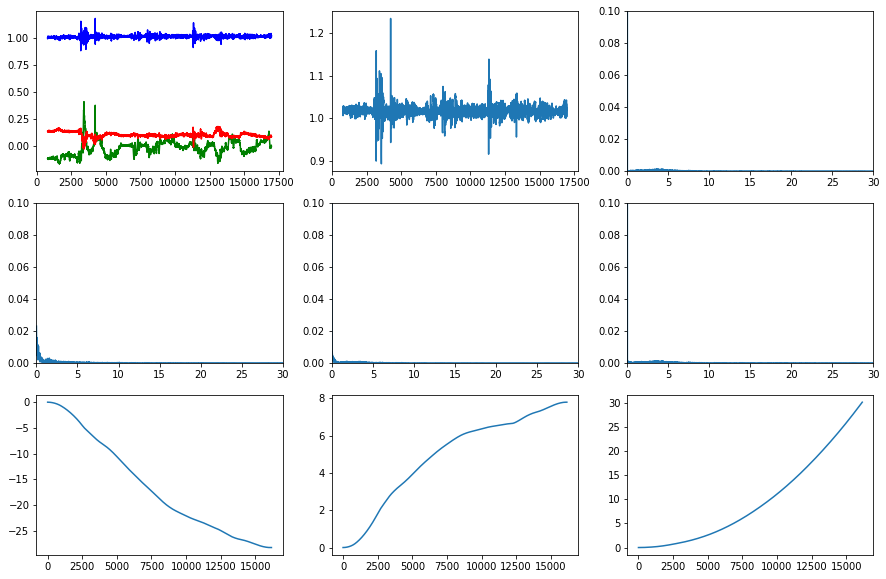

/Users/ksushazinoveva/Downloads/kaggle_data/track_92.csv
3.6807918342097126
0.0013477085469670862


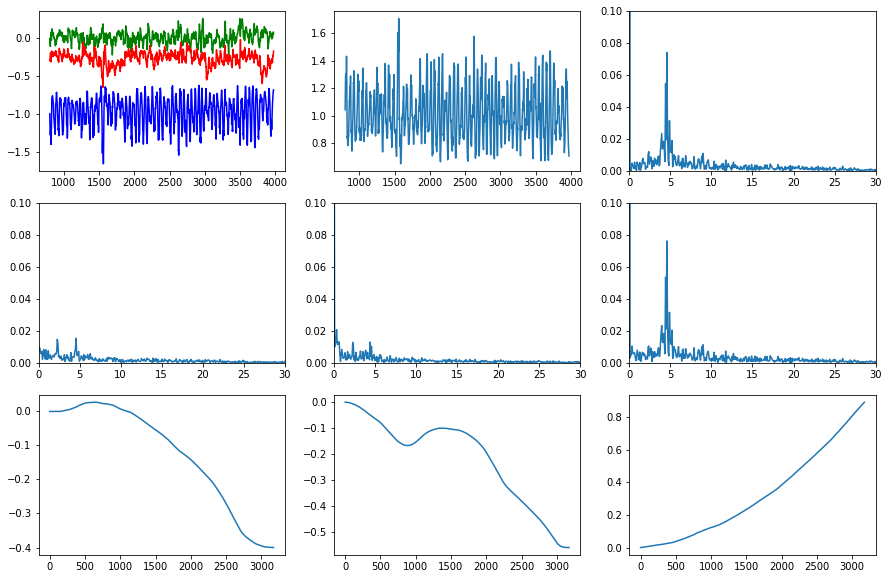

/Users/ksushazinoveva/Downloads/kaggle_data/track_93.csv
4.568367989918085
0.07413667369545349


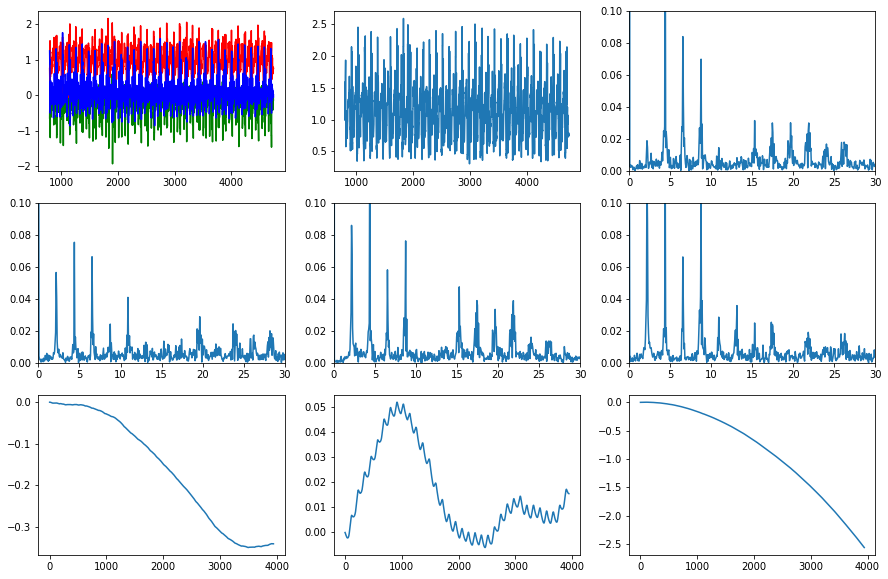

/Users/ksushazinoveva/Downloads/kaggle_data/track_87.csv
4.374841491250317
0.19036467929013537


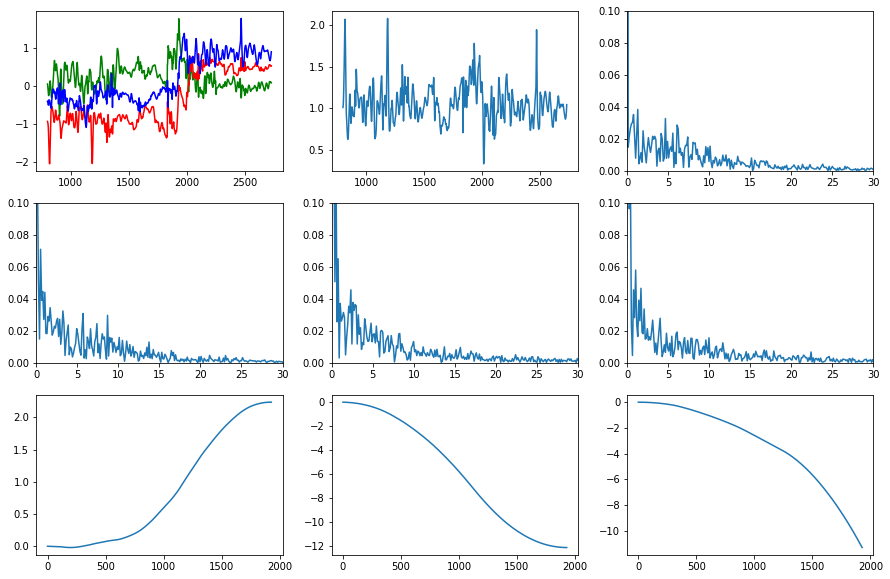

/Users/ksushazinoveva/Downloads/kaggle_data/track_50.csv
1.2953367875647668
0.038548929213062195


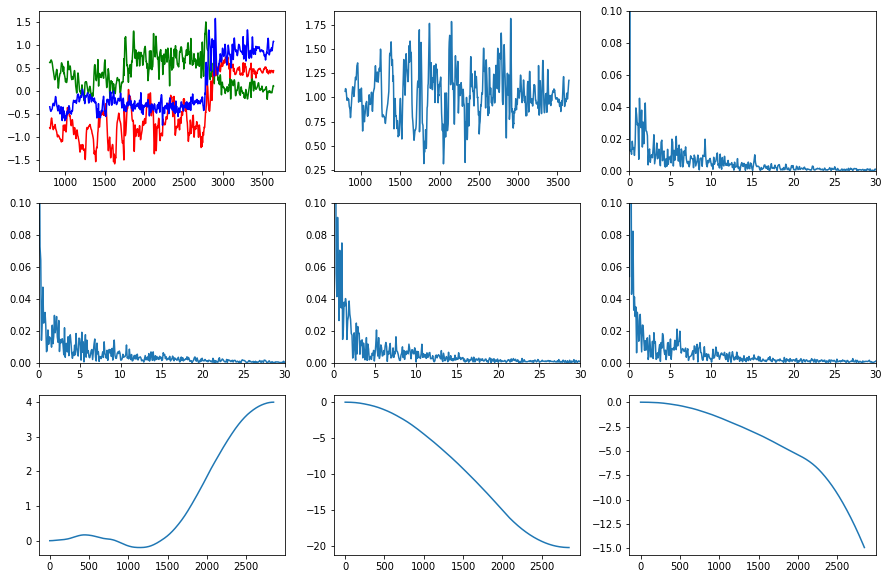

/Users/ksushazinoveva/Downloads/kaggle_data/track_44.csv
1.2293642430628733
0.045549919141056425


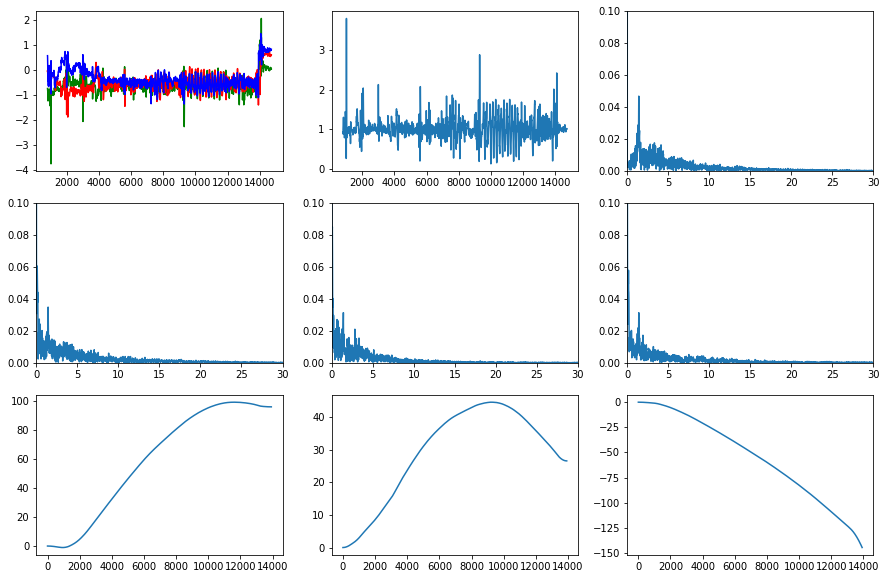

/Users/ksushazinoveva/Downloads/kaggle_data/track_78.csv
1.4184142487790865
0.046864858121964545


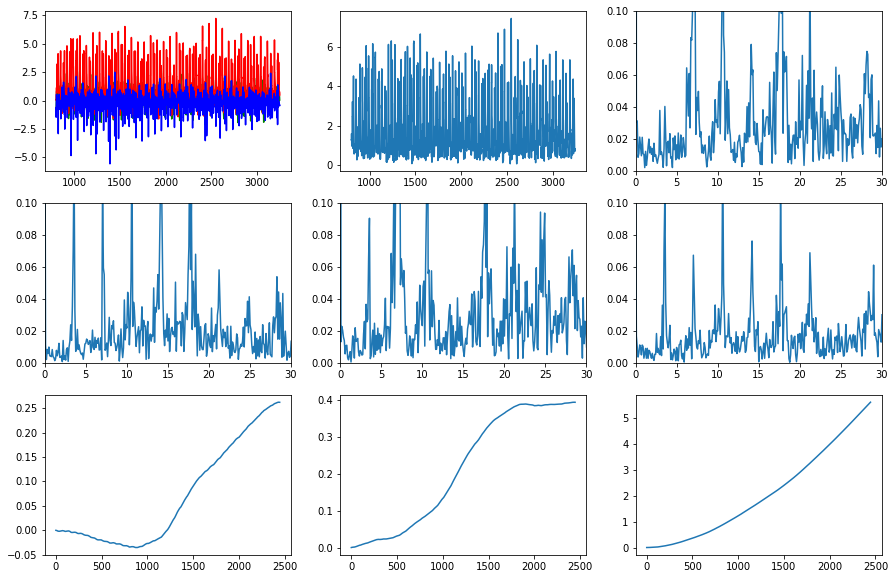

/Users/ksushazinoveva/Downloads/kaggle_data/track_3.csv
7.04944830404577
0.41475534124611485


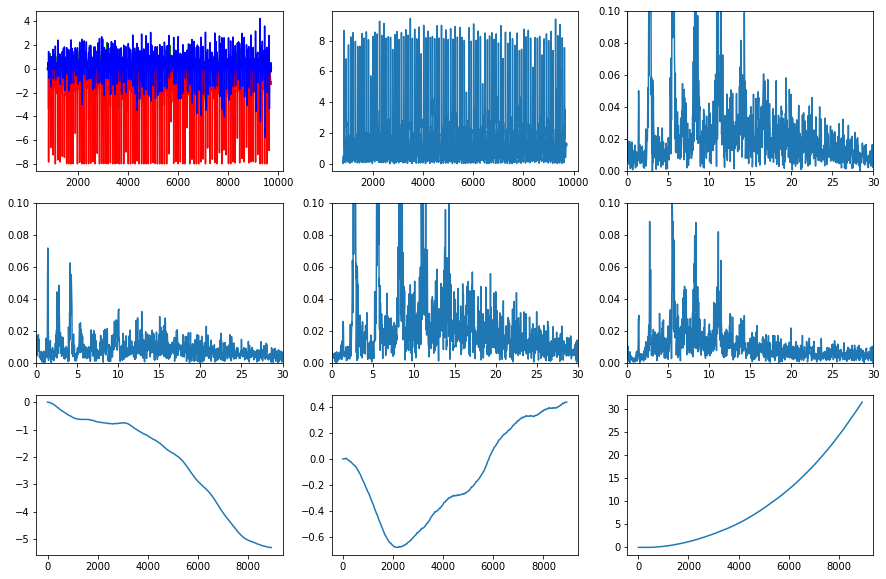

/Users/ksushazinoveva/Downloads/kaggle_data/track_7.csv
2.7435610302351625
0.45737191112829073


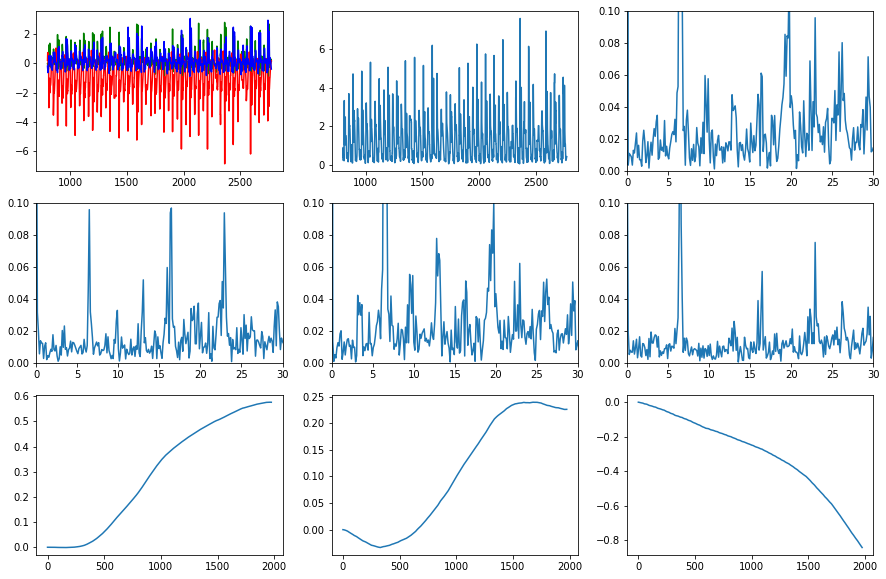

/Users/ksushazinoveva/Downloads/kaggle_data/track_40.csv
6.455696202531645
0.43363348413140956


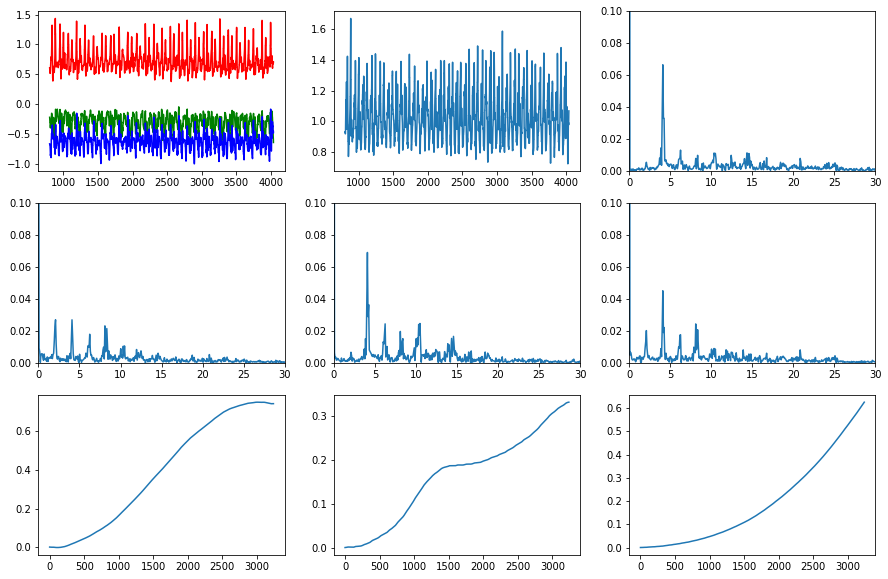

/Users/ksushazinoveva/Downloads/kaggle_data/track_54.csv
4.088244369021907
0.0664882546099173


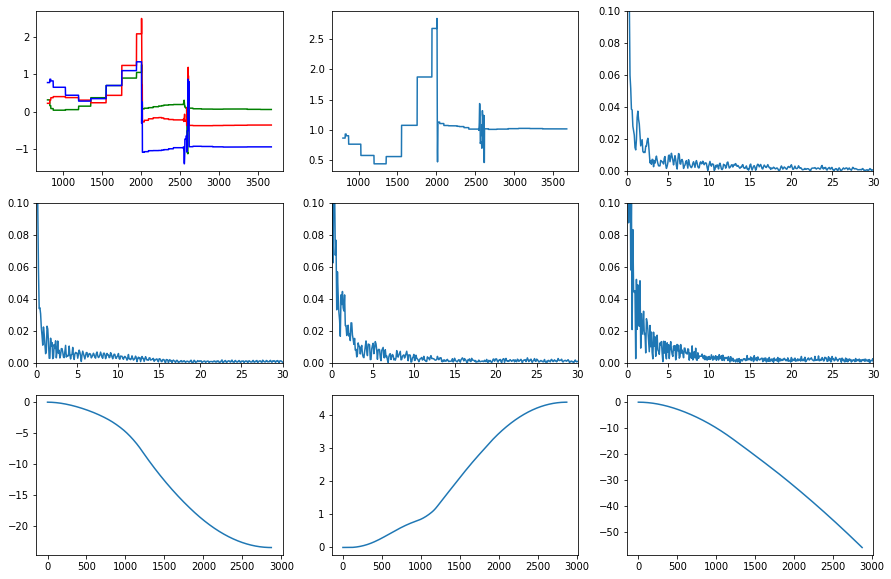

/Users/ksushazinoveva/Downloads/kaggle_data/track_68.csv
0.17403411068569438
0.16934953617275947


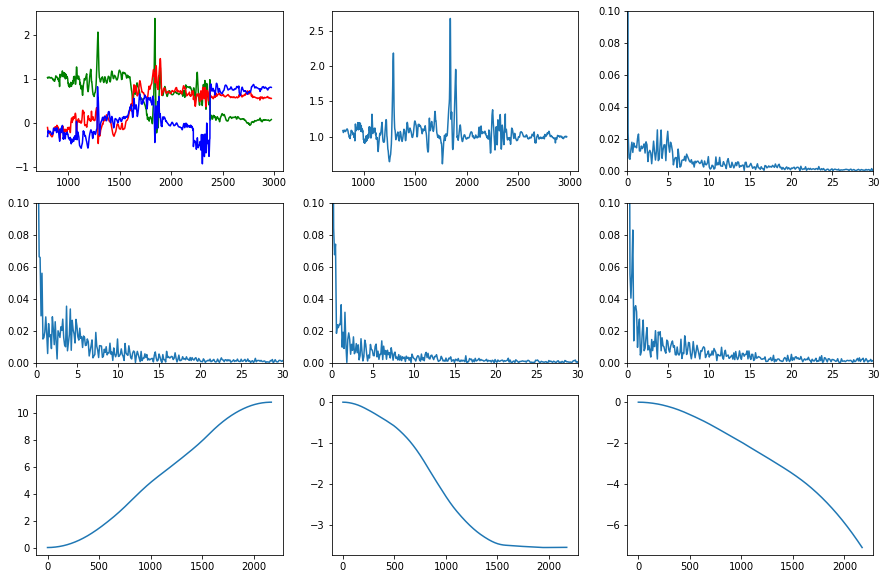

/Users/ksushazinoveva/Downloads/kaggle_data/track_83.csv
3.681546249424758
0.025777280721603565


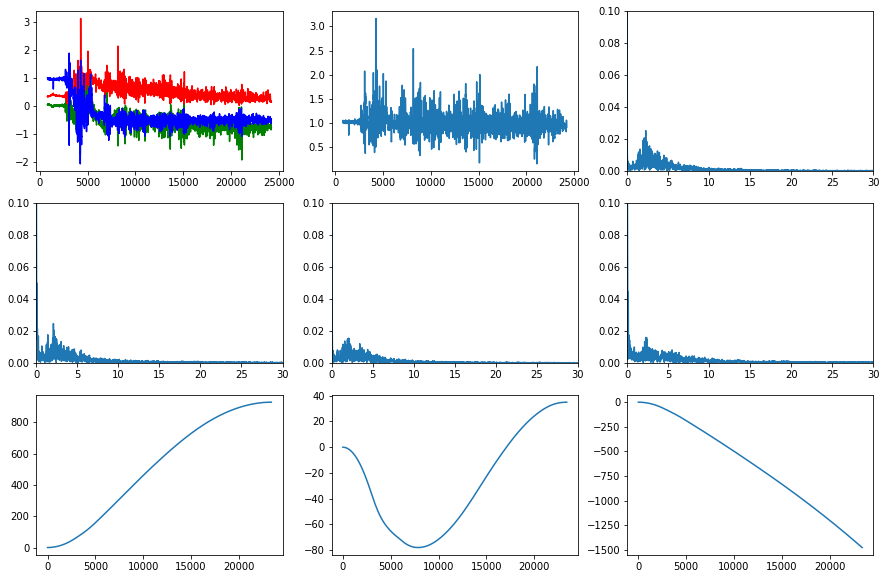

/Users/ksushazinoveva/Downloads/kaggle_data/track_97.csv
2.2636029725805074
0.02534299401119549


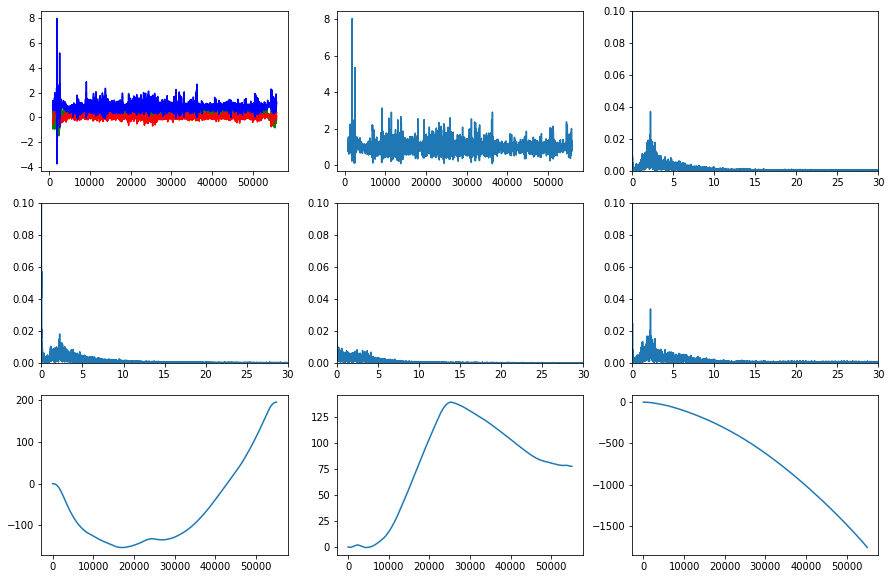

/Users/ksushazinoveva/Downloads/kaggle_data/track_96.csv
2.2193780295190892
0.037284925457155366


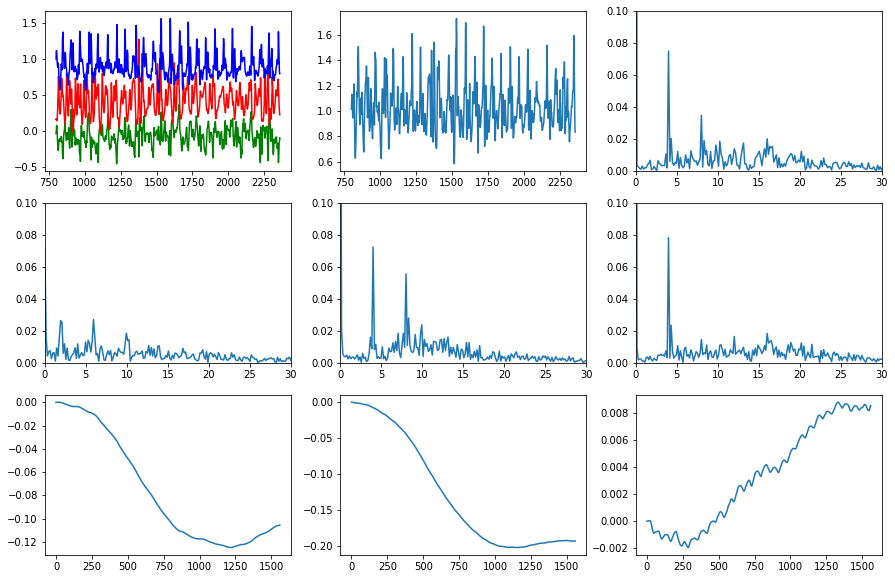

/Users/ksushazinoveva/Downloads/kaggle_data/track_82.csv
4.006410256410256
0.07499761771233512


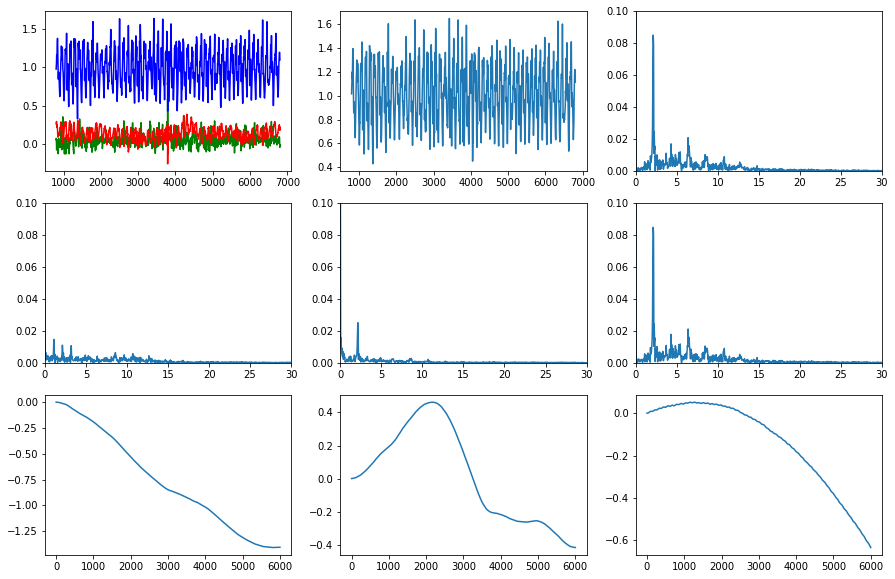

/Users/ksushazinoveva/Downloads/kaggle_data/track_69.csv
2.1242919026991003
0.08498818820946753


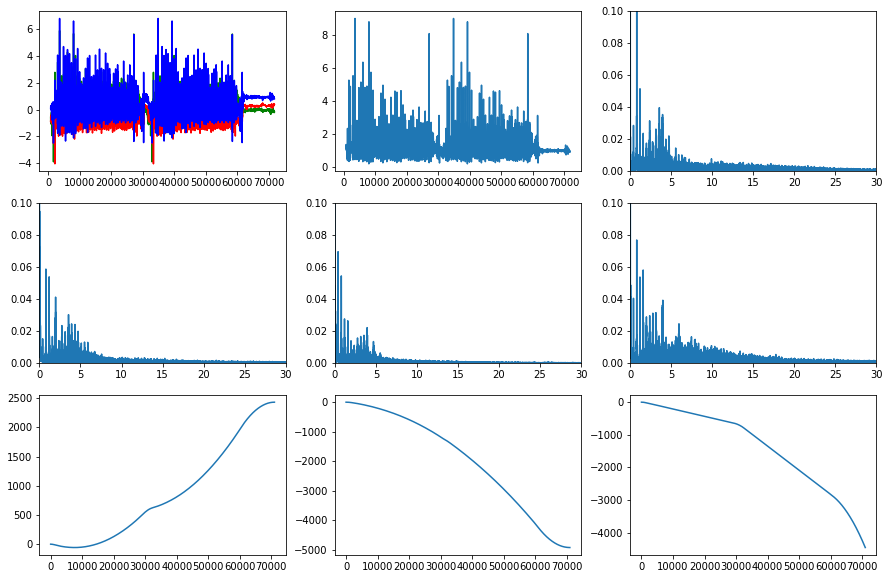

/Users/ksushazinoveva/Downloads/kaggle_data/track_55.csv
0.7852886904342682
0.10933448029174135


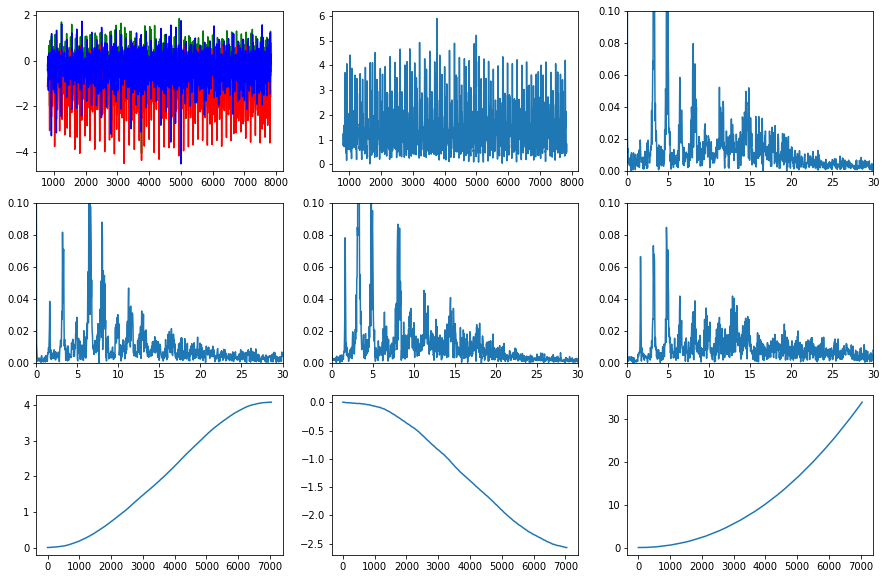

/Users/ksushazinoveva/Downloads/kaggle_data/track_41.csv
3.1928480204342273
0.18218699946059405


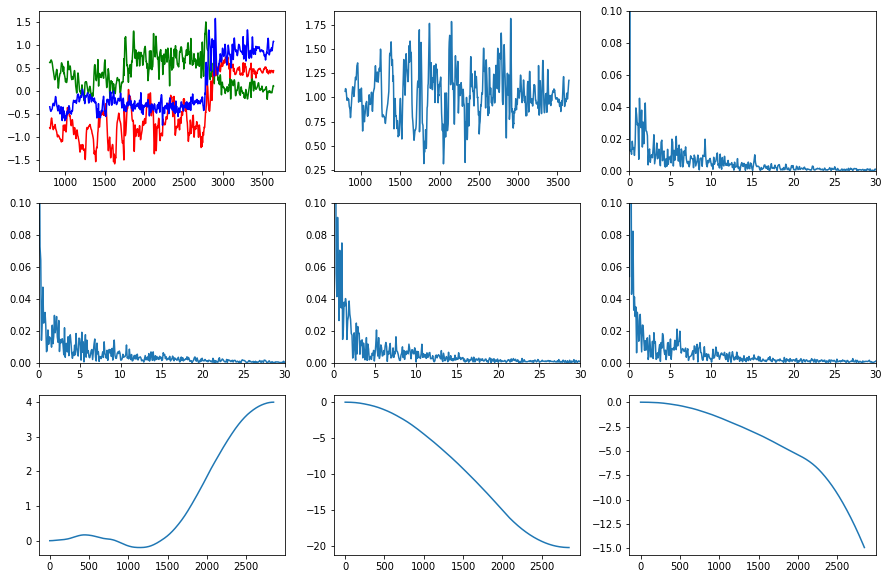

/Users/ksushazinoveva/Downloads/kaggle_data/track_6.csv
1.2293642430628733
0.045549919141056425


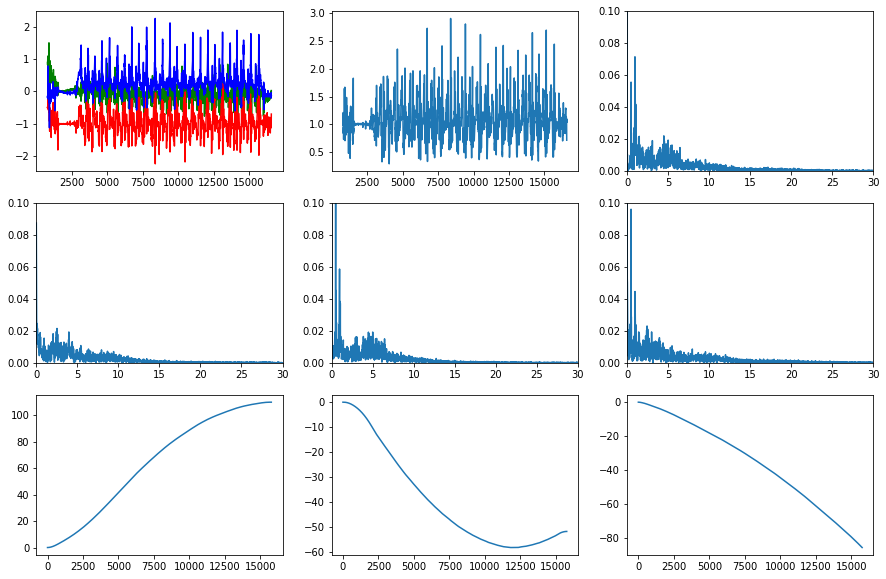

/Users/ksushazinoveva/Downloads/kaggle_data/track_4.csv
0.9512334326843808
0.07147901240158659


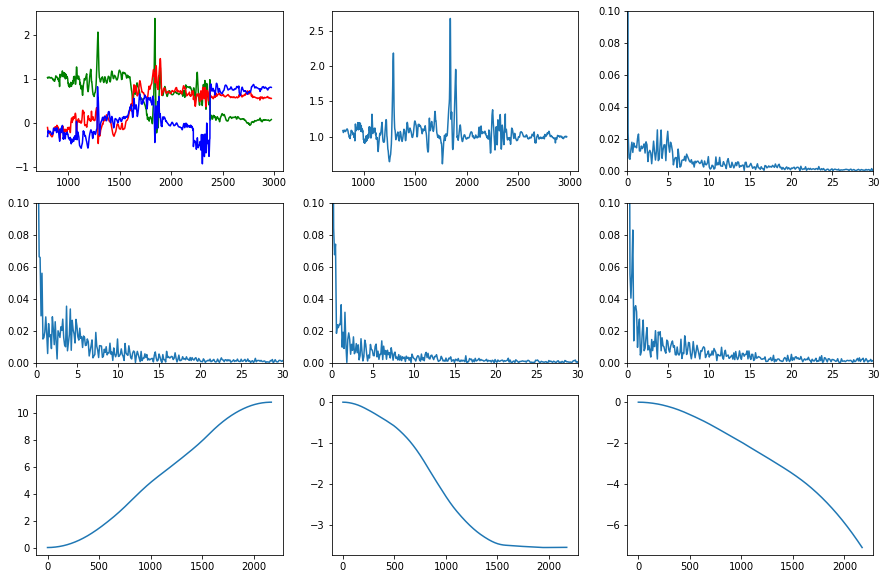

/Users/ksushazinoveva/Downloads/kaggle_data/track_57.csv
3.681546249424758
0.025777280721603565


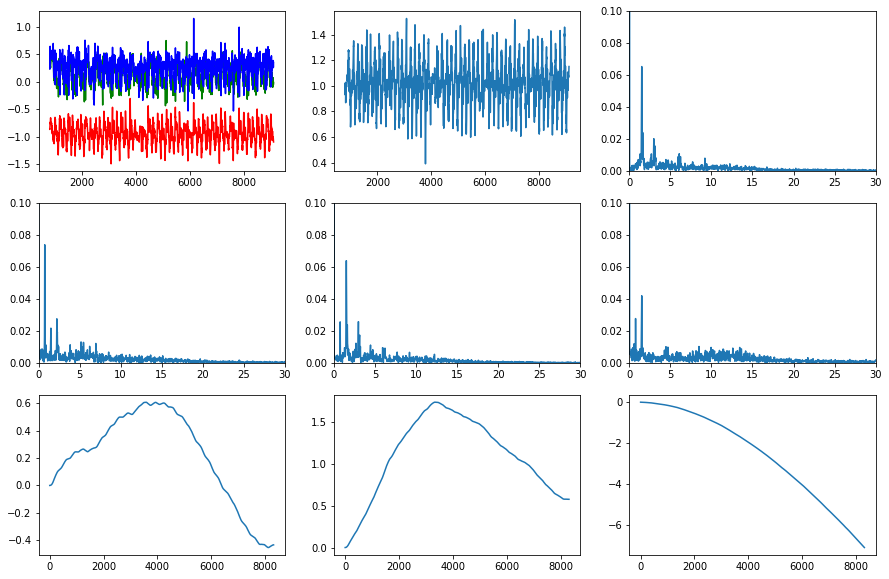

/Users/ksushazinoveva/Downloads/kaggle_data/track_43.csv
1.503849855630414
0.06537447567216928


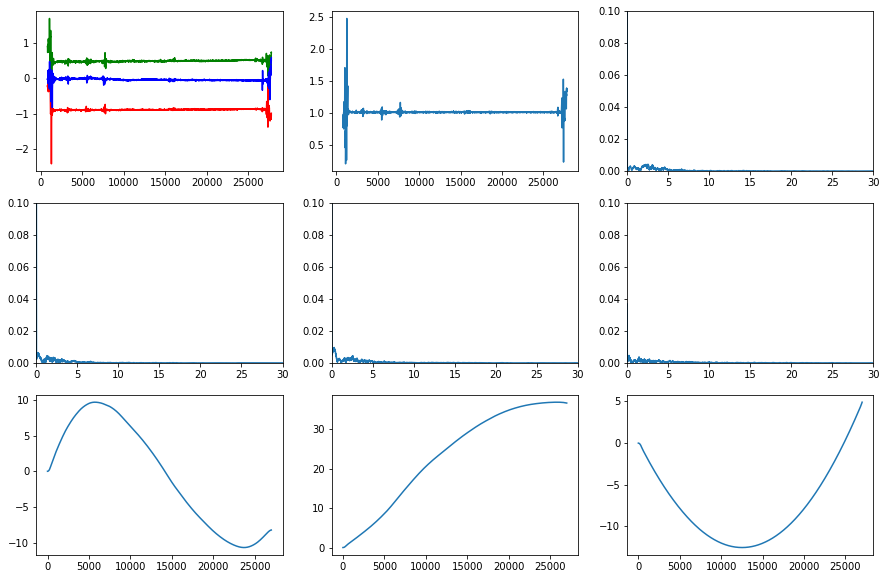

/Users/ksushazinoveva/Downloads/kaggle_data/track_94.csv
2.526841910403554
0.004269542562997417


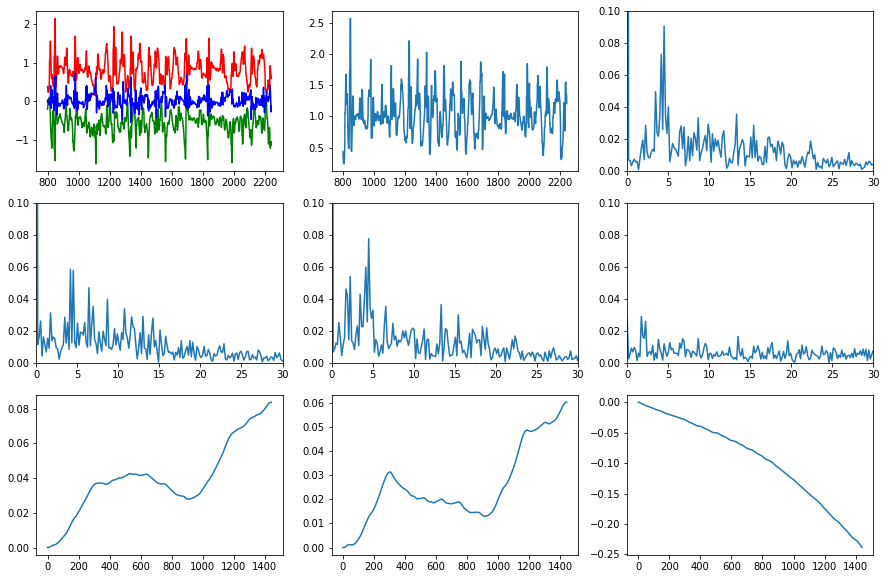

/Users/ksushazinoveva/Downloads/kaggle_data/track_80.csv
4.504504504504505
0.09054035342803059


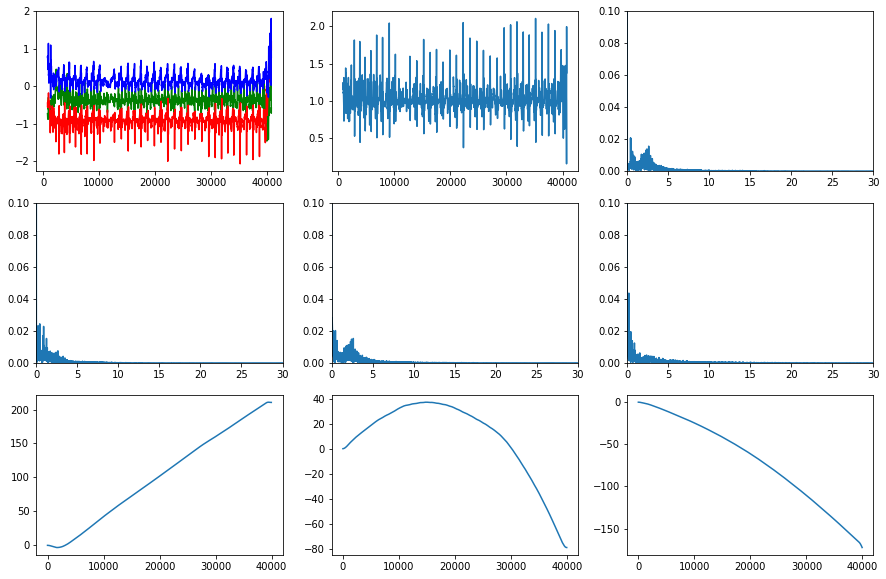

/Users/ksushazinoveva/Downloads/kaggle_data/track_81.csv
0.41299559471365643
0.020762946045353878


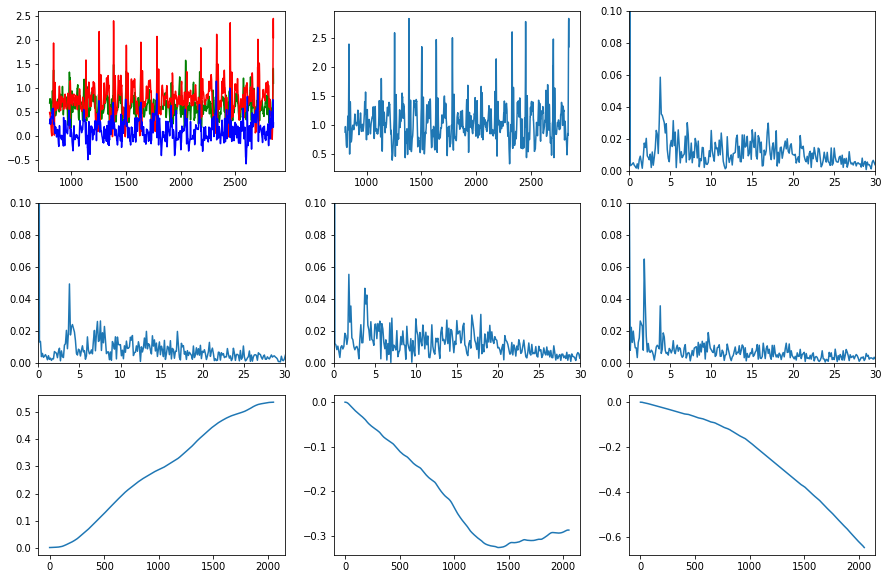

/Users/ksushazinoveva/Downloads/kaggle_data/track_95.csv
3.776803118908382
0.05869907667936082


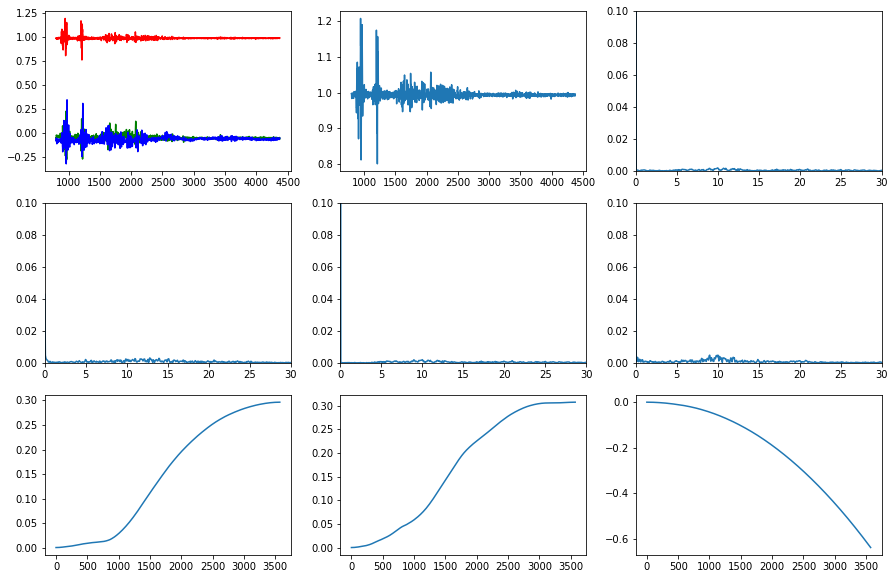

/Users/ksushazinoveva/Downloads/kaggle_data/track_42.csv
10.0
0.0019928411669707558


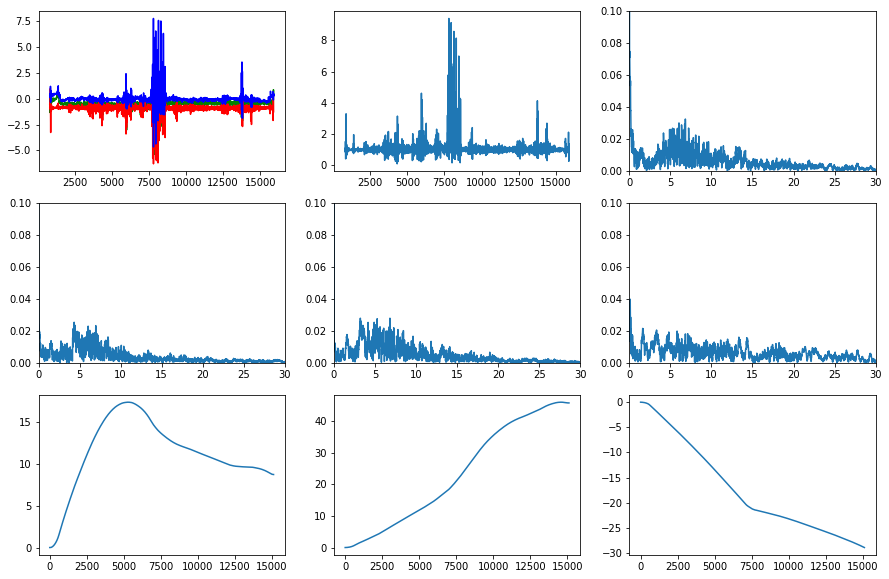

/Users/ksushazinoveva/Downloads/kaggle_data/track_56.csv
0.033103813559322036
0.07490833000936568


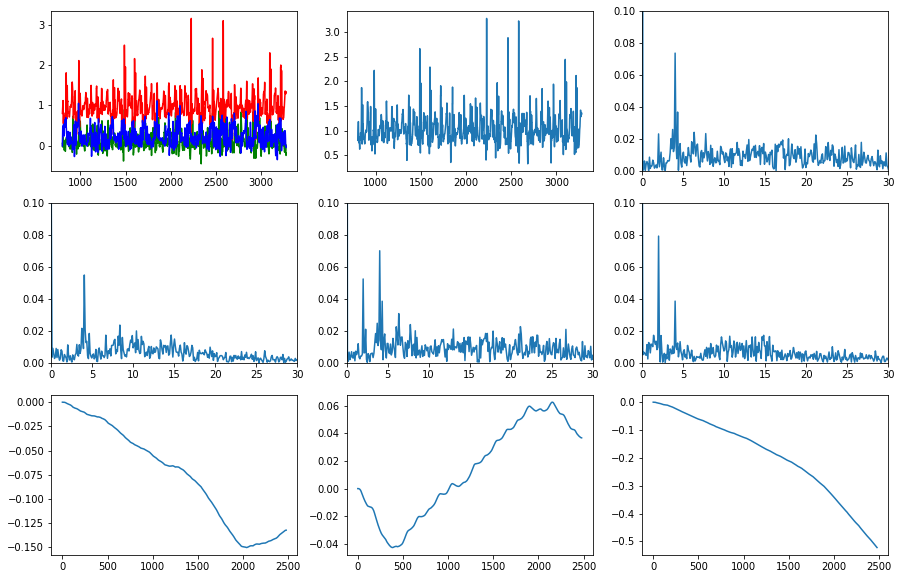

/Users/ksushazinoveva/Downloads/kaggle_data/track_5.csv
4.033884630899556
0.07378597744332198


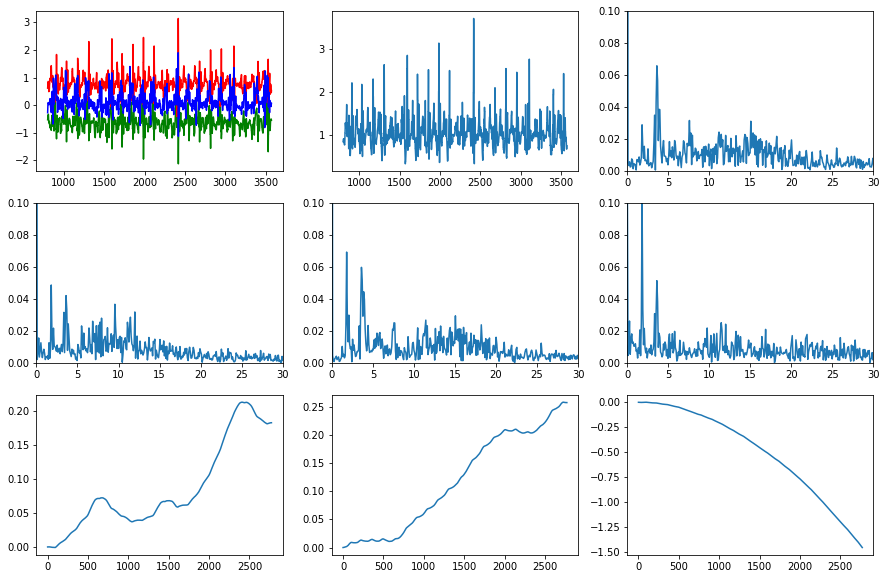

/Users/ksushazinoveva/Downloads/kaggle_data/track_19.csv
3.6062026685899746
0.06584201844198172


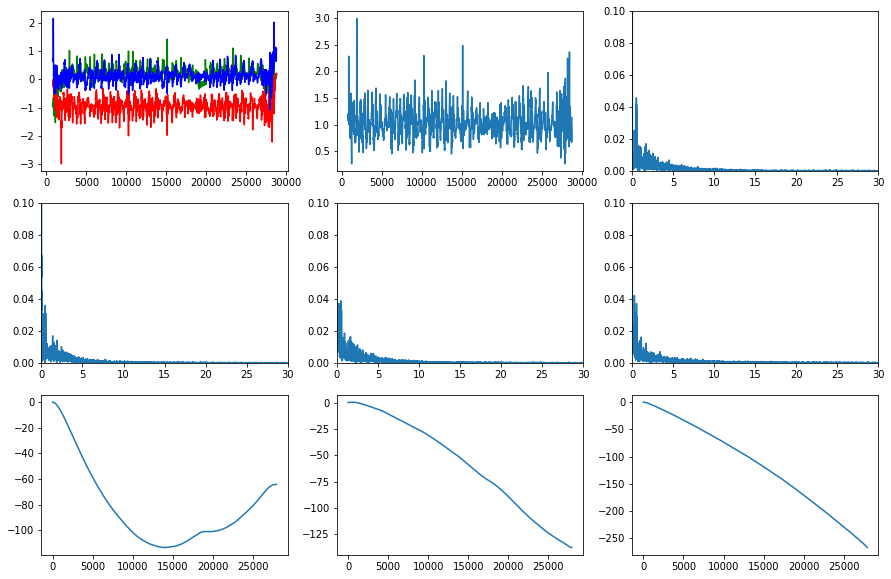

/Users/ksushazinoveva/Downloads/kaggle_data/track_31.csv
0.5007511266900351
0.045764347585299285


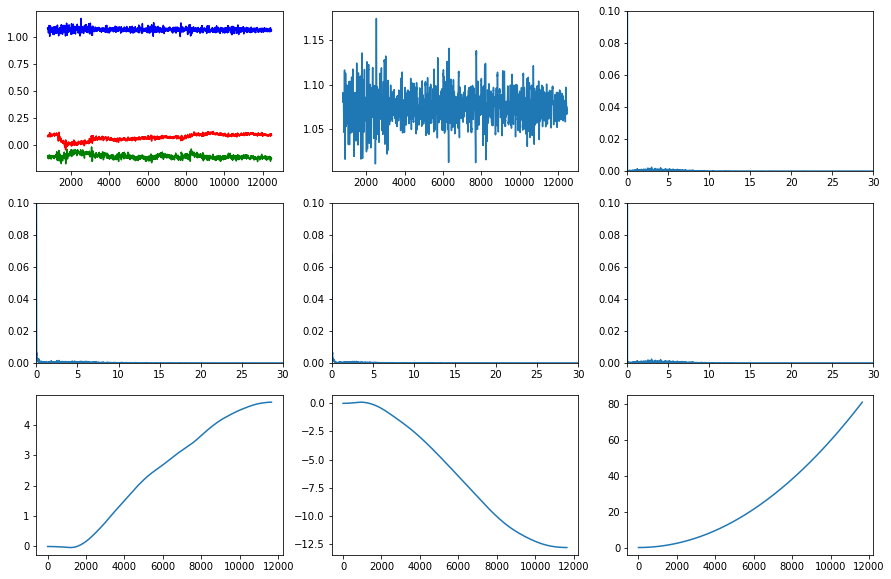

/Users/ksushazinoveva/Downloads/kaggle_data/track_25.csv
2.961119217234572
0.0024117039659830525


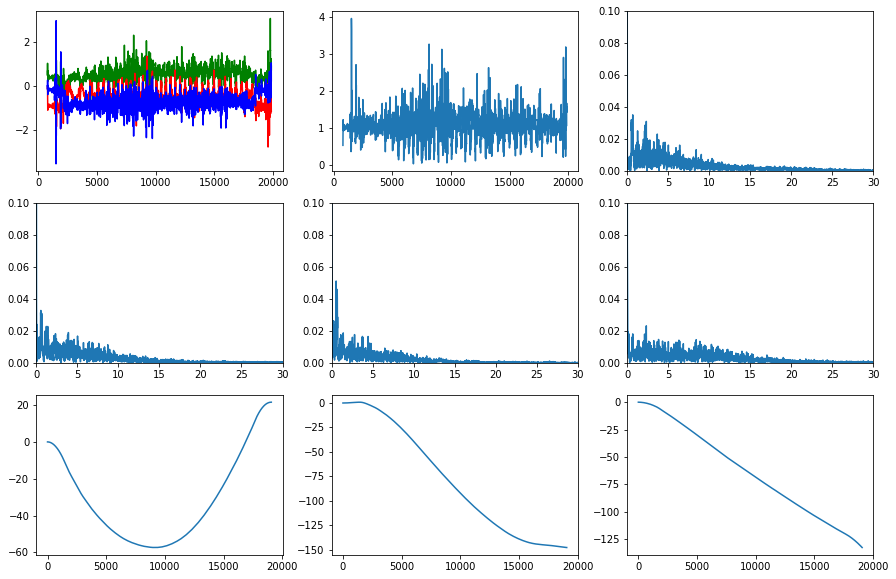

/Users/ksushazinoveva/Downloads/kaggle_data/track_128.csv
0.6819851012485573
0.03517112736312253


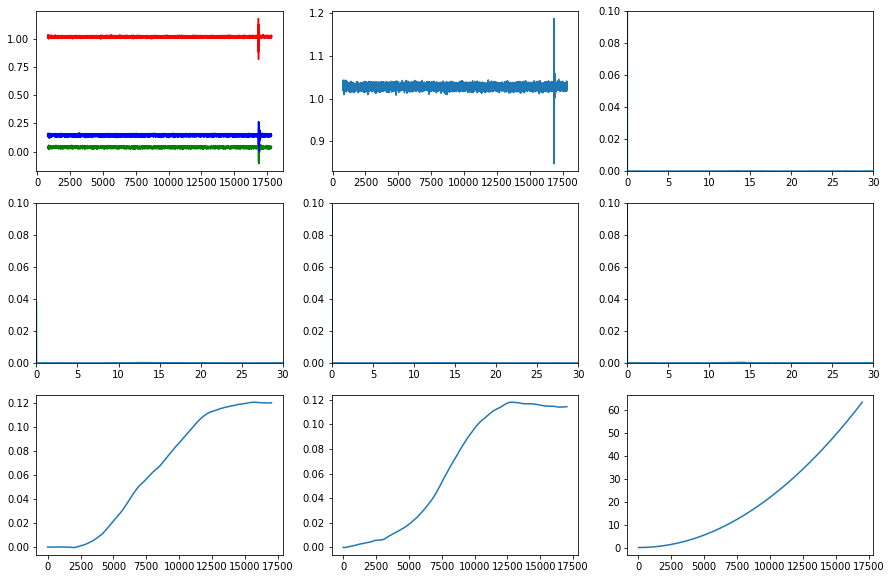

/Users/ksushazinoveva/Downloads/kaggle_data/track_100.csv
13.453178239924805
0.00012884169094103435


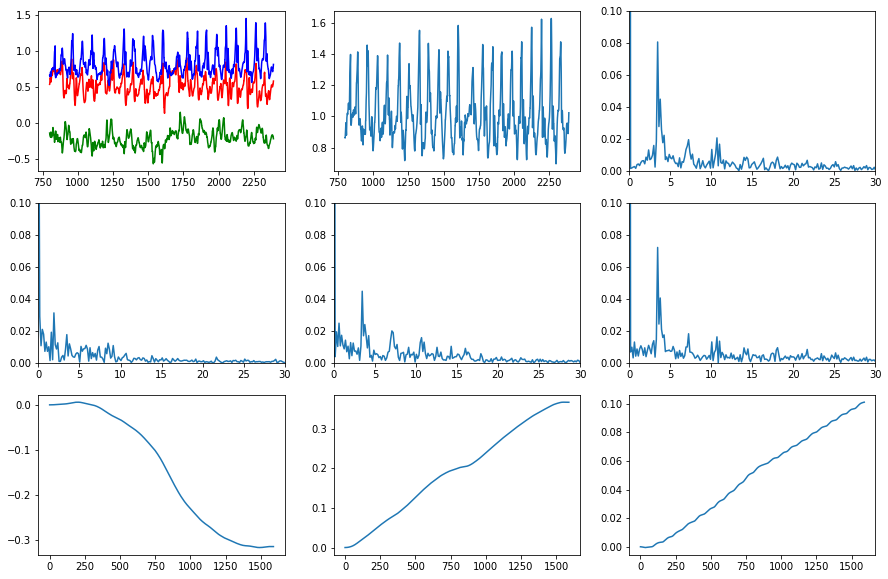

/Users/ksushazinoveva/Downloads/kaggle_data/track_114.csv
3.4569453174104336
0.08075760427680662


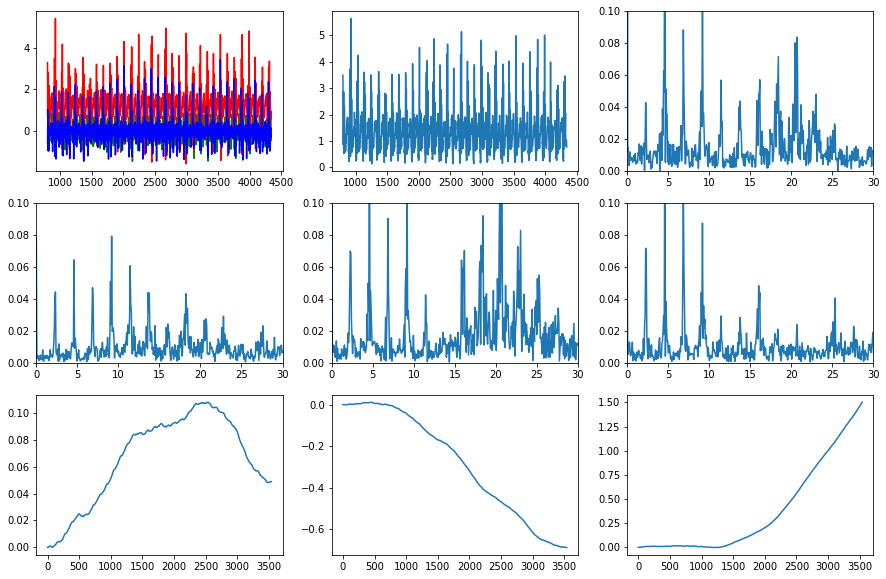

/Users/ksushazinoveva/Downloads/kaggle_data/track_115.csv
4.58909912454109
0.2604910745742406


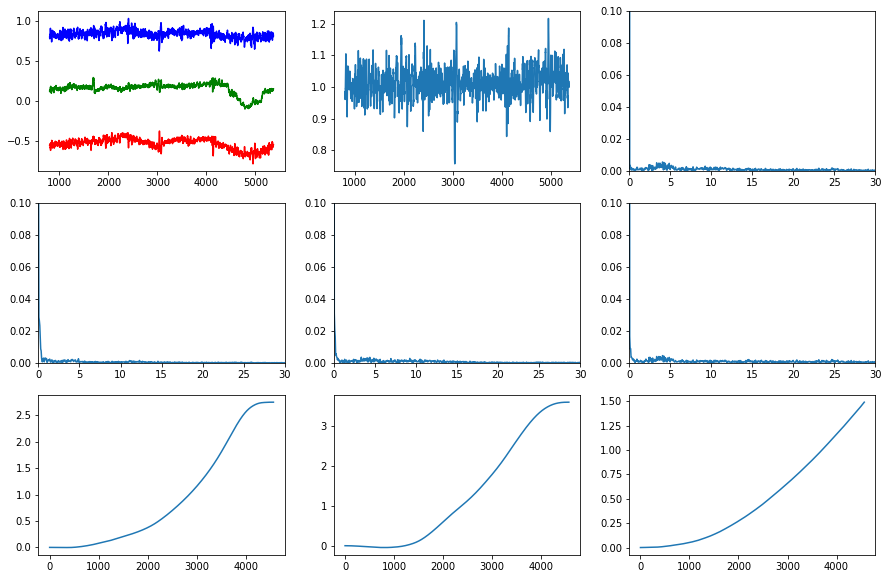

/Users/ksushazinoveva/Downloads/kaggle_data/track_101.csv
4.050799211736369
0.005697739935863903


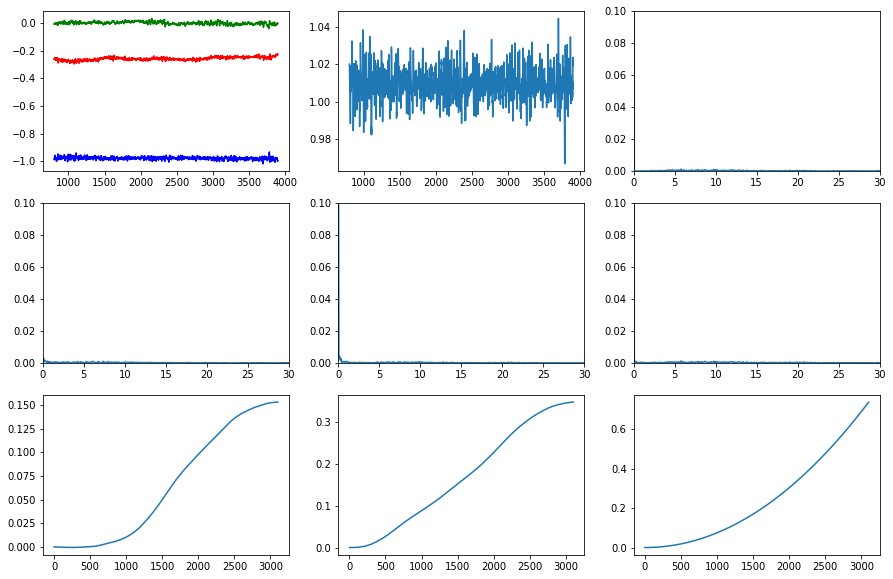

/Users/ksushazinoveva/Downloads/kaggle_data/track_129.csv
5.800837898807605
0.001267089793163904


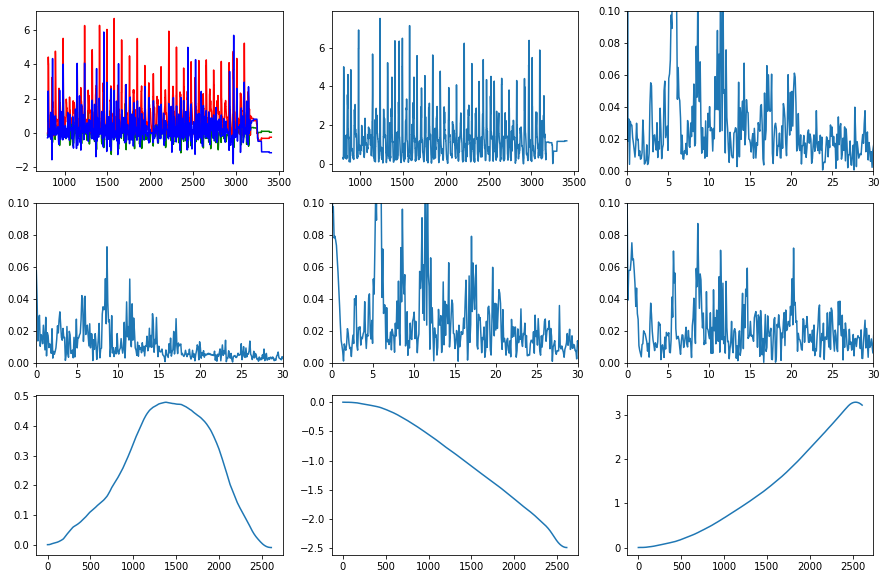

/Users/ksushazinoveva/Downloads/kaggle_data/track_24.csv
5.644852659778033
0.27660510551886236


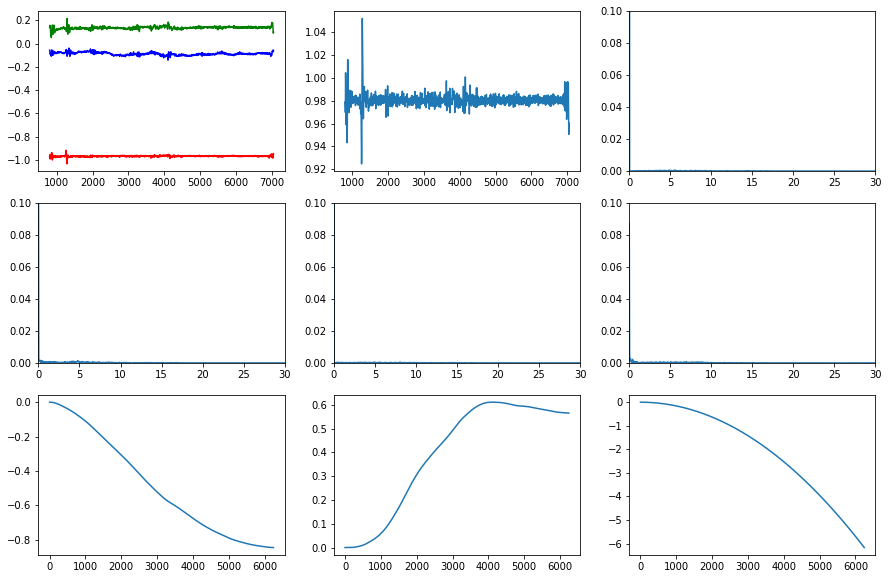

/Users/ksushazinoveva/Downloads/kaggle_data/track_30.csv
5.5617797695262485
0.0004968566042158324


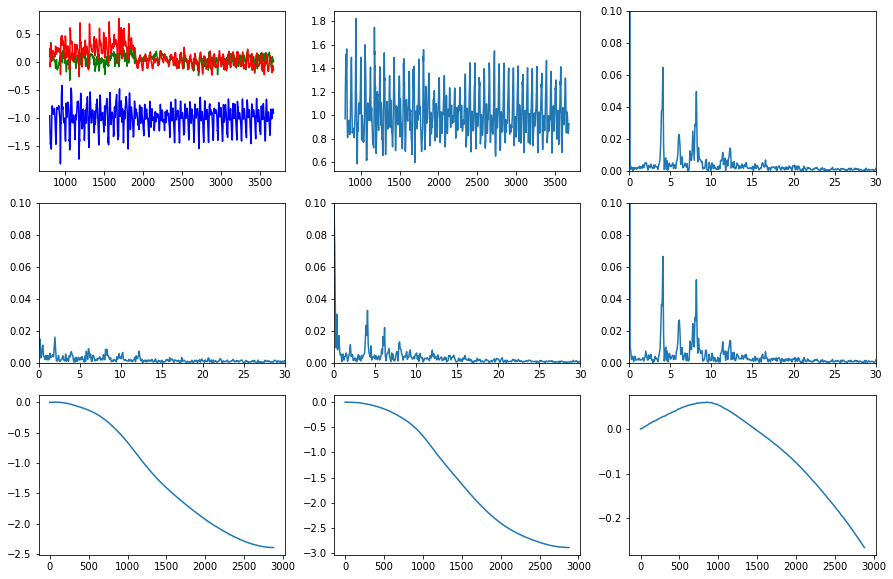

/Users/ksushazinoveva/Downloads/kaggle_data/track_18.csv
4.081278221604724
0.06483141204596671


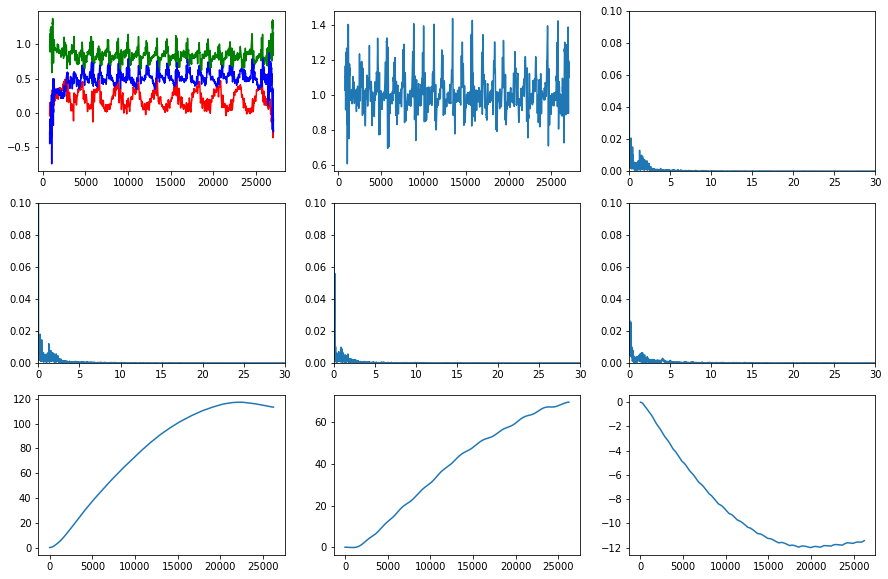

/Users/ksushazinoveva/Downloads/kaggle_data/track_26.csv
0.209499866681903
0.020660605867966243


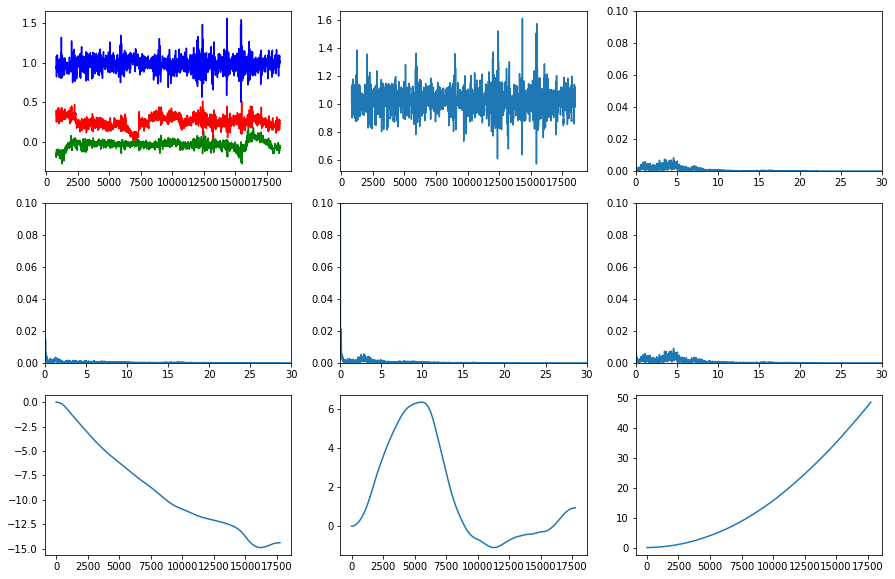

/Users/ksushazinoveva/Downloads/kaggle_data/track_32.csv
4.604596147347077
0.00829991733434578


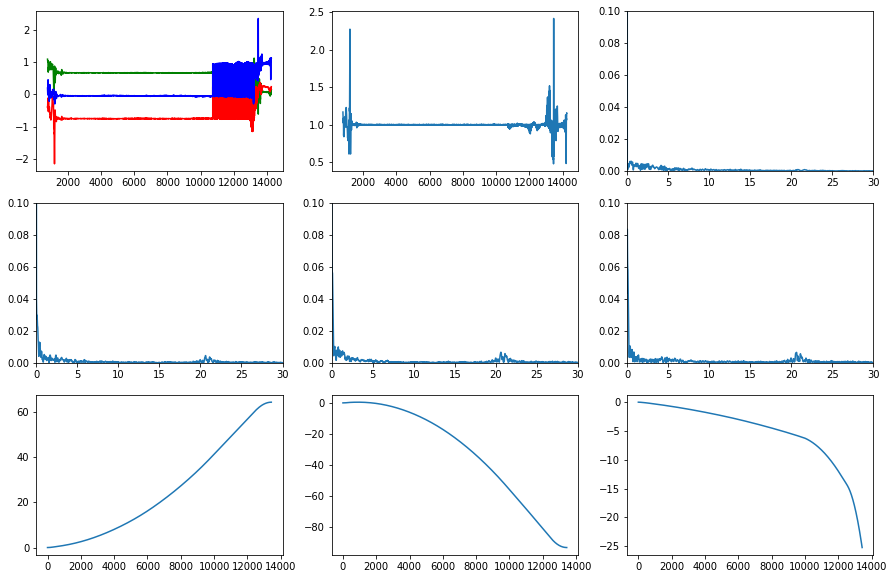

/Users/ksushazinoveva/Downloads/kaggle_data/track_117.csv
0.48373892982064454
0.006183399690139251


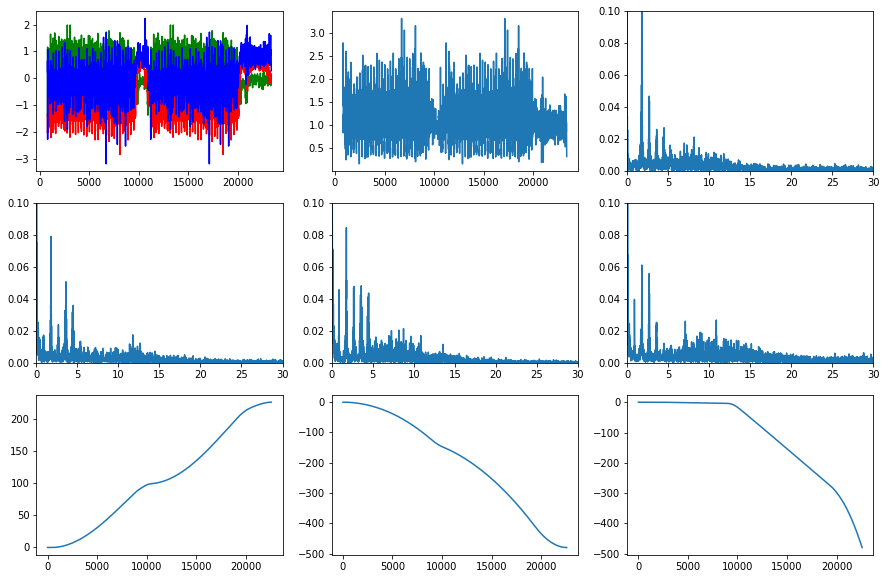

/Users/ksushazinoveva/Downloads/kaggle_data/track_103.csv
1.7827877928865659
0.12150418707315722


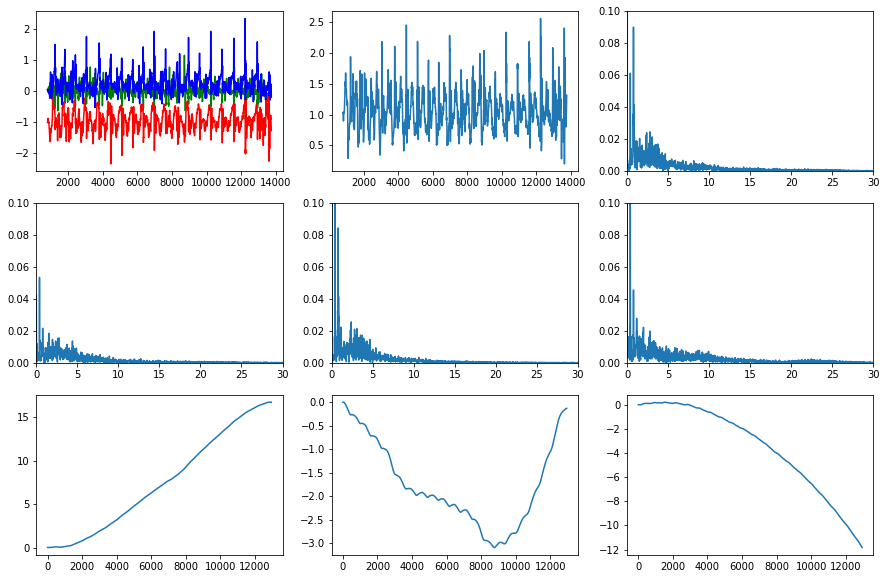

/Users/ksushazinoveva/Downloads/kaggle_data/track_102.csv
0.7722007722007722
0.09005338022249132


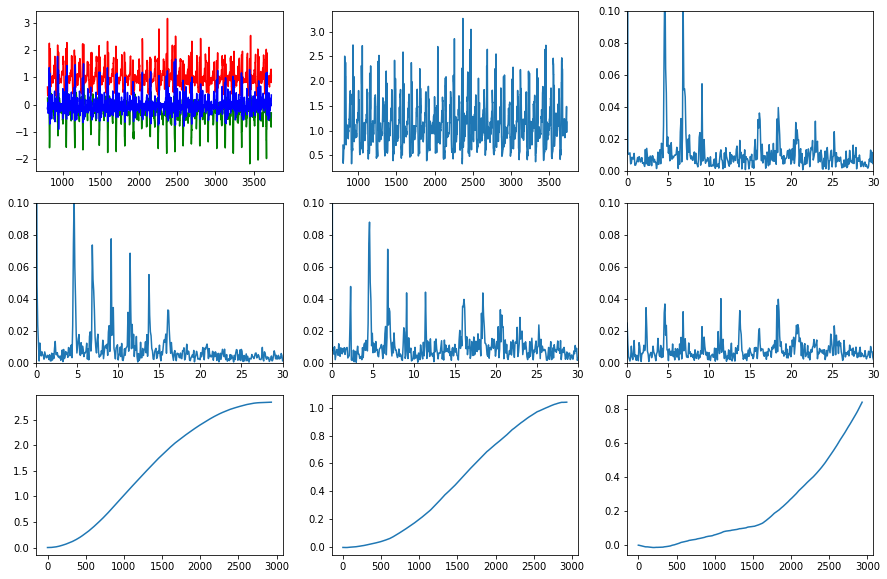

/Users/ksushazinoveva/Downloads/kaggle_data/track_116.csv
4.604365620736699
0.1255485824269046


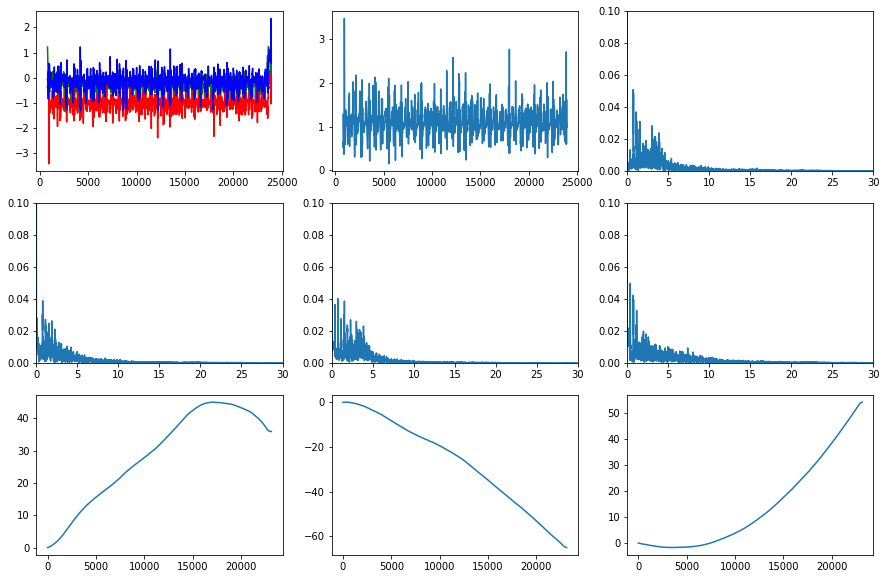

/Users/ksushazinoveva/Downloads/kaggle_data/track_33.csv
0.745559061243895
0.050971177294707876


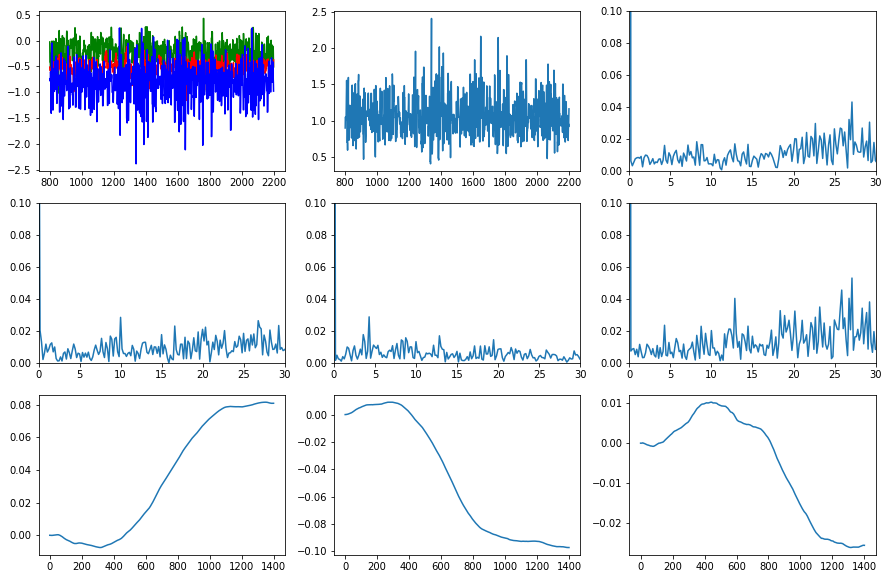

/Users/ksushazinoveva/Downloads/kaggle_data/track_27.csv
27.123483226266952
0.04319439489571268


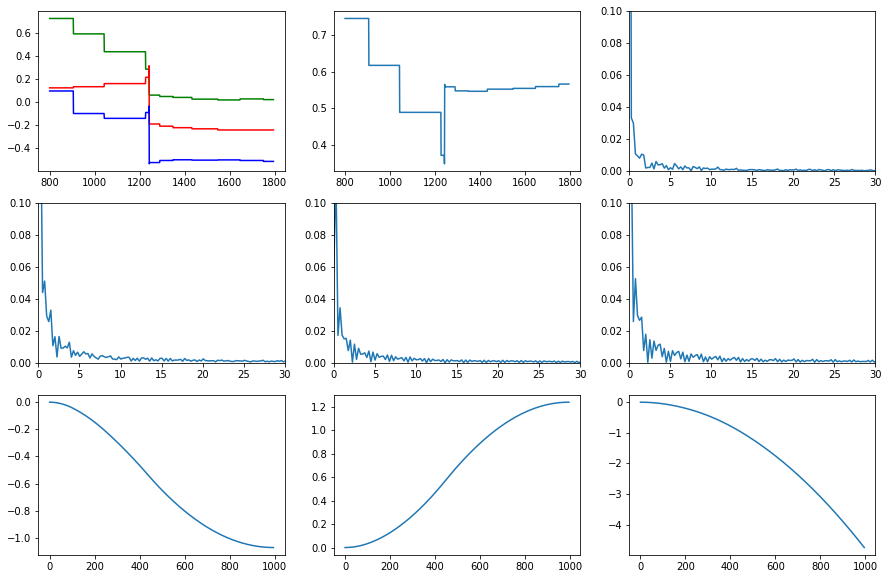

/Users/ksushazinoveva/Downloads/kaggle_data/track_23.csv
0.25100401606425704
0.03328693038722799


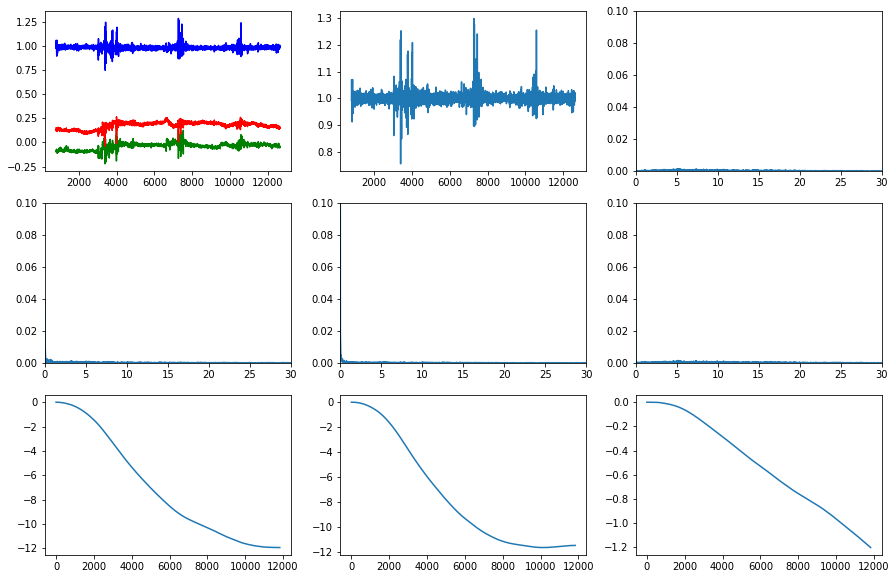

/Users/ksushazinoveva/Downloads/kaggle_data/track_37.csv
5.134815315696053
0.0014939040780911539


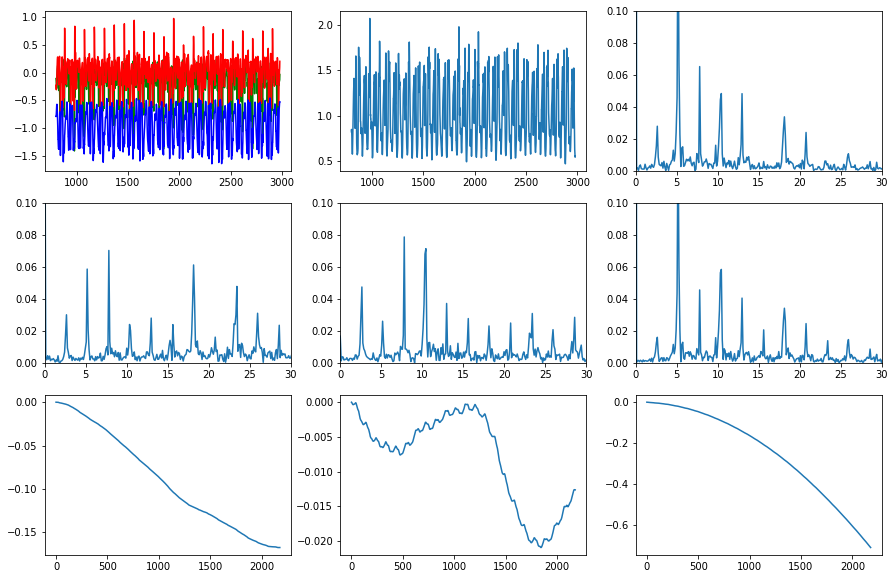

/Users/ksushazinoveva/Downloads/kaggle_data/track_112.csv
5.162918770078018
0.1696422405699964


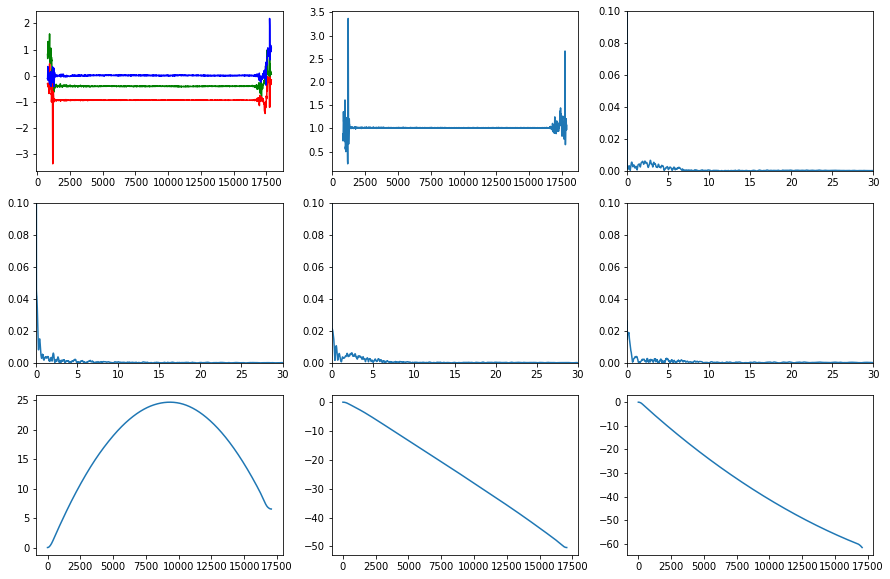

/Users/ksushazinoveva/Downloads/kaggle_data/track_106.csv
2.8260996895683244
0.006737251977884432


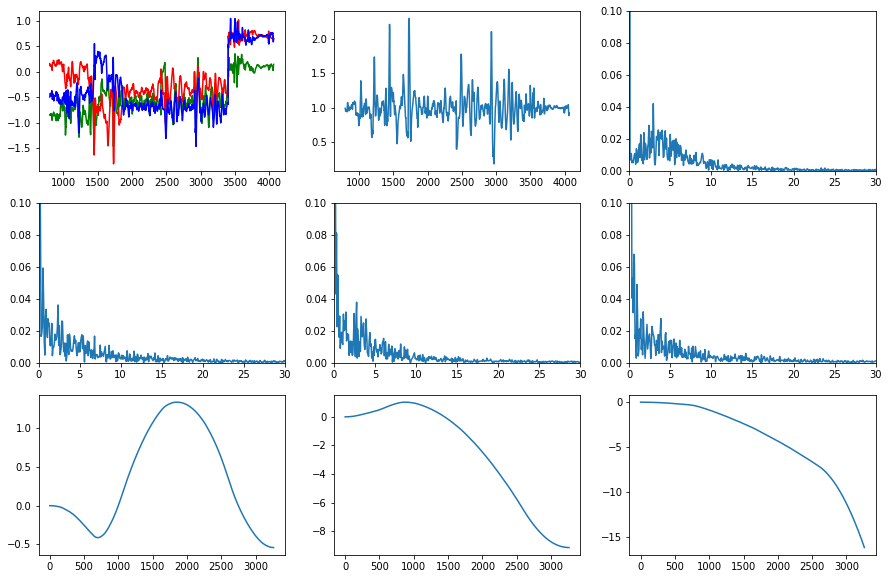

/Users/ksushazinoveva/Downloads/kaggle_data/track_107.csv
2.9123237277743717
0.04219726022809745


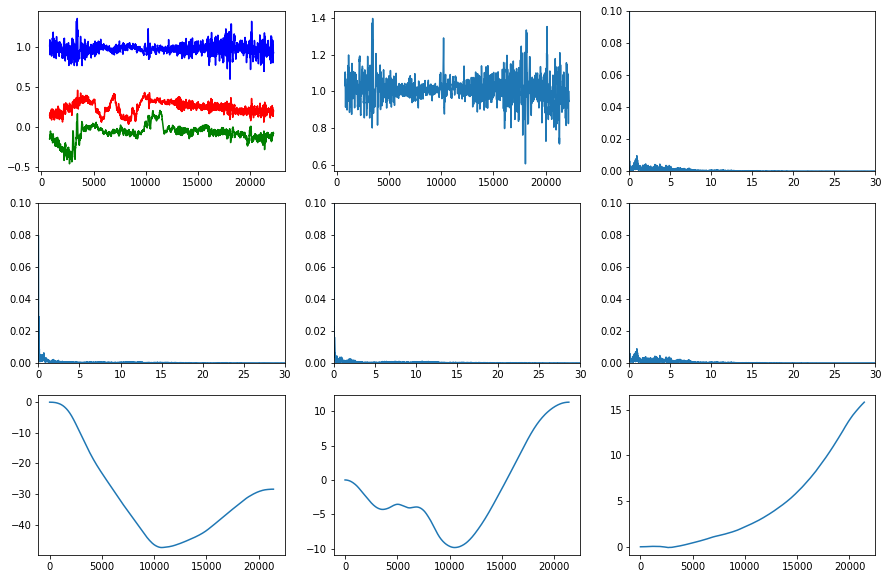

/Users/ksushazinoveva/Downloads/kaggle_data/track_113.csv
0.9222507588139155
0.00961379291263343


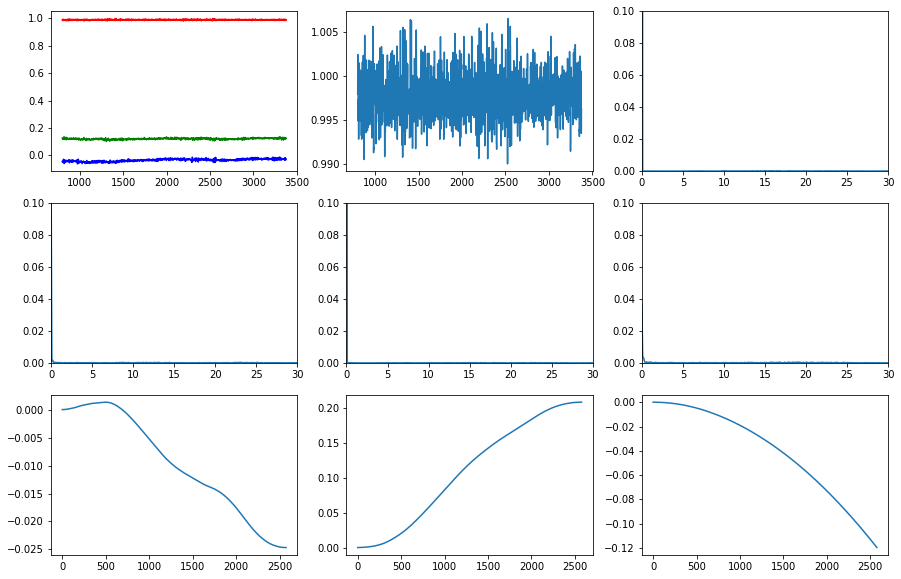

/Users/ksushazinoveva/Downloads/kaggle_data/track_36.csv
16.40139751552795
0.00023958143627943402


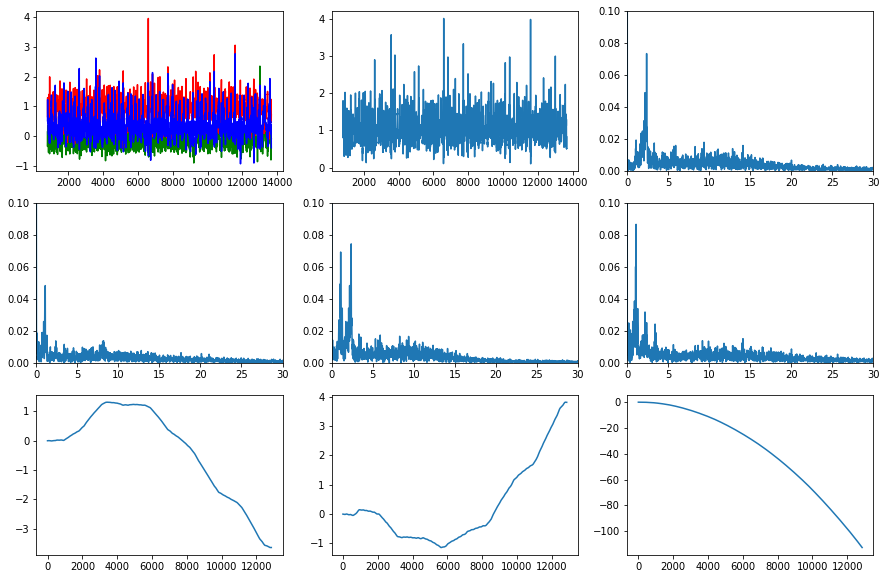

/Users/ksushazinoveva/Downloads/kaggle_data/track_22.csv
2.3718796173885996
0.07348382628981477


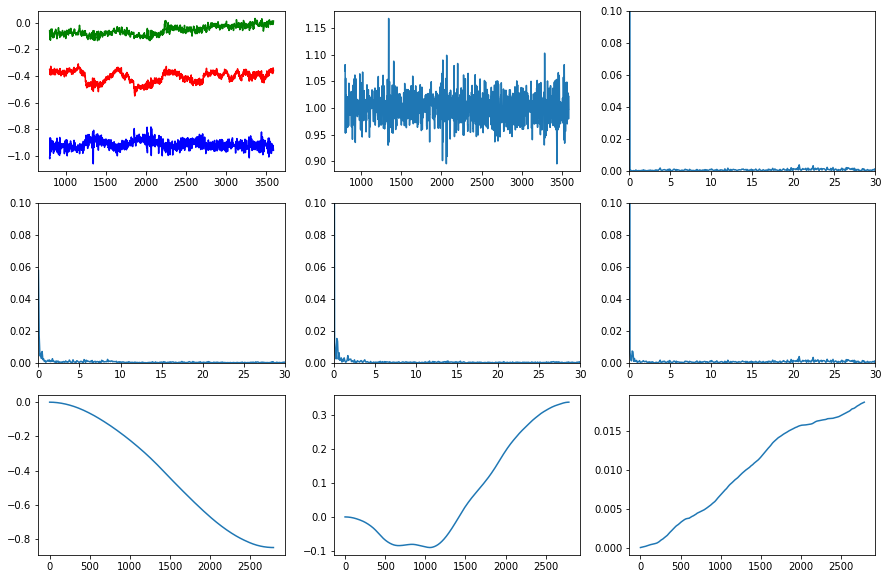

/Users/ksushazinoveva/Downloads/kaggle_data/track_34.csv
20.70634636070276
0.003913676062219483


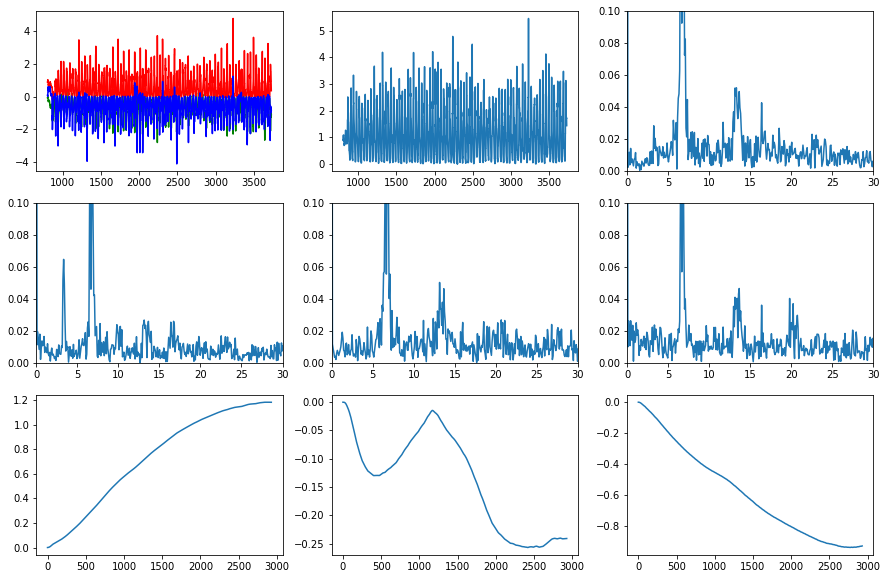

/Users/ksushazinoveva/Downloads/kaggle_data/track_20.csv
6.572208945032434
0.39139179777363914


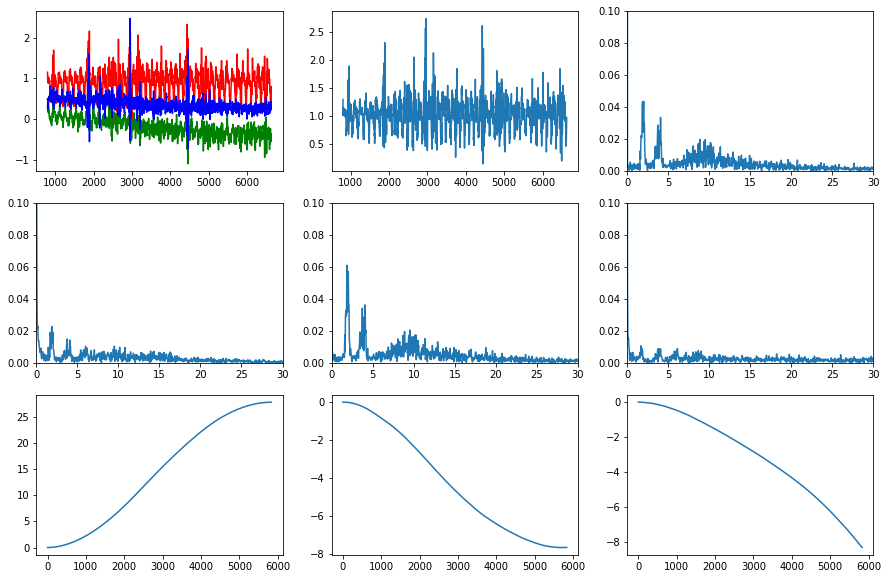

/Users/ksushazinoveva/Downloads/kaggle_data/track_105.csv
2.0147462277091908
0.04360117845965519


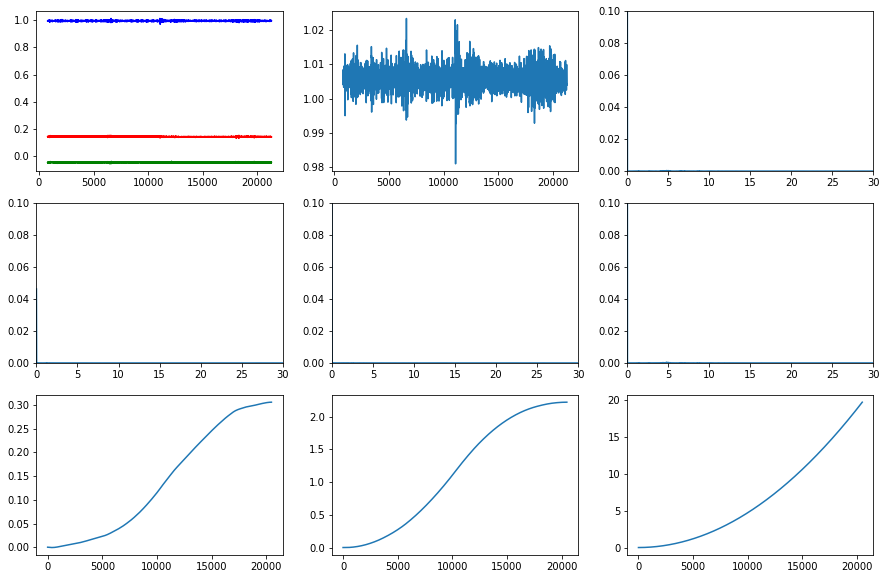

/Users/ksushazinoveva/Downloads/kaggle_data/track_111.csv
4.795724117733197
0.0003374498471737456


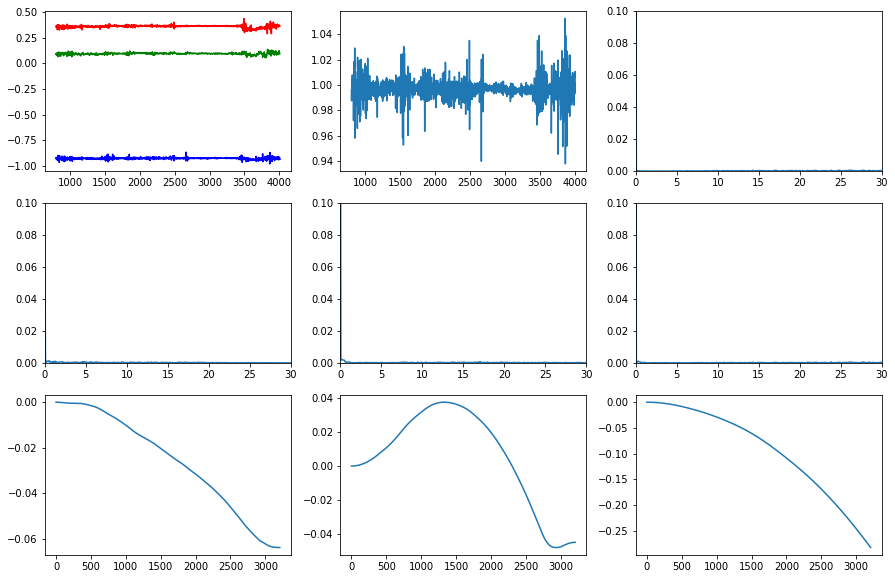

/Users/ksushazinoveva/Downloads/kaggle_data/track_139.csv
26.262468827930174
0.0006101064502472761


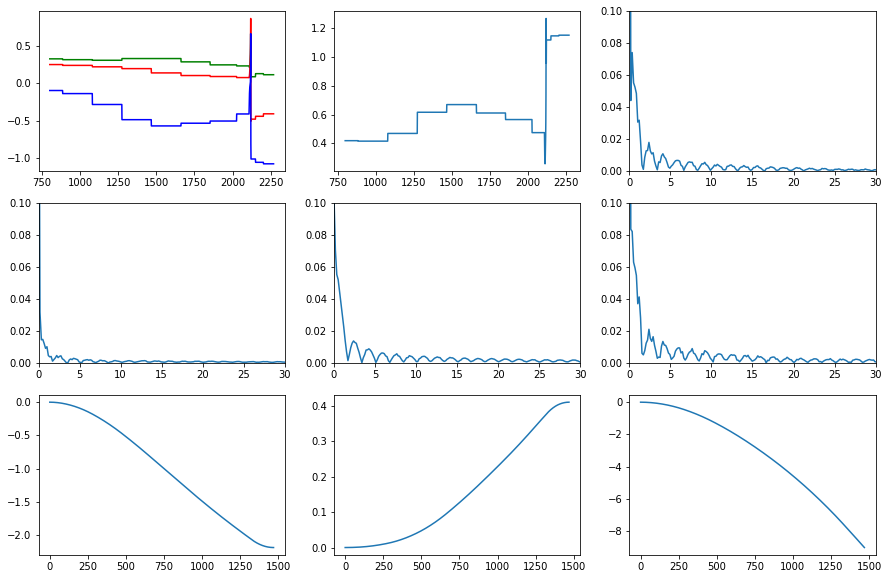

/Users/ksushazinoveva/Downloads/kaggle_data/track_138.csv
0.3401360544217687
0.07414108574601272


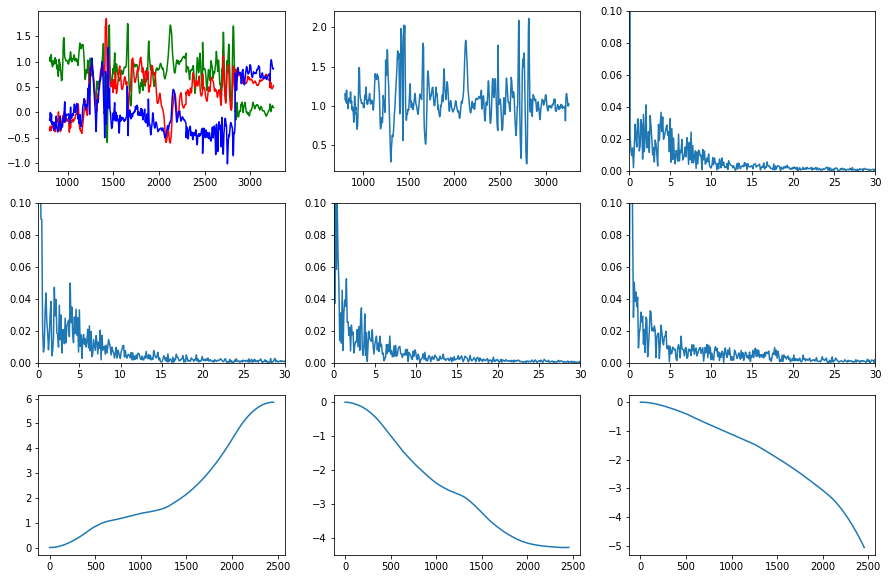

/Users/ksushazinoveva/Downloads/kaggle_data/track_110.csv
2.035830618892508
0.04139649414331784


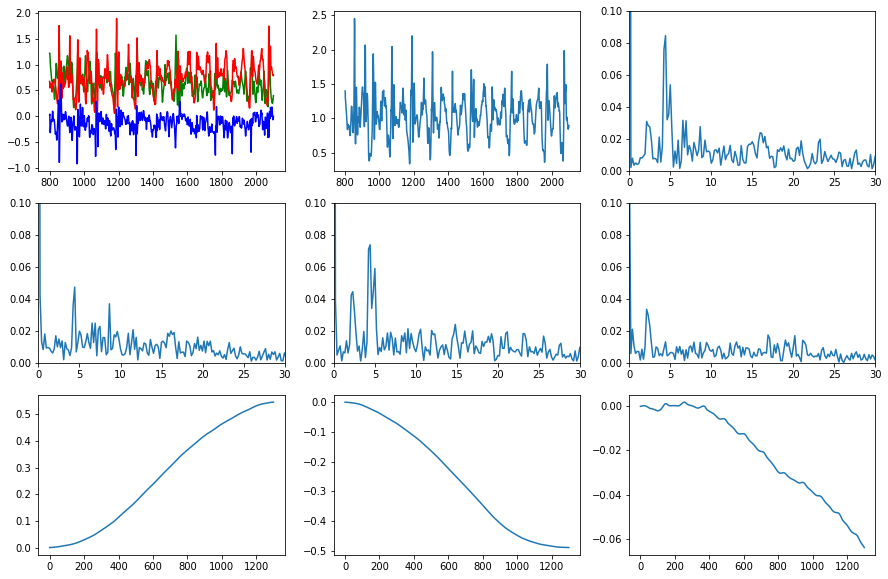

/Users/ksushazinoveva/Downloads/kaggle_data/track_104.csv
4.419677171406611
0.08474524350077653


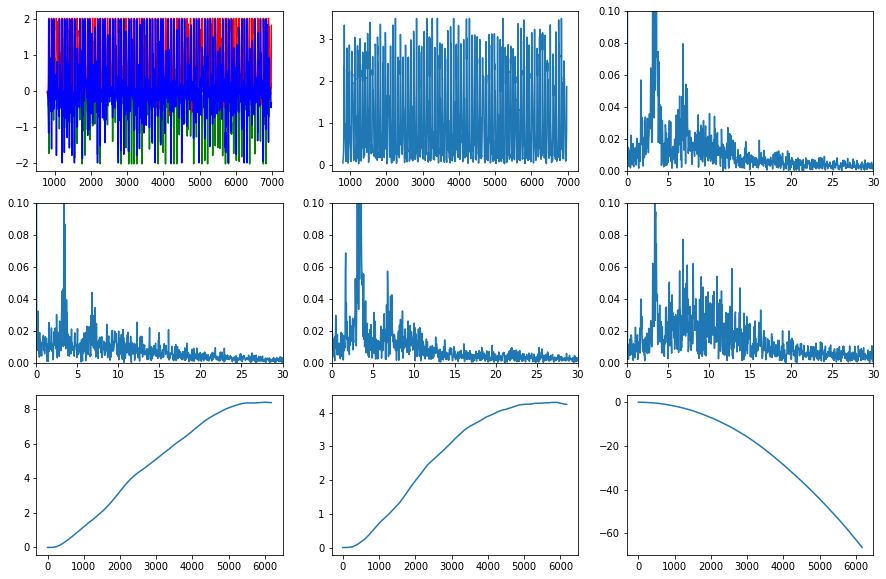

/Users/ksushazinoveva/Downloads/kaggle_data/track_21.csv
3.3592358750202367
0.24773633185228405


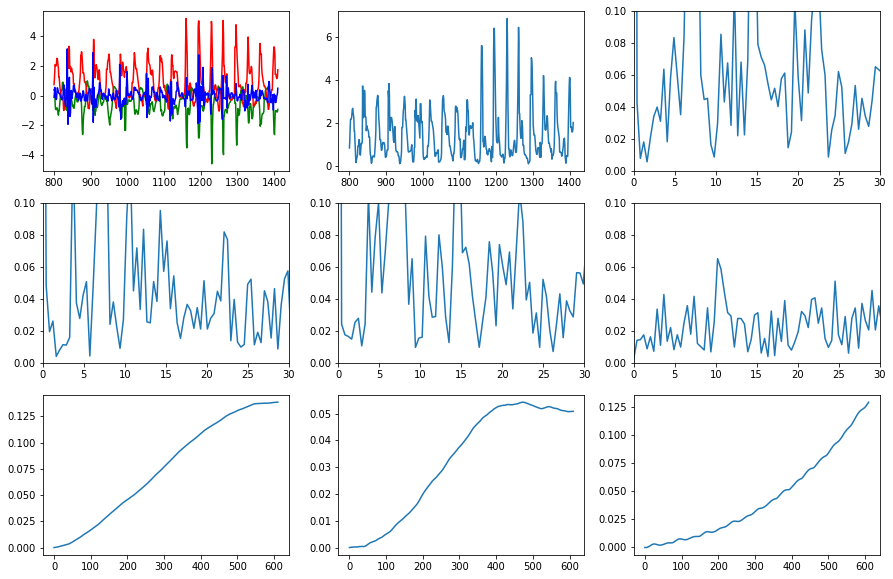

/Users/ksushazinoveva/Downloads/kaggle_data/track_35.csv
7.364975450081833
0.363894352126645


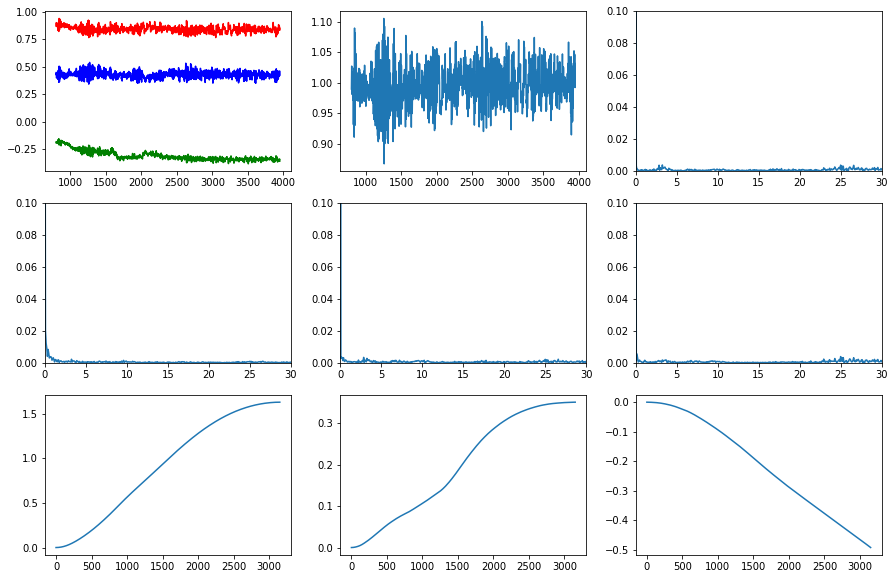

/Users/ksushazinoveva/Downloads/kaggle_data/track_38.csv
3.2519035532994924
0.0038337372361606716


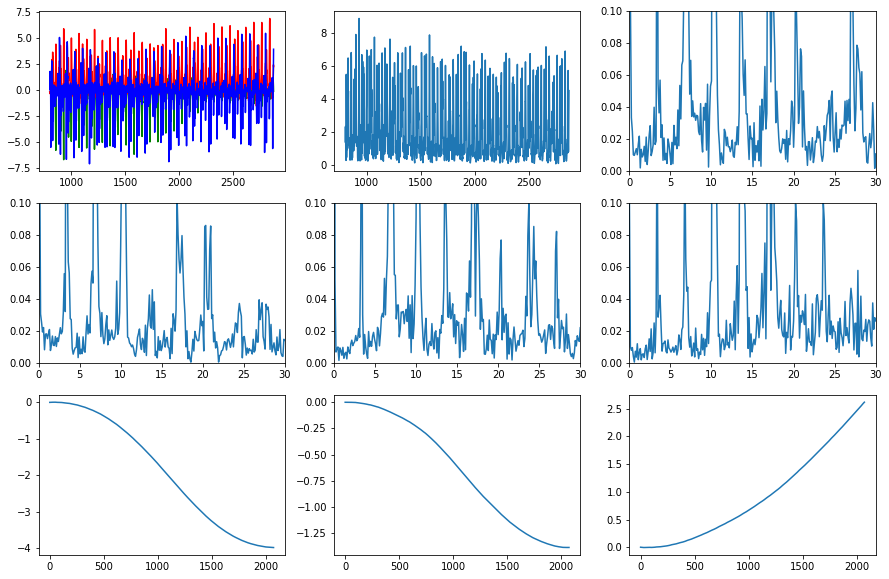

/Users/ksushazinoveva/Downloads/kaggle_data/track_10.csv
6.750241080038573
0.4530374478269788


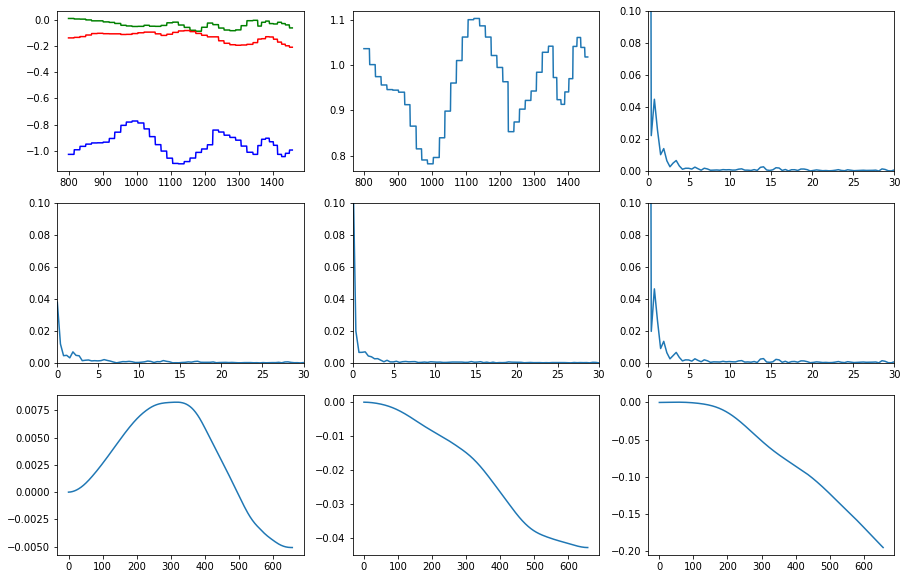

/Users/ksushazinoveva/Downloads/kaggle_data/track_109.csv
0.7598784194528875
0.04493019534660674


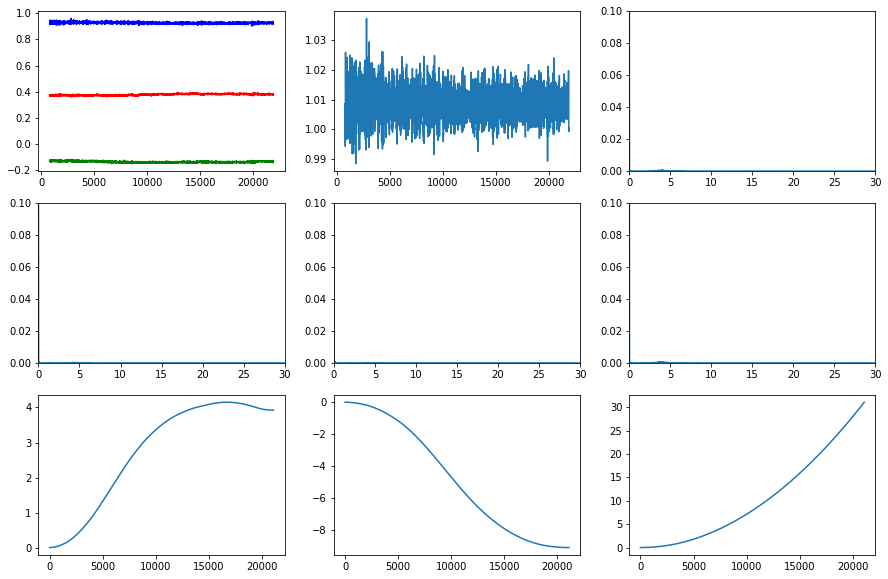

/Users/ksushazinoveva/Downloads/kaggle_data/track_121.csv
3.9821750260737647
0.0005798974671408978


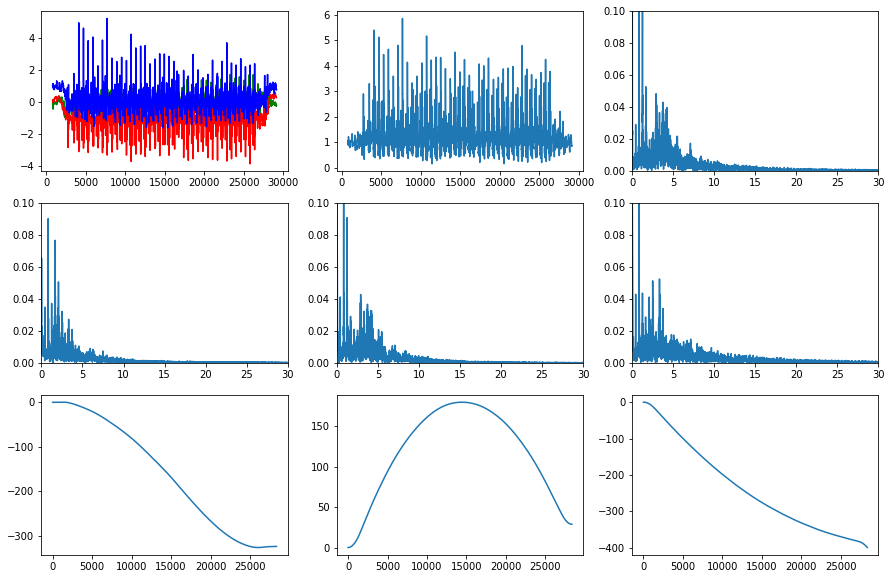

/Users/ksushazinoveva/Downloads/kaggle_data/track_135.csv
0.8291288854390855
0.12784165979576426


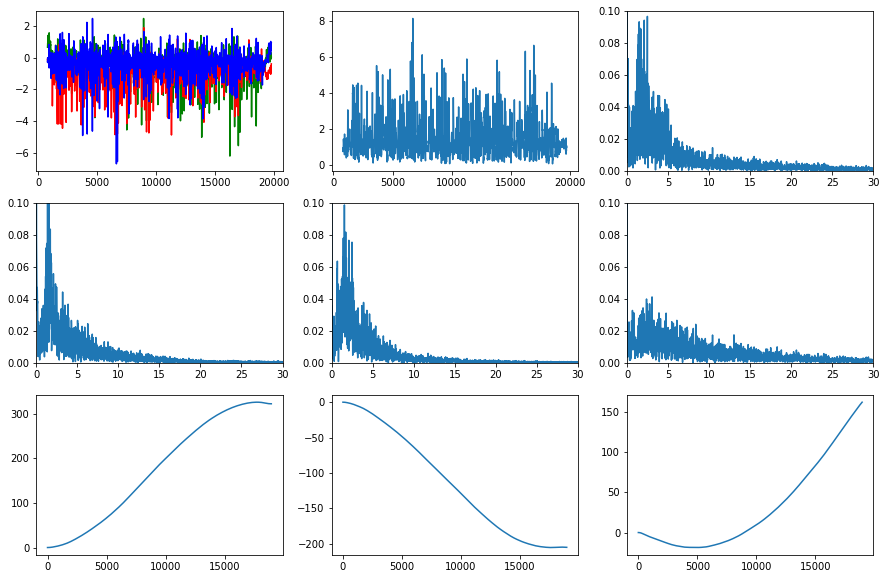

/Users/ksushazinoveva/Downloads/kaggle_data/track_134.csv
2.466497836868207
0.09675870177489594


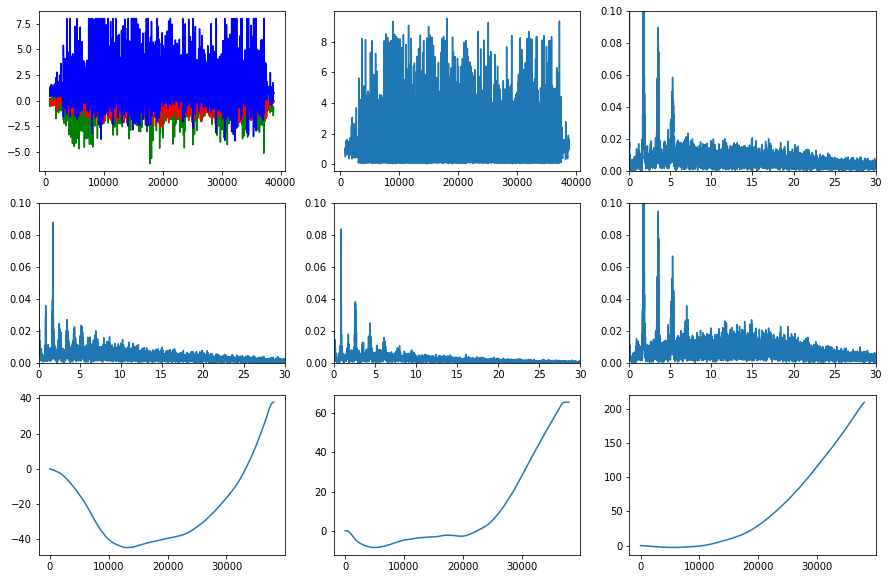

/Users/ksushazinoveva/Downloads/kaggle_data/track_120.csv
1.7494935676514691
0.28731622530907985


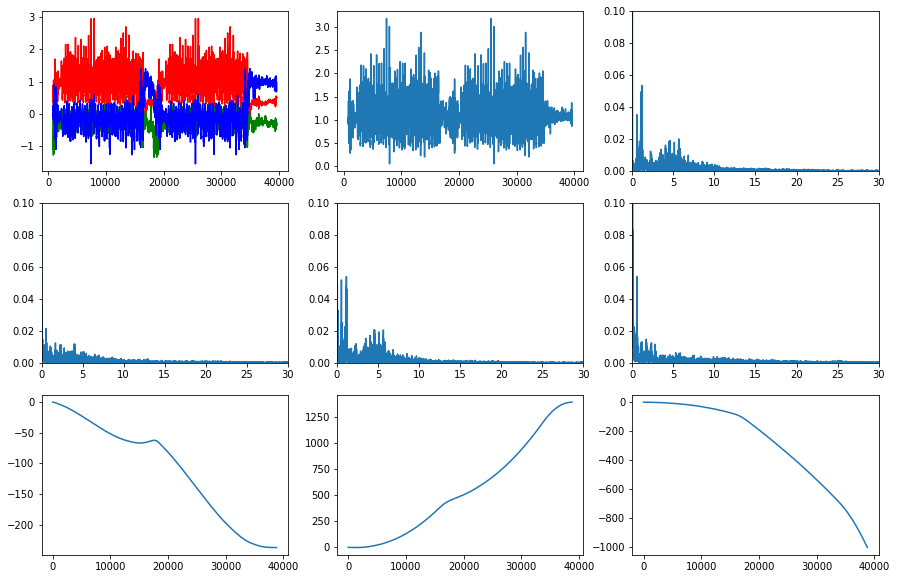

/Users/ksushazinoveva/Downloads/kaggle_data/track_108.csv
1.1469367767210494
0.05355924297592422


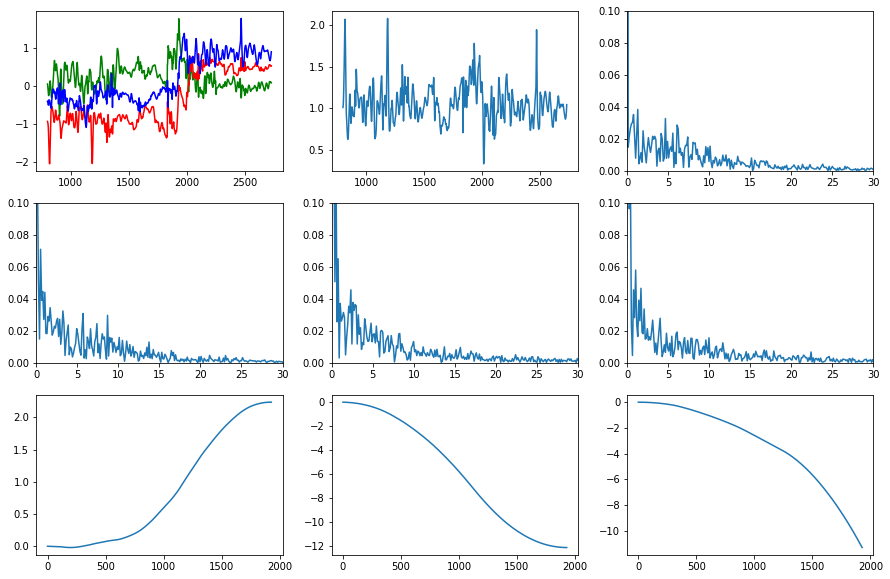

/Users/ksushazinoveva/Downloads/kaggle_data/track_11.csv
1.2953367875647668
0.038548929213062195


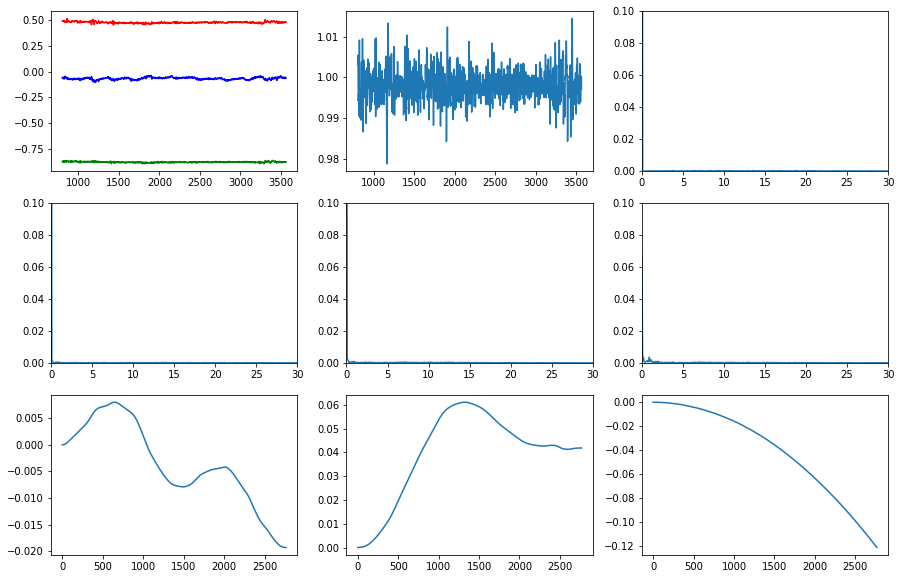

/Users/ksushazinoveva/Downloads/kaggle_data/track_39.csv
13.552584026020963
0.00039548175549753


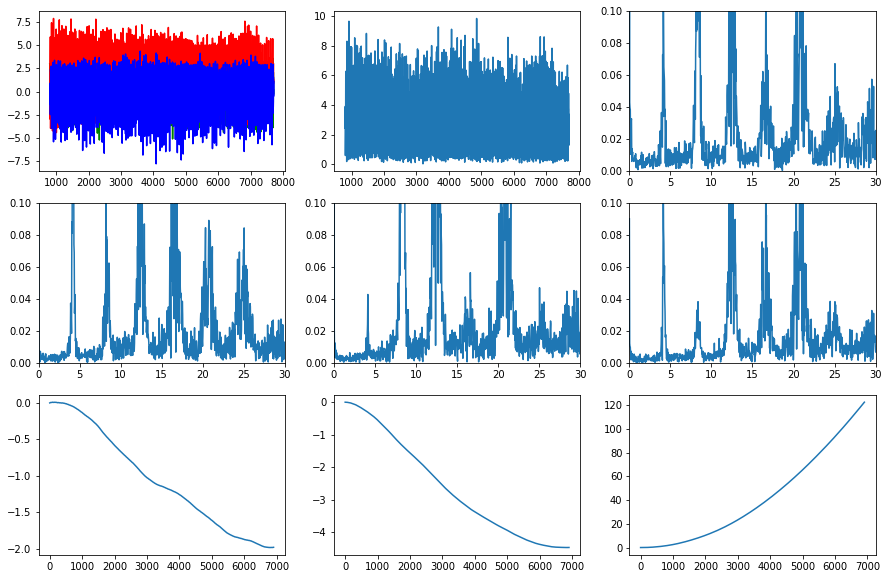

/Users/ksushazinoveva/Downloads/kaggle_data/track_13.csv
12.489139878366638
0.2189437046004593


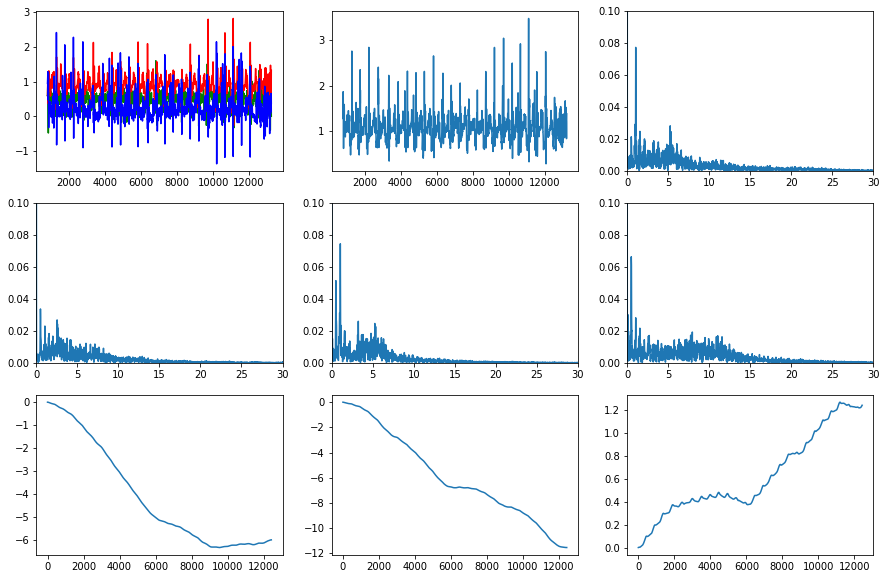

/Users/ksushazinoveva/Downloads/kaggle_data/track_136.csv
1.0455203474344539
0.07737389470321421


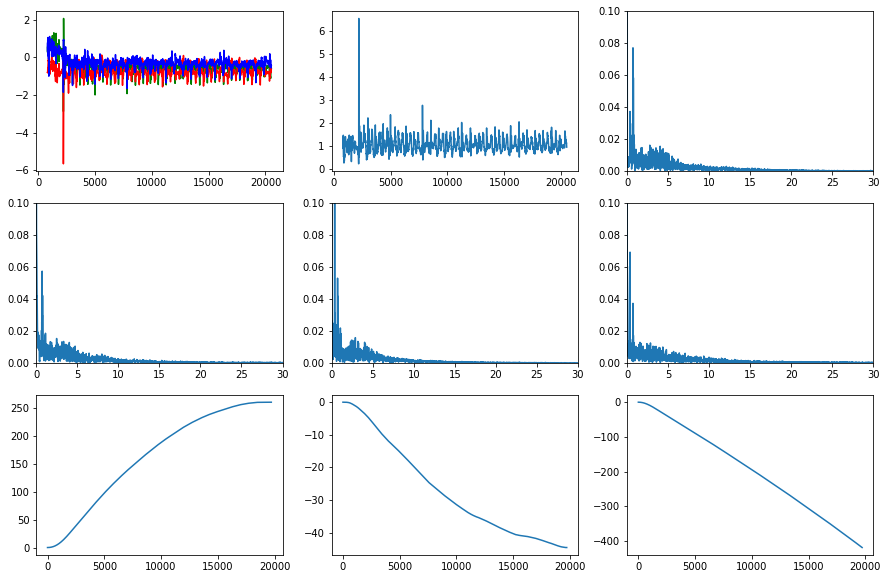

/Users/ksushazinoveva/Downloads/kaggle_data/track_122.csv
0.7101552196408644
0.07708833142608158


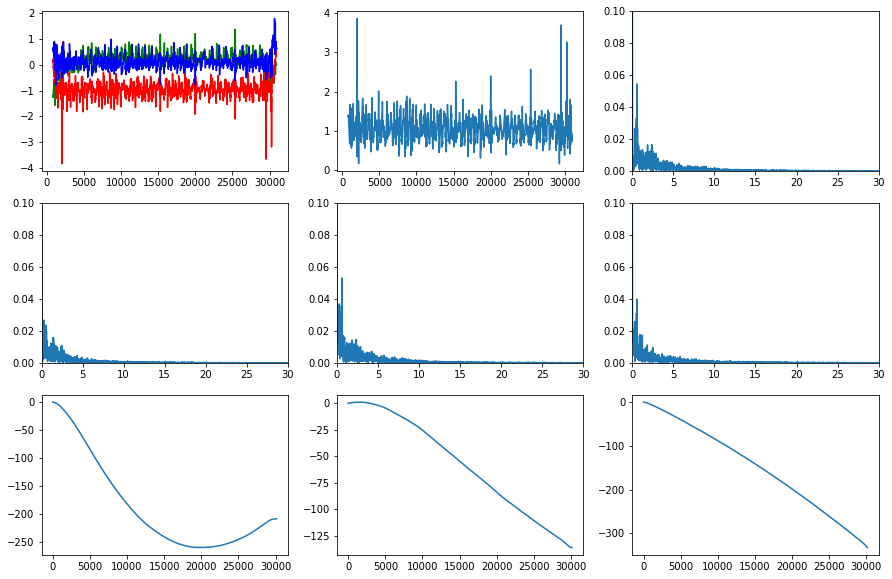

/Users/ksushazinoveva/Downloads/kaggle_data/track_123.csv
0.5888597684371164
0.05448403053747669


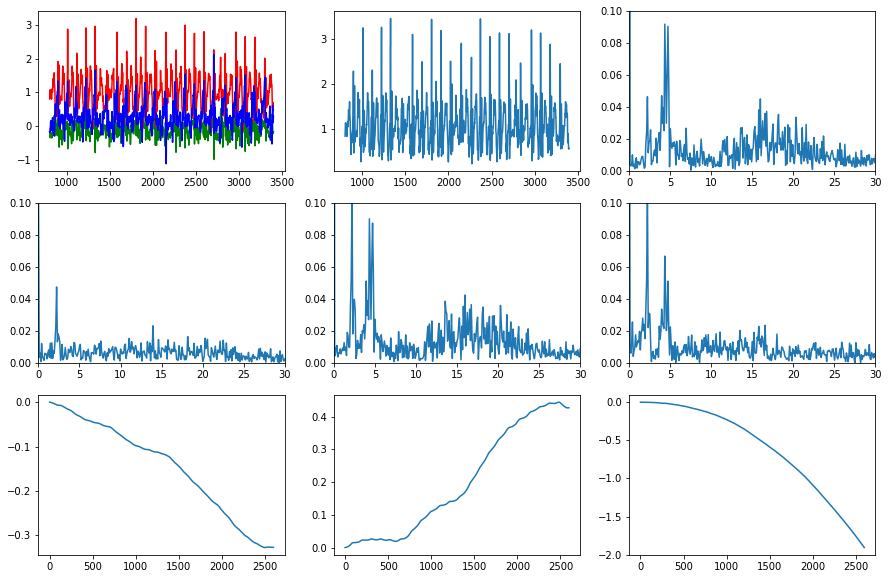

/Users/ksushazinoveva/Downloads/kaggle_data/track_137.csv
4.330254041570439
0.09192641779665764


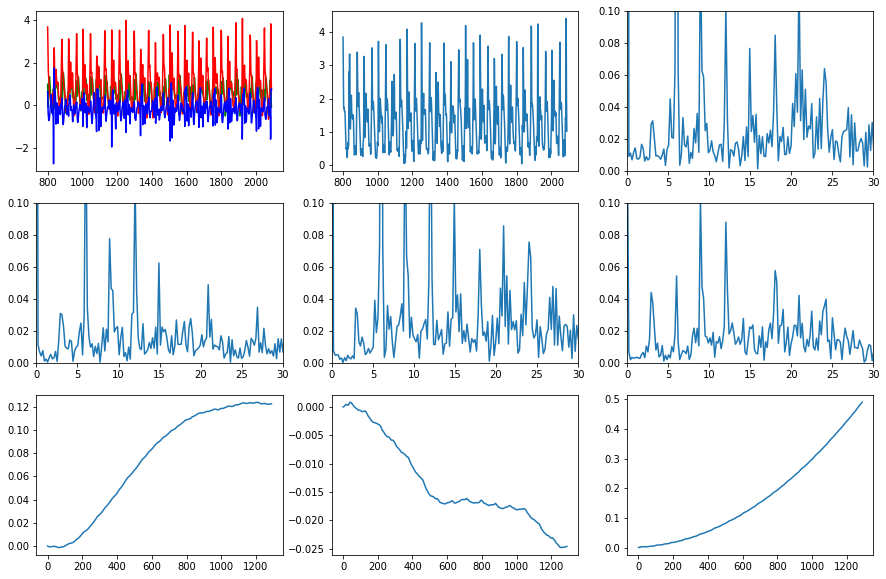

/Users/ksushazinoveva/Downloads/kaggle_data/track_12.csv
6.007751937984496
0.39980148705018065


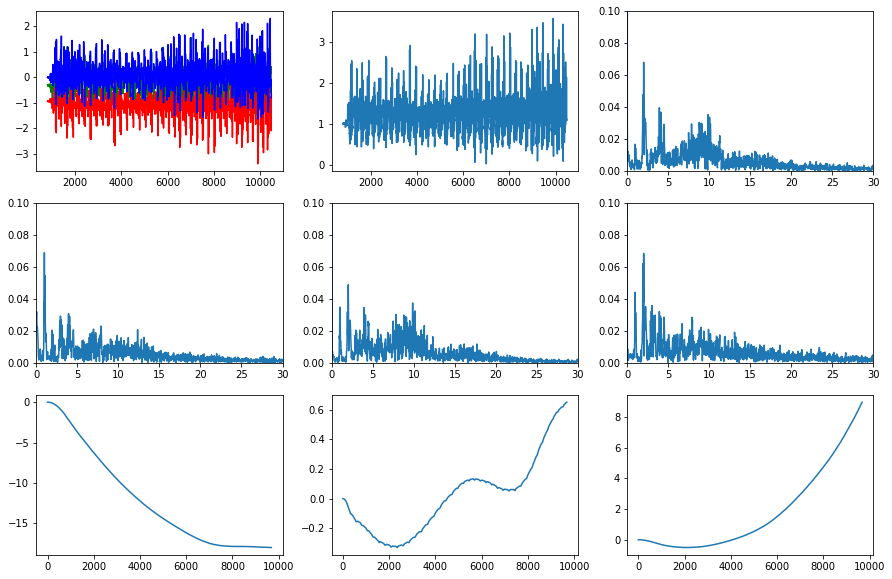

/Users/ksushazinoveva/Downloads/kaggle_data/track_16.csv
2.014046684569304
0.06804640945043379


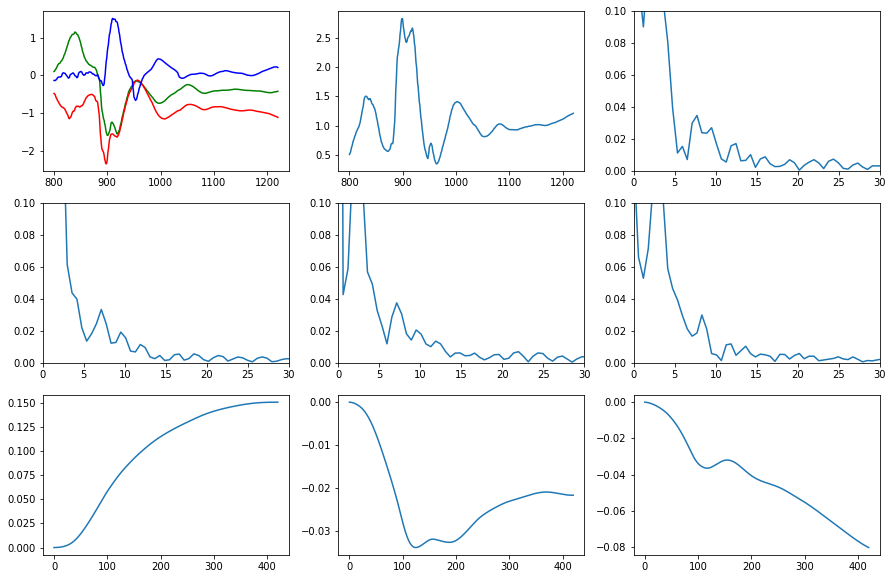

/Users/ksushazinoveva/Downloads/kaggle_data/track_133.csv
2.969121140142518
0.17527173300981846


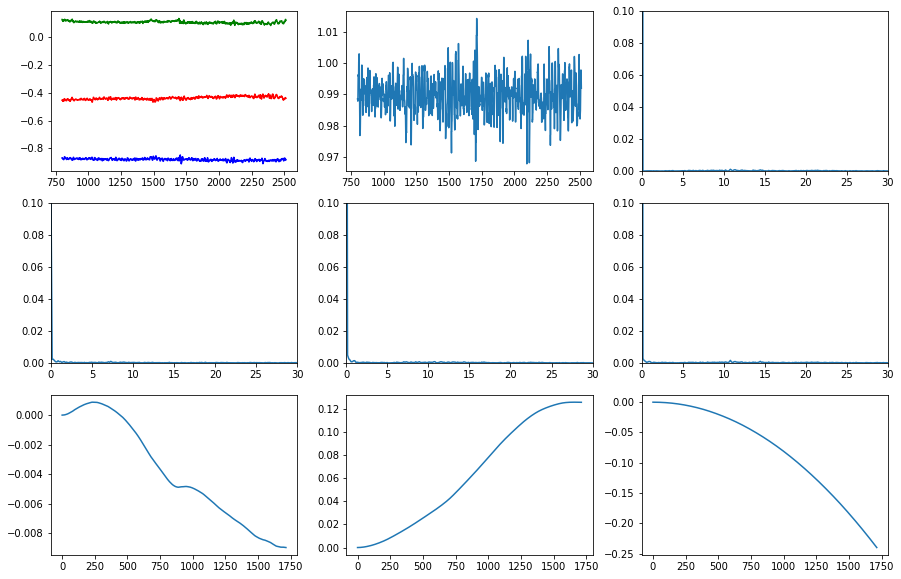

/Users/ksushazinoveva/Downloads/kaggle_data/track_127.csv
10.793465577596267
0.0011253550824595886


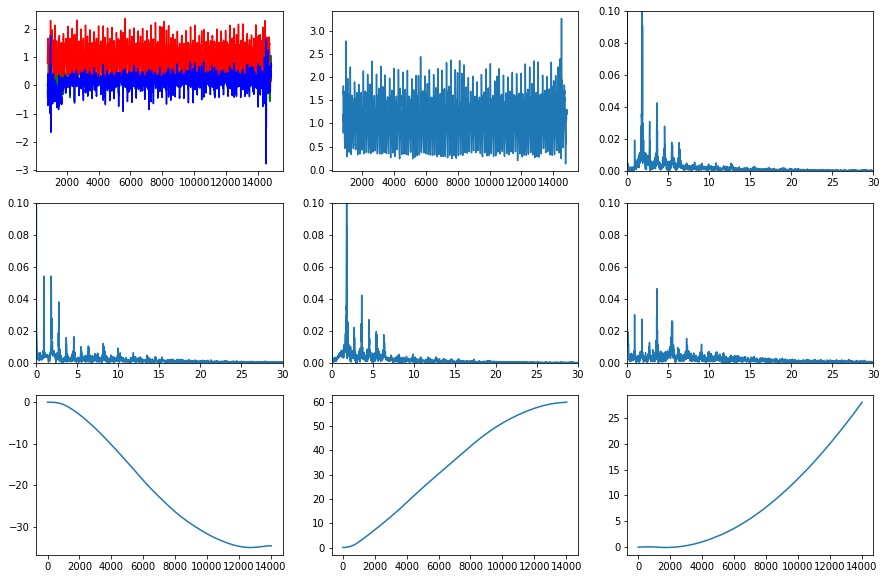

/Users/ksushazinoveva/Downloads/kaggle_data/track_126.csv
1.816368687228435
0.2336069771749646


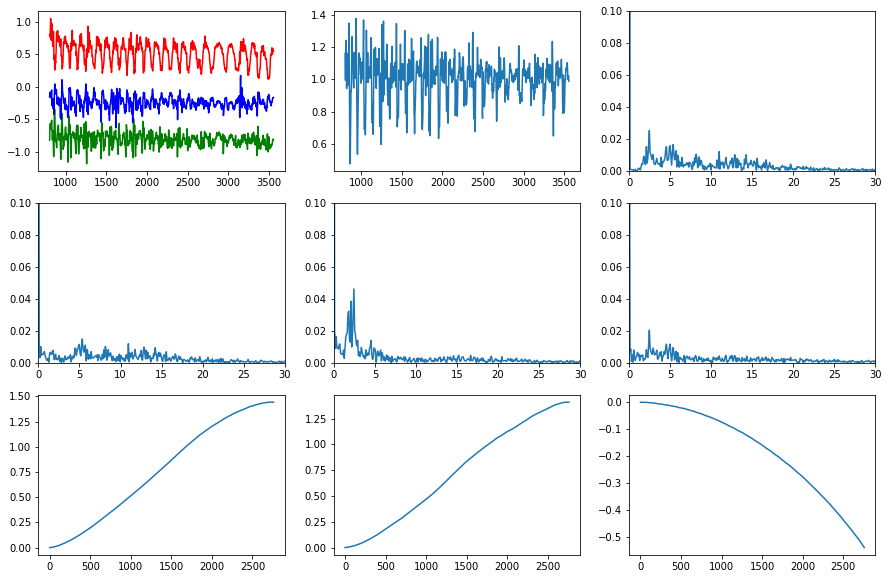

/Users/ksushazinoveva/Downloads/kaggle_data/track_132.csv
2.4456521739130435
0.025299590427691664


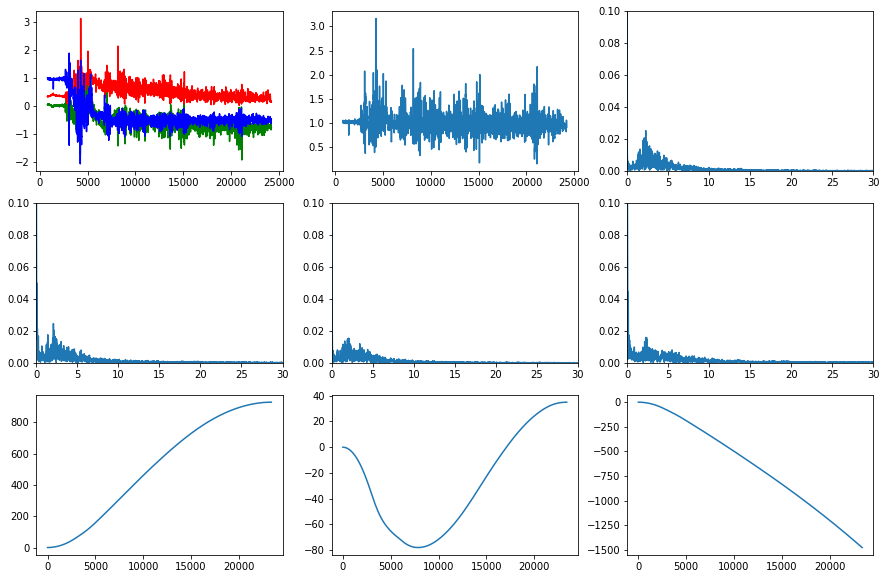

/Users/ksushazinoveva/Downloads/kaggle_data/track_17.csv
2.2636029725805074
0.02534299401119549


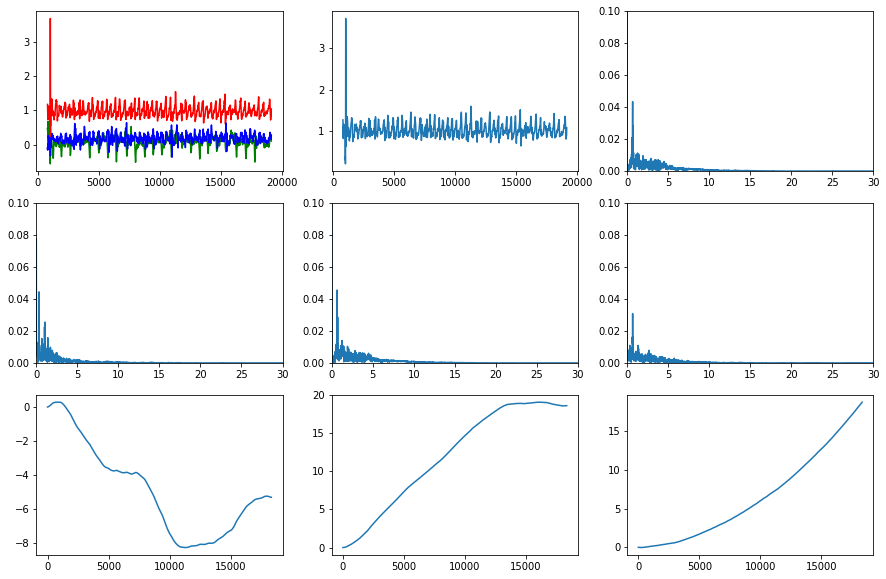

/Users/ksushazinoveva/Downloads/kaggle_data/track_15.csv
0.6682668703289509
0.04342912330410529


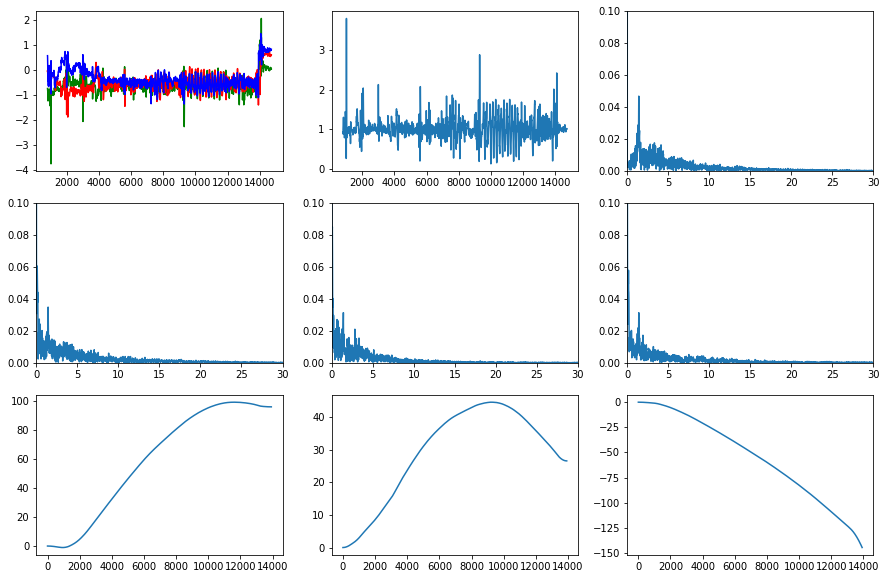

/Users/ksushazinoveva/Downloads/kaggle_data/track_29.csv
1.4184142487790865
0.046864858121964545


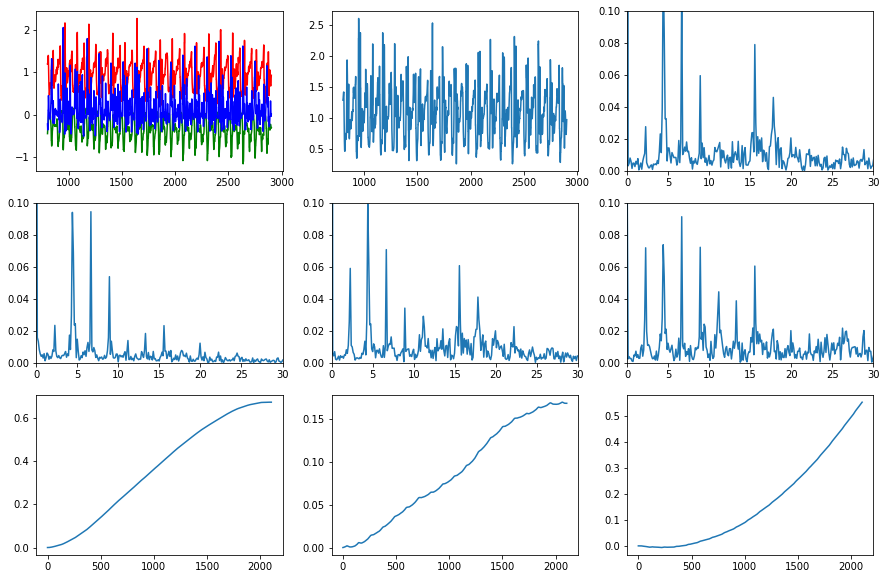

/Users/ksushazinoveva/Downloads/kaggle_data/track_124.csv
4.394299287410926
0.12867833751637173


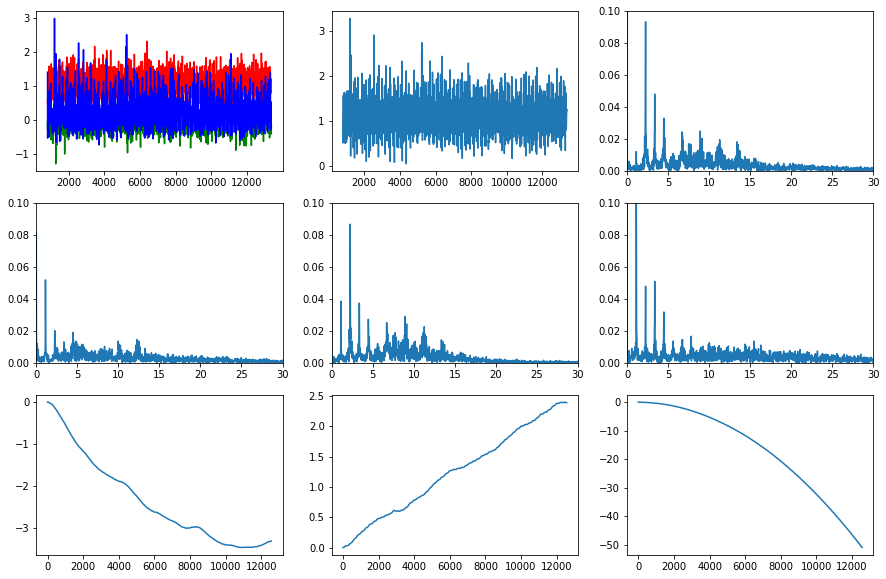

/Users/ksushazinoveva/Downloads/kaggle_data/track_130.csv
2.2475932850664333
0.09341701664256445


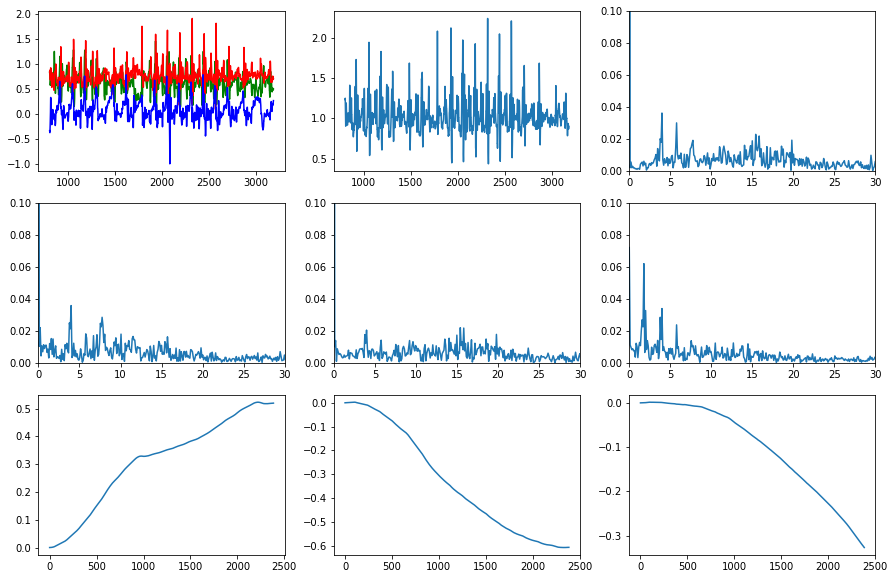

/Users/ksushazinoveva/Downloads/kaggle_data/track_118.csv
3.9832285115303985
0.03630958202364504


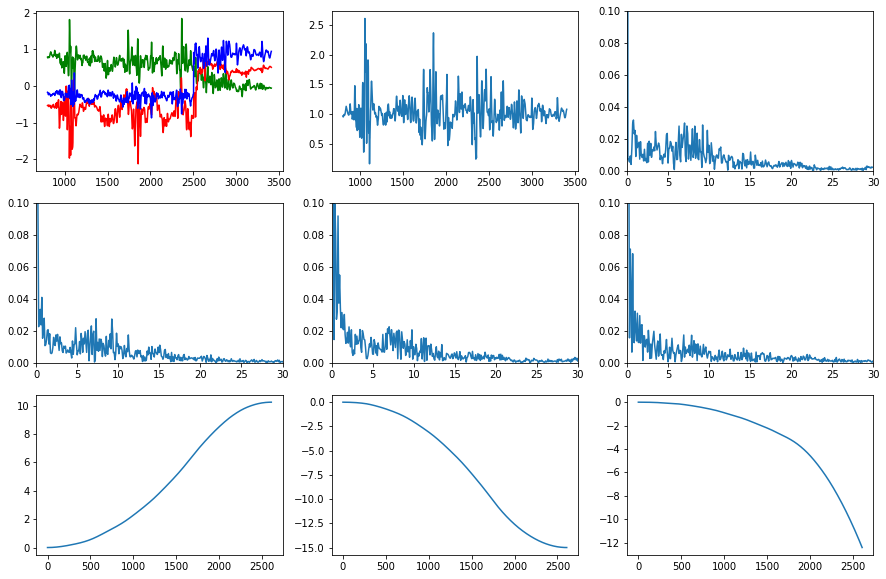

/Users/ksushazinoveva/Downloads/kaggle_data/track_119.csv
0.7665772326561902
0.03193432165720096


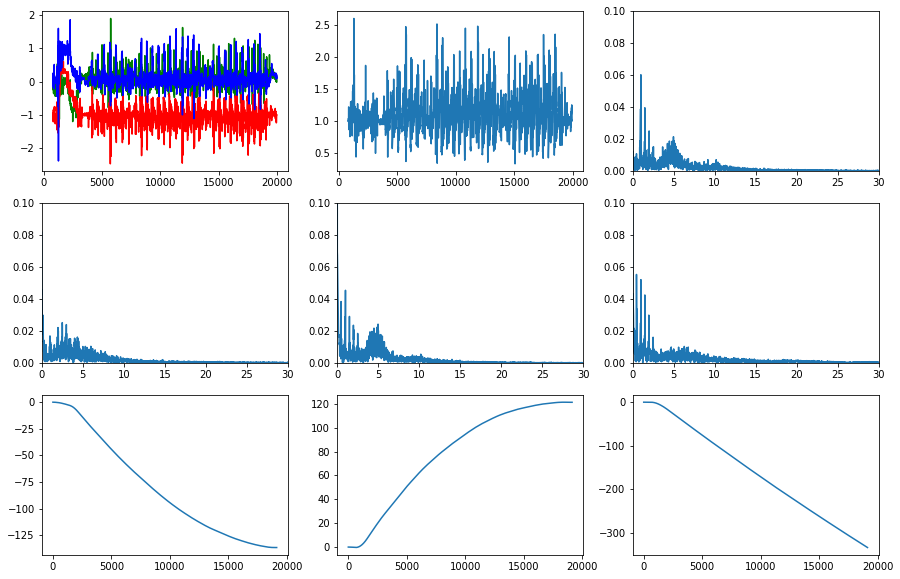

/Users/ksushazinoveva/Downloads/kaggle_data/track_131.csv
1.0186491145588465
0.06024976313340163


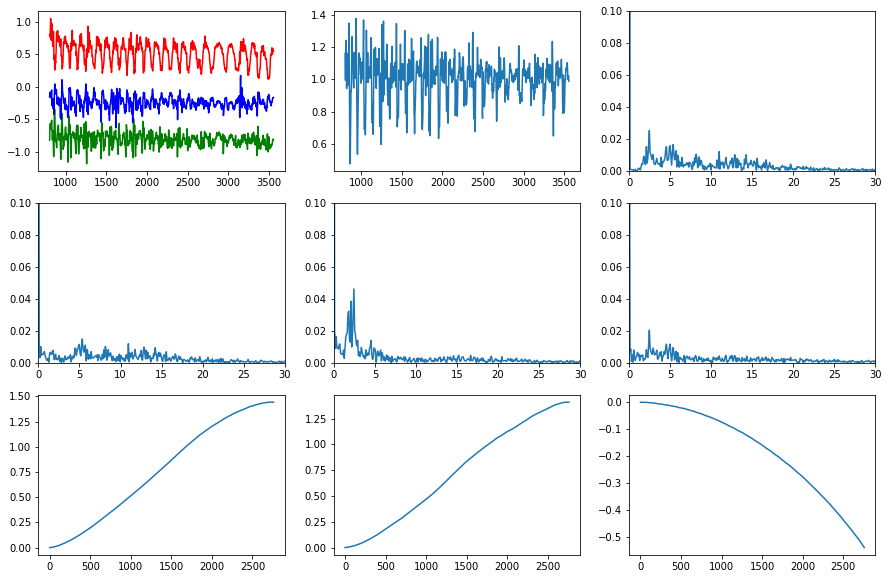

/Users/ksushazinoveva/Downloads/kaggle_data/track_125.csv
2.4456521739130435
0.025299590427691664


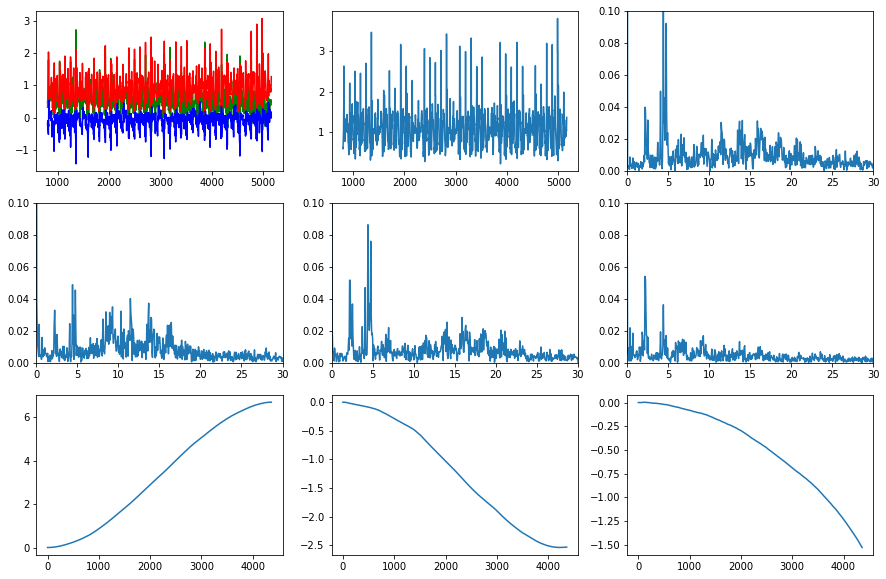

/Users/ksushazinoveva/Downloads/kaggle_data/track_28.csv
4.412101764840705
0.10250663419581525


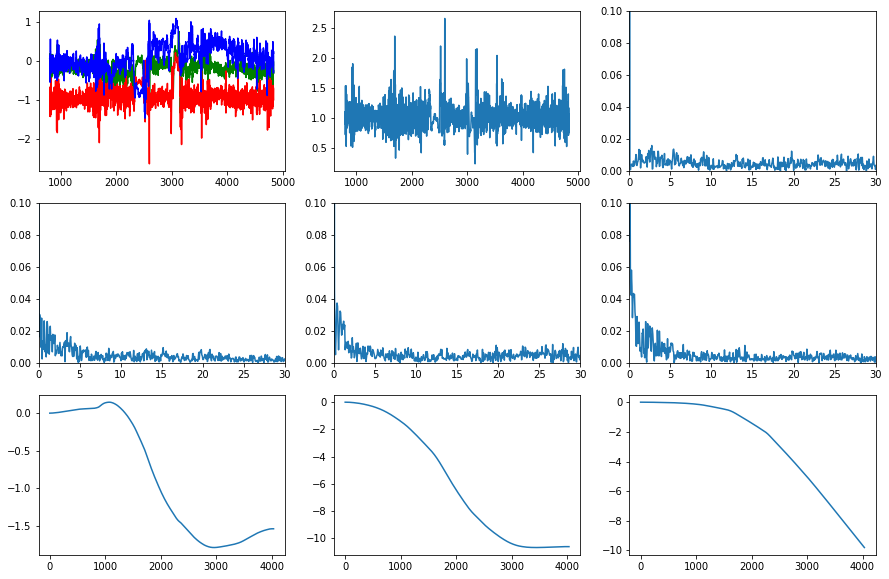

/Users/ksushazinoveva/Downloads/kaggle_data/track_14.csv
2.7268220128904312
0.015998135178794937


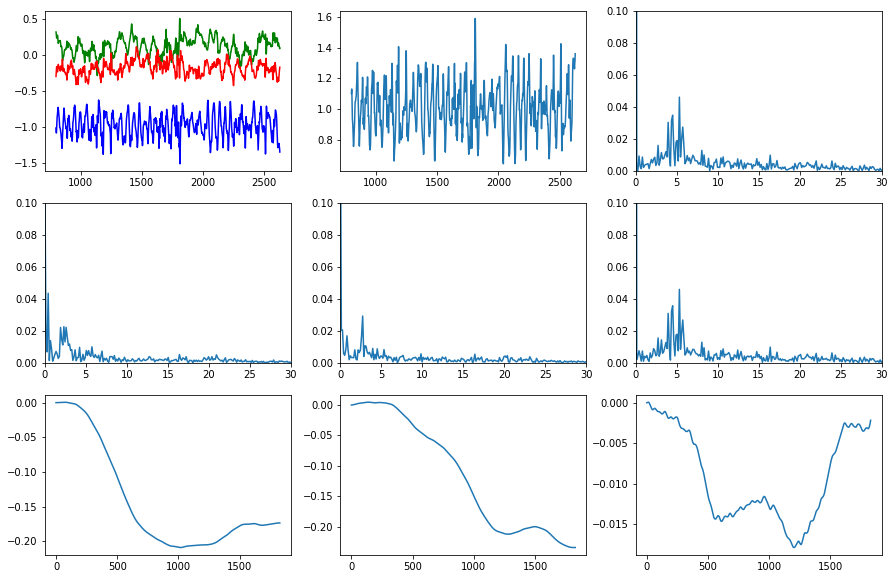

/Users/ksushazinoveva/Downloads/kaggle_data/track_8.csv
5.330781848004374
0.04622970749759677


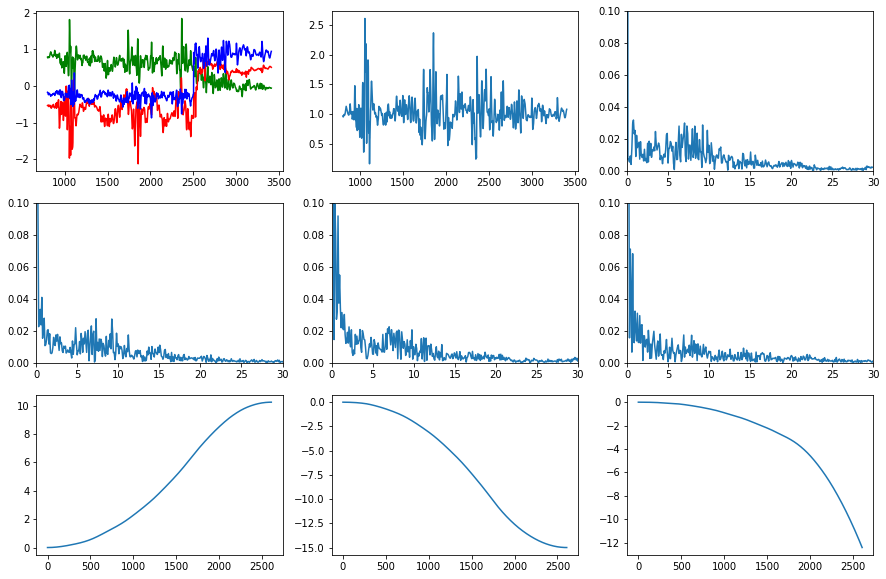

/Users/ksushazinoveva/Downloads/kaggle_data/track_73.csv
0.7665772326561902
0.03193432165720096


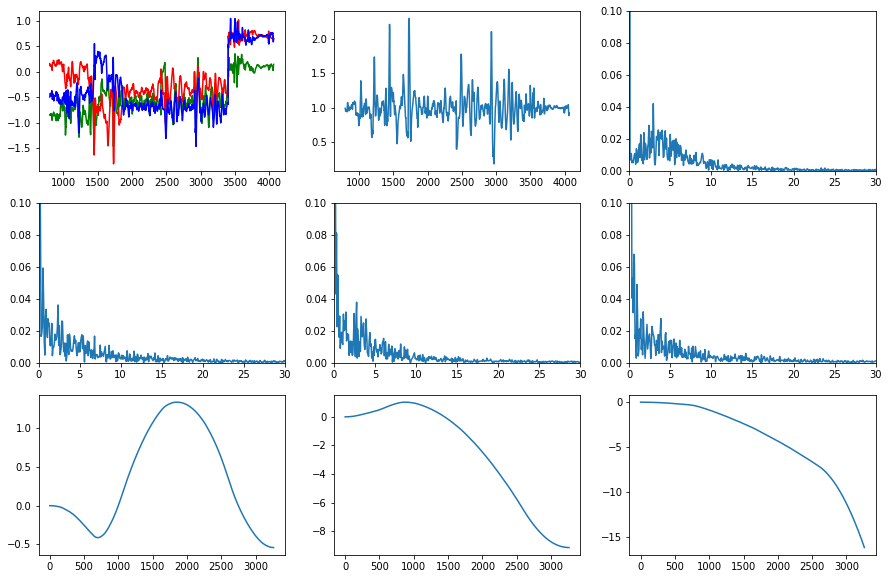

/Users/ksushazinoveva/Downloads/kaggle_data/track_67.csv
2.9123237277743717
0.04219726022809745


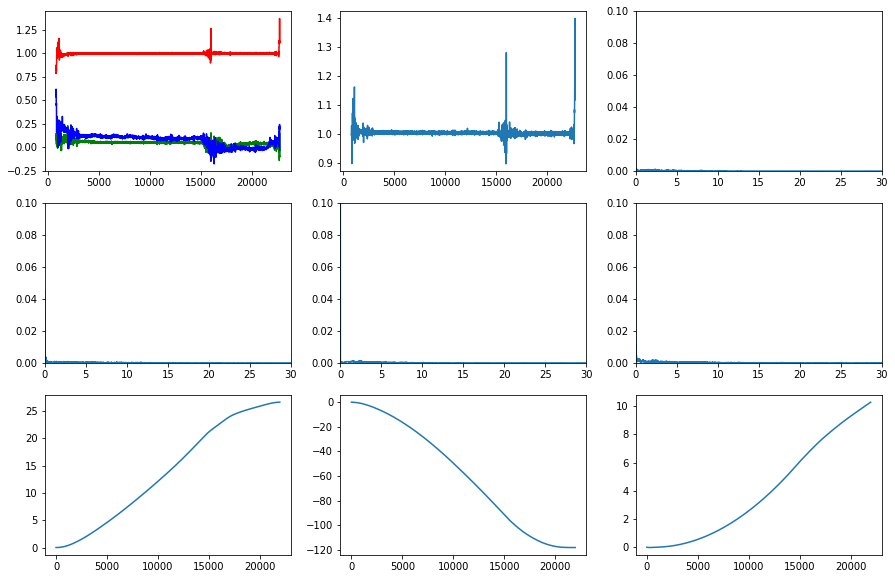

/Users/ksushazinoveva/Downloads/kaggle_data/track_98.csv
0.0227842333105491
0.0016002685054716918


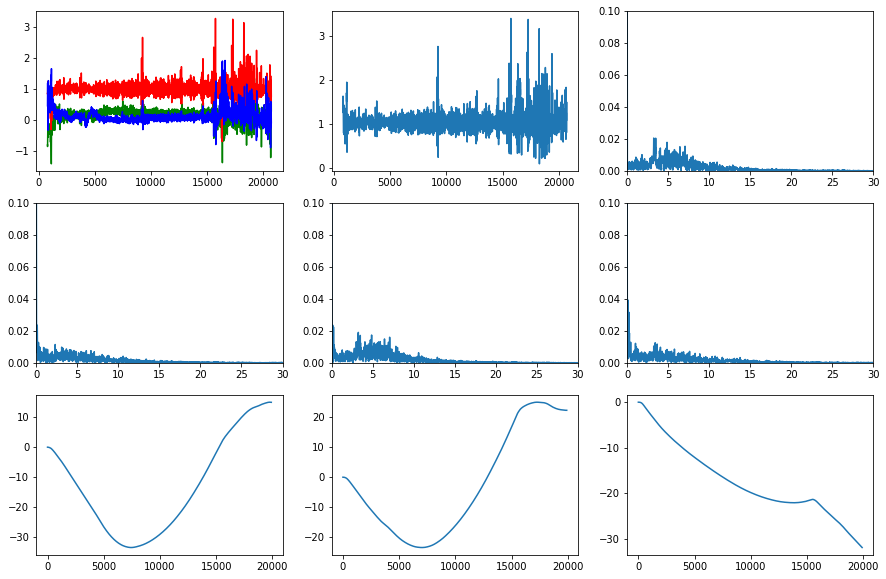

/Users/ksushazinoveva/Downloads/kaggle_data/track_142.csv
3.239740820734341
0.020668472525731344


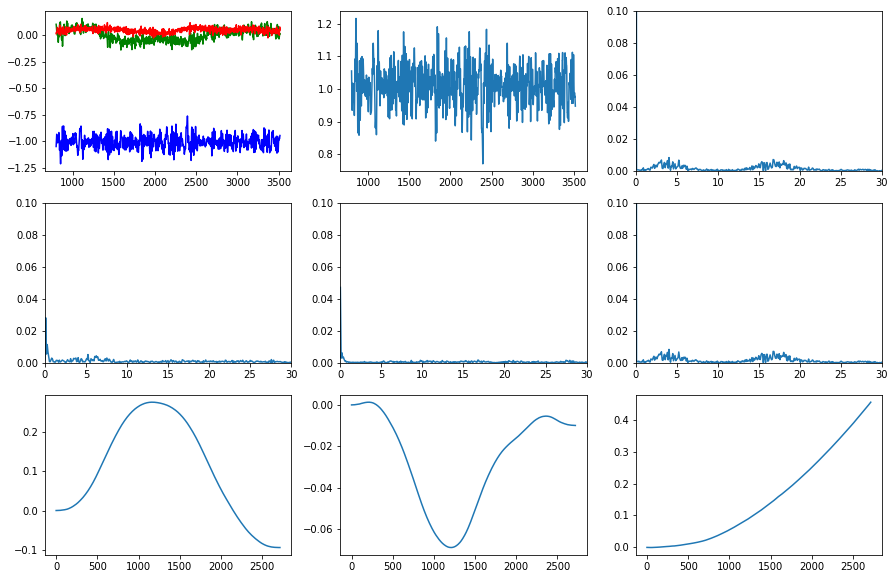

/Users/ksushazinoveva/Downloads/kaggle_data/track_143.csv
4.047093451066961
0.008452214628433206


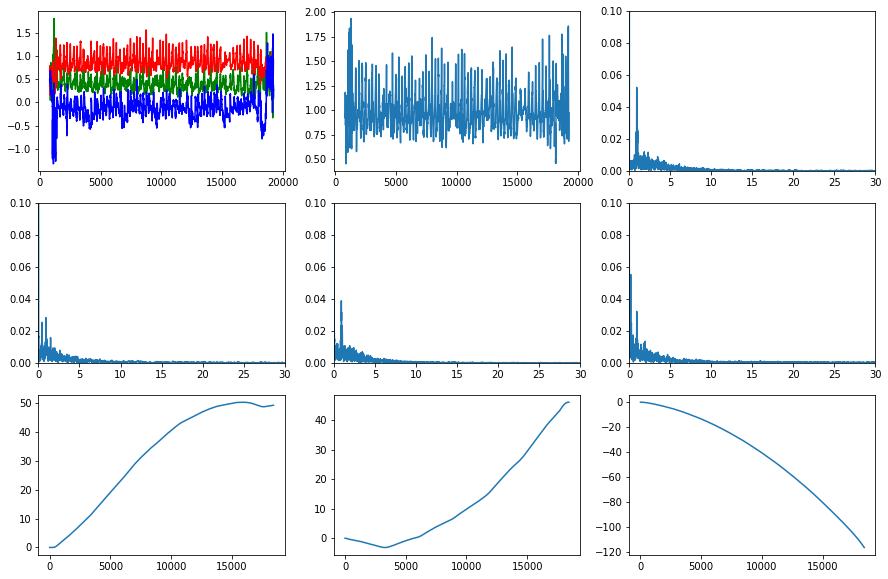

/Users/ksushazinoveva/Downloads/kaggle_data/track_99.csv
0.9088442756375474
0.052387496925465626


/Users/ksushazinoveva/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice.
/Users/ksushazinoveva/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/ksushazinoveva/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: RuntimeWarning: Mean of empty slice.
/Users/ksushazinoveva/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:47: RuntimeWarning: Mean of empty slice.


IndexError: list index out of range

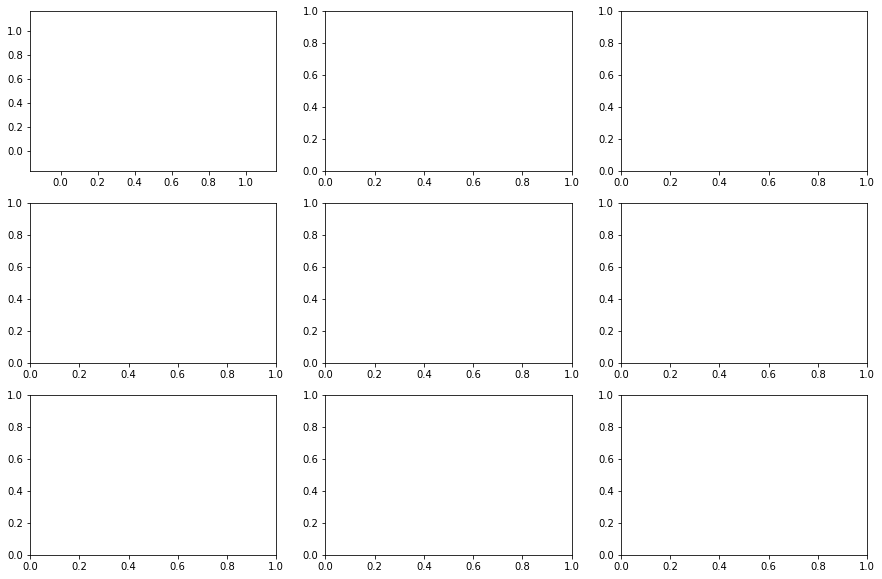

In [558]:
import pandas as pd
from matplotlib import pylab as plt
%pylab inline

def process_data(df, comma=True, cut=True, name = "", a=-1, b=-1):
    
    #print(name)
    
    if a == -1:
        st = 800
    else:
        st = a
            
    if b == -1:
        end = -800
    else:
        end = b
        
    if cut == False:
        st = 0
        end = -1

    #print(name)
    fig, ((ax1, ax2, ax3),(ax4, ax5, ax6),(ax7, ax8, ax9)) = plt.subplots(nrows=3, ncols=3, figsize=(15,10))
    
    if comma is True:
        df = df.applymap(lambda x: str(x).replace(',','.'))
        df['gFx'] = df['gFx'].astype(float)
        df['gFy'] = df['gFy'].astype(float)
        df['gFz'] = df['gFz'].astype(float)
    if cut:
        ax1.plot(df.iloc[st:end]['gFx'],c='g')
        ax1.plot(df.iloc[st:end]['gFy'],c='r')
        ax1.plot(df.iloc[st:end]['gFz'],c='b')
    else:
        ax1.plot(df['gFx'],c='g')
        ax1.plot(df['gFy'],c='r')
        ax1.plot(df['gFz'],c='b')
#        show()
########################################################################        
#integration

#вычисляем средний вектор ускорения по треку

    mx = df.iloc[st:end]['gFx'].values.mean() 
    my = df.iloc[st:end]['gFy'].values.mean() 
    mz = df.iloc[st:end]['gFz'].values.mean() 
    
#находим матрицу поворота этого вектора к вектору (0,0,1)

    Vec = [mx,my,mz]
    Point = [0, 0, 1]
    mat = rotation_matrix_from_vectors(Vec, Point)
    
#каждую точку трека поворачиваем на эту матрицу

    new_x, new_y, new_z = rotate(df.iloc[st:end]['gFx'].values, df.iloc[st:end]['gFy'].values, df.iloc[st:end]['gFz'].values, mat)

#проверяем, что новые средние равны примерно (0,0,1). Если это не так, значит, телефон часто поворачивался при движении, и нам не поможет это преобразование

    #print('New means:', mean(new_x), mean(new_y), mean(new_z))

#делим на 250*250 (это нужно было еще при интегрировании)
    new_x = [elem / 62500 for elem in new_x]
    new_y = [elem / 62500 for elem in new_y]
#из ускорения по z вычитаем 1 (g), чтобы убрать влияние силы тяжести и оставить только ускорение по z
    new_z = [(elem - 1)/62500 for elem in new_z]
    
#дважды интегрируем ускорение, чтобы получить перемещение вдоль каждой оси
    v_x = integrate(new_x)
    int_x = integrate(v_x)
    move_x = int_x[-1]
    ax7.plot(int_x)
    
    v_y = integrate(new_y)
    int_y = integrate(v_y)
    move_y = int_y[-1]
    ax8.plot(int_y)
    
    v_z = integrate(new_z)
    int_z = integrate(v_z)
    move_z = int_z[-1]
    ax9.plot(int_z)
    
    
    v = (np.mean(v_x) ** 2 + np.mean(v_y) ** 2 + np.mean(v_z) ** 2) ** 0.5
########################################################################        
#преобразование Фурье
########################################################################        

    Fs = 250 #частота сбора данных
    y = df.iloc[st:end]['gFx'].values
    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[:len(frq)//2] # one side frequency range

    Y = np.fft.fft(y)/n # dft and normalization
    Y = Y[:n//2]
    
    yabs = abs(Y)
    
    Min = 0
    
    ax4.plot(frq,yabs) # plotting the spectrum
    ax4.set_xlim([0,30]) #очень большие частоты нам не нужны
    ax4.set_ylim([Min,0.1]) #не смотрим на близкие к нулю величины частот

    
    y = df.iloc[st:end]['gFy'].values
    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[:len(frq)//2] # one side frequency range

    Y = np.fft.fft(y)/n # dft and normalization
    Y = Y[:n//2]
    
    yabs = abs(Y)
    
    ax5.plot(frq,yabs) # plotting the spectrum
    ax5.set_xlim([0,30])
    ax5.set_ylim([Min,0.1])


    y = df.iloc[st:end]['gFz'].values
    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[:len(frq)//2] # one side frequency range

    Y = np.fft.fft(y)/n # dft and normalization
    Y = Y[:n//2]
    
    yabs = abs(Y)
   
    ax6.plot(frq,yabs) # plotting the spectrum
    ax6.set_xlim([0,30])
    ax6.set_ylim([Min,0.1])


    Acc = (df.gFx[st:end] ** 2 + df.gFy[st:end] ** 2 + df.gFz[st:end] ** 2) ** 0.5

    y = Acc.values
    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[:len(frq)//2] # one side frequency range

    Y = np.fft.fft(y)/n # dft and normalization
    Y = Y[:n//2]
    
    yabs = abs(Y)
    ax3.plot(frq,yabs) # plotting the spectrum
    ax3.set_xlim([0,30])
    ax3.set_ylim([Min,0.1])
    frq = frq[1:(int(len(yabs)/3))]
    yabs = yabs[1:(int(len(yabs)/3))]
    xmax = frq[numpy.argmax(yabs)]
    ymax = max(yabs)
########################################################################        
    
    Acc = (df.gFx[st:end] ** 2 + df.gFy[st:end] ** 2 + df.gFz[st:end] ** 2) ** 0.5
    ax2.plot(Acc)
    plt.show()
    
    #print(name + ' Амплитуда:', Acc.max()-Acc.min())
    amplitude1 = Acc.max() - Acc.min()
    '''
    column_values = pd.Series( (df.gFx ** 2 + df.gFy ** 2 + df.gFz ** 2) ** 0.5 )
    df.insert(loc=0, column='AbsAcc', value=column_values)
    var = 0.0
    mid = df.AbsAcc.mean()
    for row in df.itertuples():
        var += (row.AbsAcc - mid) ** 2
    var /= (df.shape[0] - 1)
    '''
    print(name, xmax, ymax, sep = '\n')
    return (amplitude1, v, xmax, ymax, move_x, move_y, move_z)

Var = np.zeros(len(Data))
Ampl = np.zeros(len(Data))
Ampl_z = np.zeros(len(Data))
Pick_y =np.zeros(len(Data))
Pick_x = np.zeros(len(Data))
Move_x = np.zeros(len(Data))
Move_y = np.zeros(len(Data))
Move_z = np.zeros(len(Data))
#Freq = []
#Bike = []
for df, target in zip(Data,Target):
    track_num = int(target.split('_')[2].split('.')[0])
    p_data = process_data(df, name=target)
    Ampl[track_num] = p_data[0]
    #Var.append(process_data(df, name=target)[1])
    Ampl_z[track_num] = p_data[1]
    Pick_x[track_num] = p_data[2]
    Pick_y[track_num] = p_data[3]
    Move_x[track_num] = p_data[4]
    Move_y[track_num] = p_data[5]
    Move_z[track_num] = p_data[6]
    #Bike.append(process_data(df, name=target)[1])
'''
Ampl = []
Var = []
Ampl_z =[]
Pick_y = []
Pick_x = []

for df, target in zip(Data,Target):
    p_data = process_data(df, name=target)
    Ampl.append(p_data[0])
    Ampl_z.append(p_data[1])
    Pick_x.append(p_data[2])
    Pick_y.append(p_data[3])
    #Bike.append(process_data(df, name=target)[1])
'''

In [365]:
import pandas as pd
from matplotlib import pylab as plt
%pylab inline

def f(x):
    return (x[0] ** 2 + x[1] ** 2 + x[2] ** 2) ** 0.5
def time(x):
    return x[-7:]


def process_data1(df, comma=True, cut=True, name = "", a=-1, b=-1):
    
# обрезаем начало и конец трека
    if a == -1:
        st = 800
    else:
        st = a
            
    if b == -1:
        end = -800
    else:
        end = b
        
    if cut == False:
        st = 0
        end = -1

    #print(name)
#     fig, ((ax1, ax2)) = plt.subplots(nrows=1, ncols=2, figsize=(15,6))

# приводим данные с Iphone к нужному формату
    if comma is True:
        df = df.applymap(lambda x: str(x).replace(',','.'))
        
        try:
            df['gFx'] = df['gFx'].astype(float)
            df['gFy'] = df['gFy'].astype(float)
            df['gFz'] = df['gFz'].astype(float)
        except KeyError:
            return -1

# рисуем графики ускорений
#     if cut:
#         ax1.plot(df.iloc[st:end]['gFx'],c='g')
#         ax1.plot(df.iloc[st:end]['gFy'],c='r')
#         ax1.plot(df.iloc[st:end]['gFz'],c='b')
#     else:
#         ax1.plot(df['gFx'],c='g')
#         ax1.plot(df['gFy'],c='r')
#         ax1.plot(df['gFz'],c='b')
        
# вычисляем модуль (норму) ускорения и рисуем его
    Acc = (df.gFx[st:end] ** 2 + df.gFy[st:end] ** 2 + df.gFz[st:end] ** 2) ** 0.5
#     ax2.plot(Acc)
     #plt.show()

# можно различить многие действия по амплитуде ускорения
    column_values = pd.Series( (df.gFx ** 2 + df.gFy ** 2 + df.gFz ** 2) ** 0.5 )
    df.insert(loc=0, column='AbsAcc', value=column_values)
    var = 0.0
    mid = df.AbsAcc.mean()
    for row in df.itertuples():
        var += (row.AbsAcc - mid) ** 2
    var /= (df.shape[0] - 1)
    return var

Var = np.zeros(len(Data))

for df, target in zip(Data,Target):
    track_num = int(target.split('_')[2].split('.')[0]) # важный момент, что треки не по нумерации идут!
    #print(process_data(df, name=target))
    #Ampl[track_num] = process_data(df, name=target)[0]
    Var[track_num] = process_data1(df, name=target)
    #Var.append(process_data1(df, name=target))

Populating the interactive namespace from numpy and matplotlib


/Users/ksushazinoveva/opt/anaconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['plt']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [364]:
Move_z


array([-3.39559641e-01,  6.60575582e+01, -1.47365470e+02,  5.61450358e+00,
       -8.55230704e+01, -5.21844840e-01, -1.49096453e+01,  3.13888032e+01,
       -2.16395167e-03,  0.00000000e+00,  2.61986081e+00, -1.13080278e+01,
        4.89773568e-01,  1.22765581e+02, -9.79995093e+00,  1.86911526e+01,
        8.97226280e+00, -1.47807062e+03, -2.65689704e-01, -1.45427427e+00,
       -9.25850402e-01, -6.65523723e+01, -1.12783229e+02, -4.74838910e+00,
        3.21765160e+00,  8.09109707e+01, -1.14163589e+01, -2.55329446e-02,
       -1.53154066e+00, -1.44444292e+02, -6.16582713e+00, -2.67055527e+02,
        4.85590133e+01,  5.42043416e+01,  1.87504308e-02,  1.28881247e-01,
       -1.19511177e-01, -1.20403747e+00, -4.92522182e-01, -1.21476342e-01,
       -8.44082619e-01,  3.38069084e+01, -6.38752736e-01, -7.11577747e+00,
       -1.49096453e+01, -4.74838910e+00, -3.36422372e-01, -6.45753355e-01,
        0.00000000e+00,  0.00000000e+00, -1.13080278e+01,  3.97128420e+02,
       -2.67348294e-03, -

In [261]:
good_indices = [i for i in range(len(Ampl)) if not (math.isnan(Ampl[i]) or Ampl[i]==1)]
good_indices = good_indices[:-1]
print(len(good_indices))
GoodData   = [Data[i] for i in good_indices]
GoodAmpl   = [Ampl[i] for i in good_indices]
GoodAmpl_z = [Ampl_z[i] for i in good_indices]
GoodVar = [Var[i] for i in good_indices]
GoodTarget = [Target[i] for i in good_indices]
GoodPick_x = [Pick_x[i] for i in good_indices]
GoodPick_y = [Pick_y[i] for i in good_indices]

132


In [283]:
advanced = [32, 34, 38, 46, 56, 59, 71, 101, 113, 142, 143]

In [559]:
def get_prediction(ampl, var, ampl_z, pick_x, pick_y, move_x, move_y, move_z, num):
    if num in advanced:
        if ampl_z > 0.3:
            return 8
        if ampl < 0.35:
            return 6
        if ampl < 1.9 and var < 0.007:
            return 5
        return 7
    else:
        if ampl > 3 and var > 0.45 and pick_y > 0.1:
                return 2
        if (1.4 < ampl < 7):
            if 1 < pick_x < 2 and (abs(move_y) > max(abs(move_x), abs(move_z))):
                return 4
            elif 1 < pick_x < 2:
                return 1
            if var < 0.25:
                return 3
        if var < 0.035 and pick_y < 0.025:
            return 0 #стояние
        return 1

In [551]:
#process_data(Data[111], name = Target[111])

In [560]:
prediction = [get_prediction(a, v, a_z, p_x, p_y, m_x, m_y, m_z, n) for a, v, a_z, p_x, p_y, m_x, m_y, m_z, n in zip(Ampl, Var, Ampl_z, Pick_x, Pick_y, 
                                                                                                                     Move_x, Move_y, Move_z, [i for i in range(146)])]
#answer = [get_action(target) for target in GoodTarget]

Res = pd.DataFrame({'track_num' : np.arange(len(Data)), 'action' : prediction})
Res.tail(10)

,track_num,action
136,136,4
137,137,3
138,138,1
139,139,0
140,140,0
141,141,0
142,142,7
143,143,5
144,144,0
145,145,0


In [561]:
Res['action'].value_counts()

3    55
0    42
1    30
4     8
6     5
5     4
7     2
Name: action, dtype: int64